In [1]:
%matplotlib inline
import platform
import pandas as pd
import json, csv
import pickle
from datetime import datetime
from operator import itemgetter
from pprint import pprint
import importlib
import itertools
from copy import deepcopy
import numpy as np
import math, time, collections, os, errno, sys, code, random
import matplotlib
#matplotlib.use('Agg')
import matplotlib.pyplot as plt
from sklearn import mixture
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from multiprocessing import Pool
import shutil
import configparser
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import spatial

####################################################
####################################################
@@@@@@@@@@@@ load_data start! @@@@@@@@@@@@


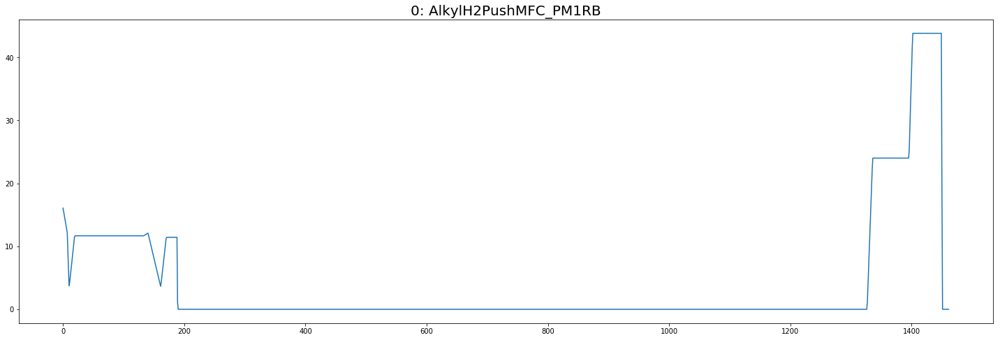

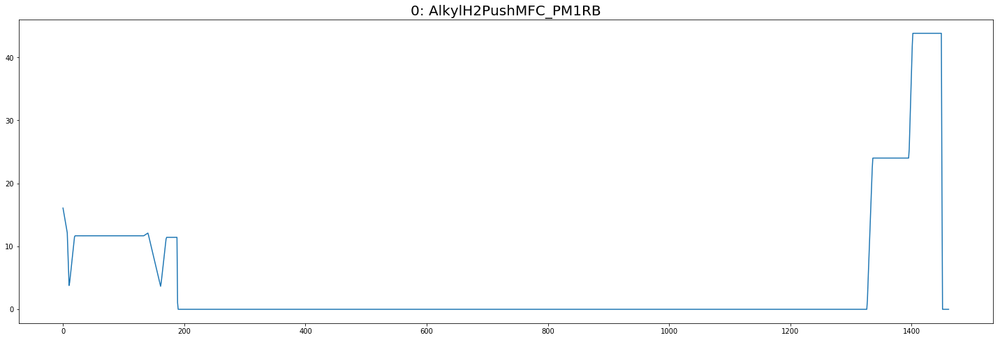

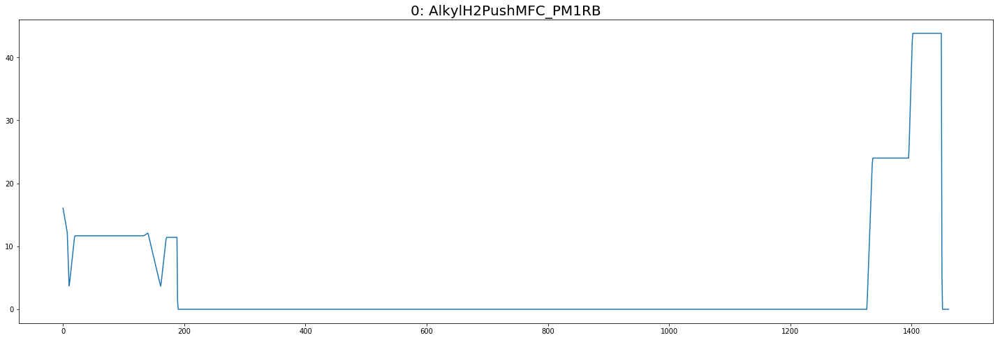

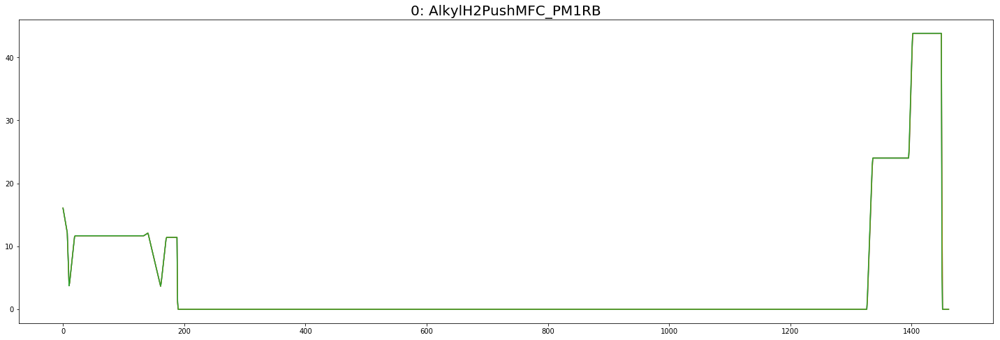

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


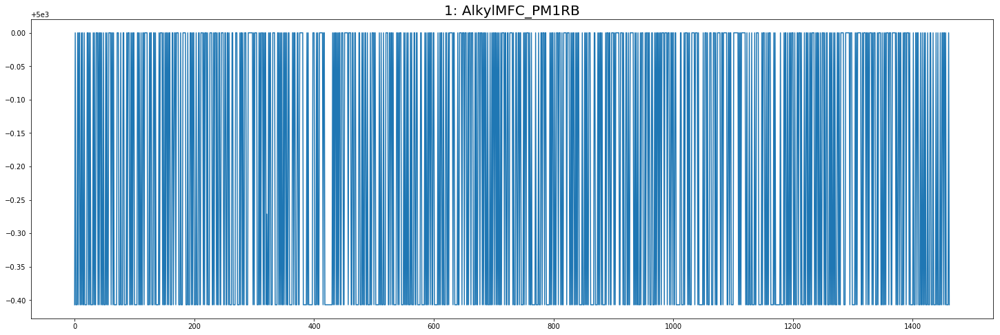

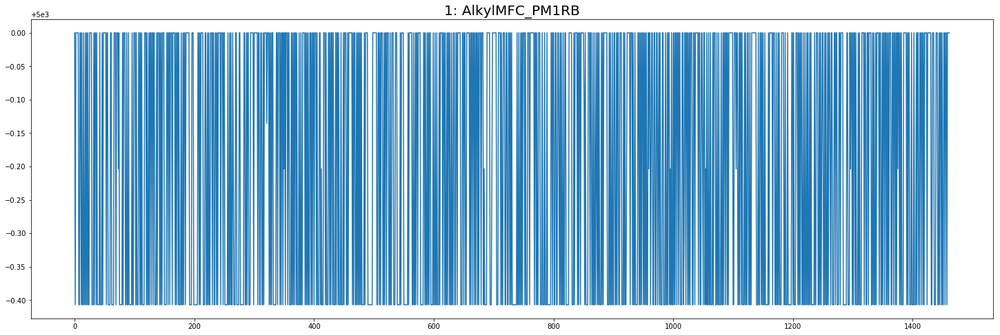

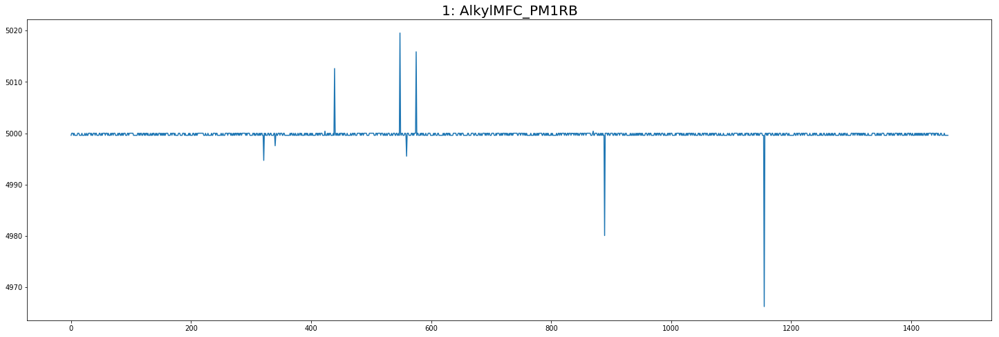

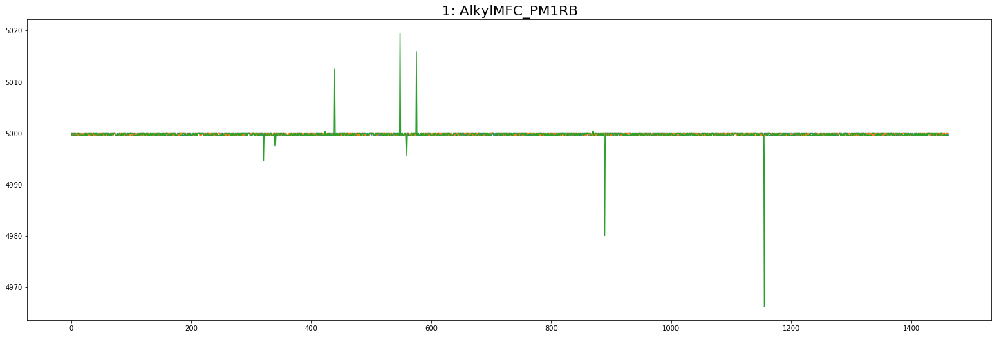

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


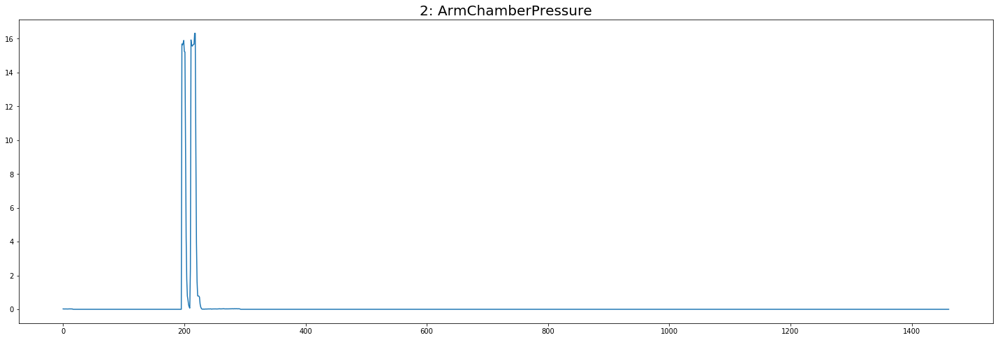

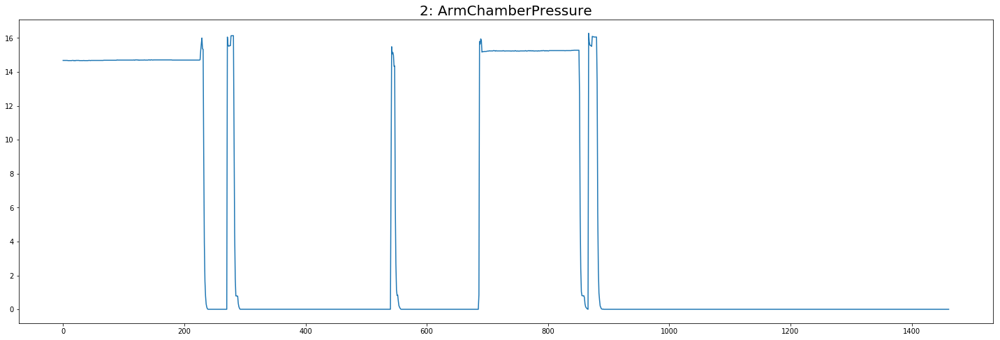

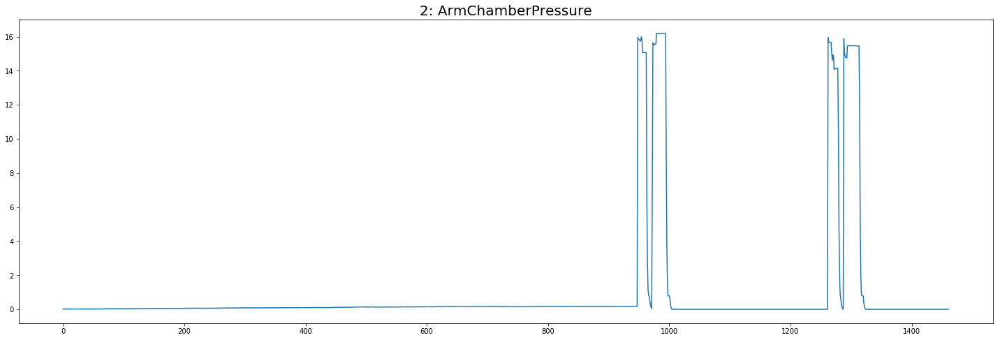

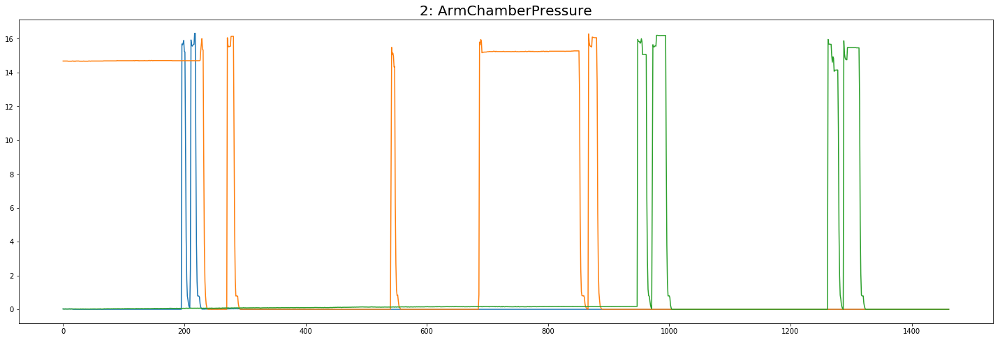

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


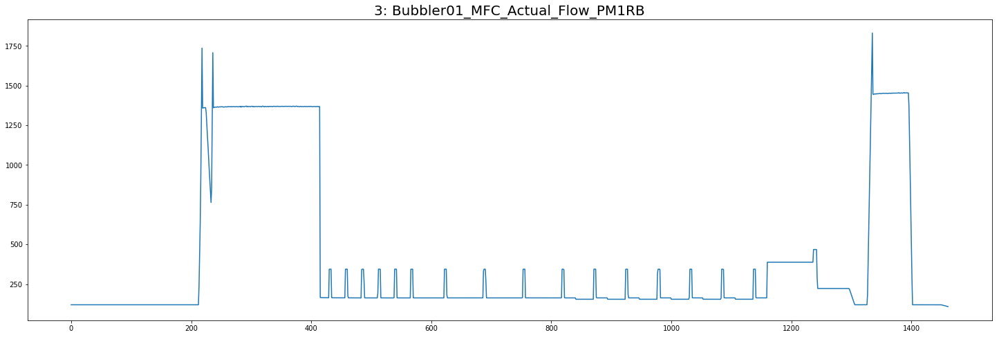

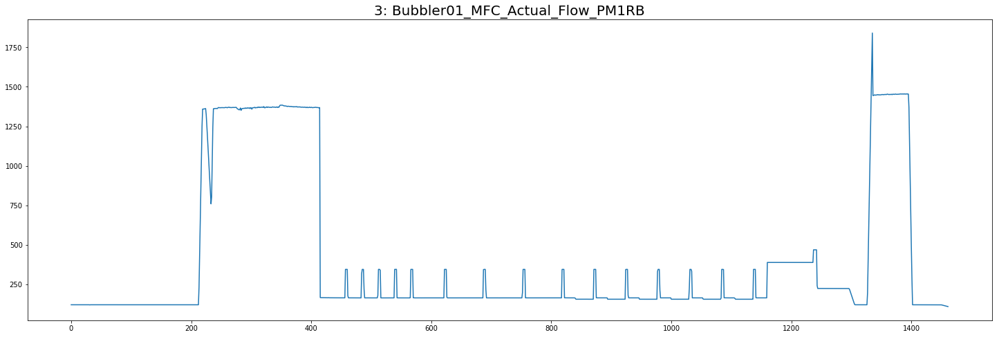

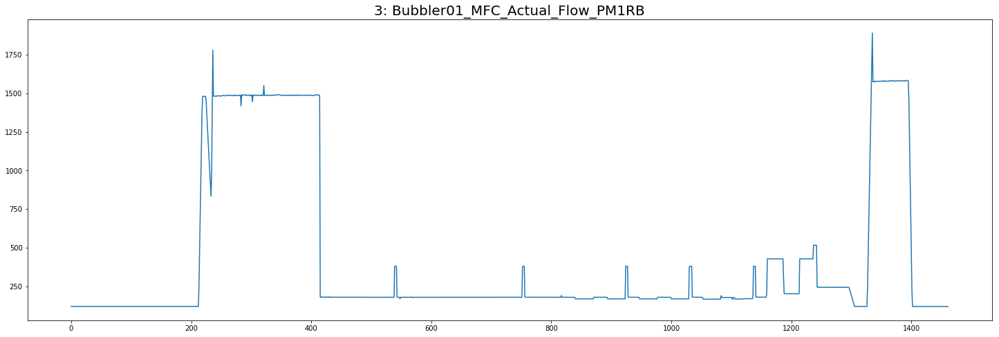

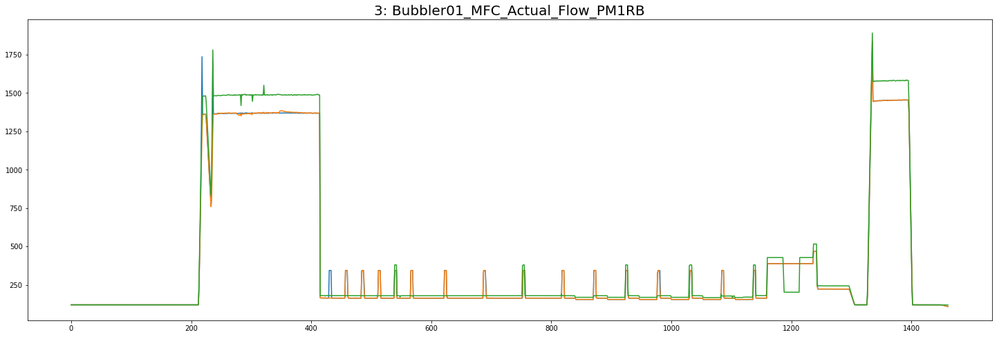

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


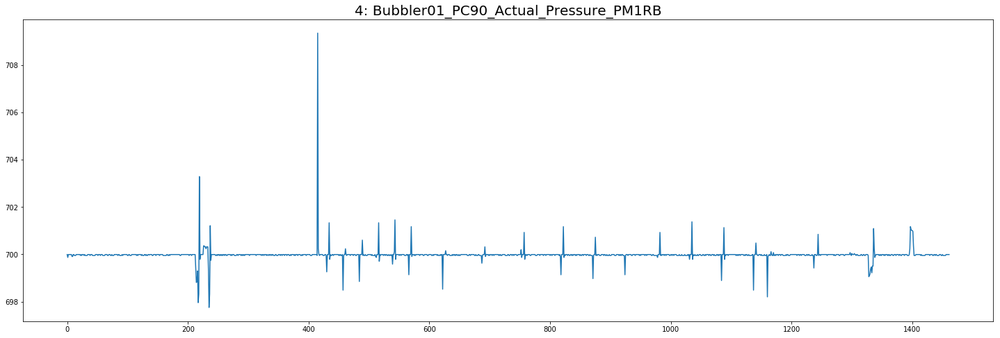

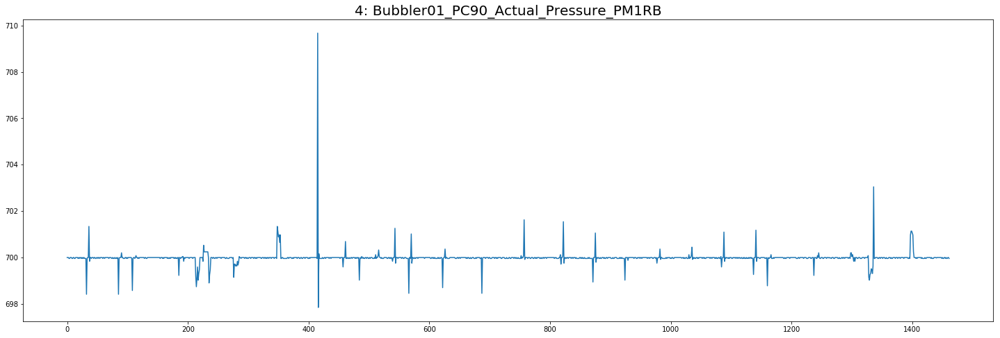

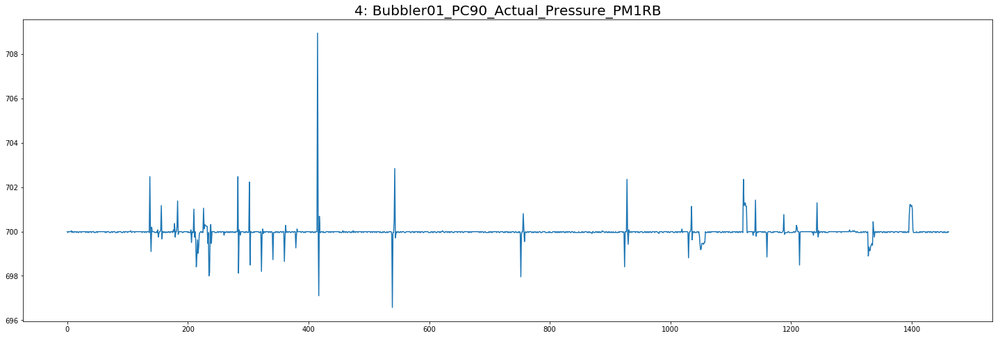

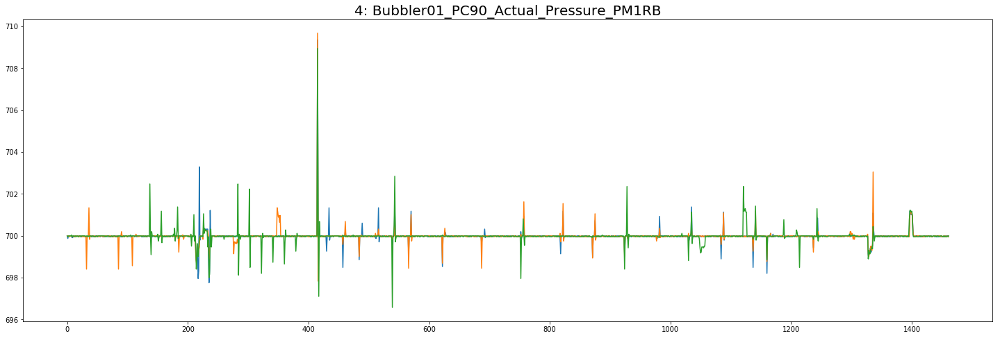

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


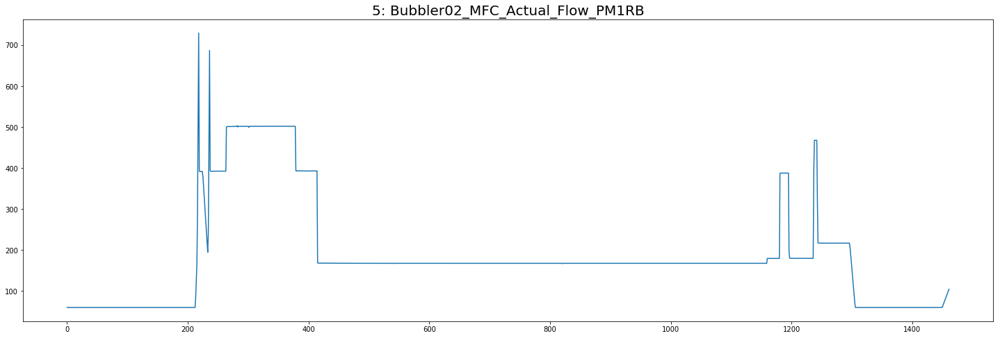

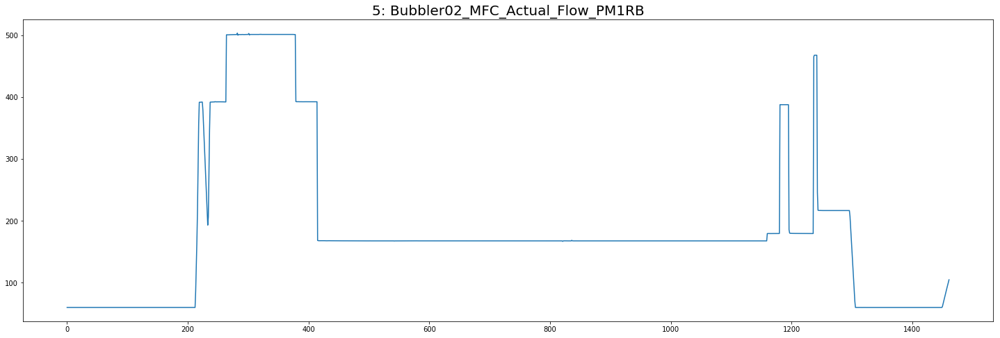

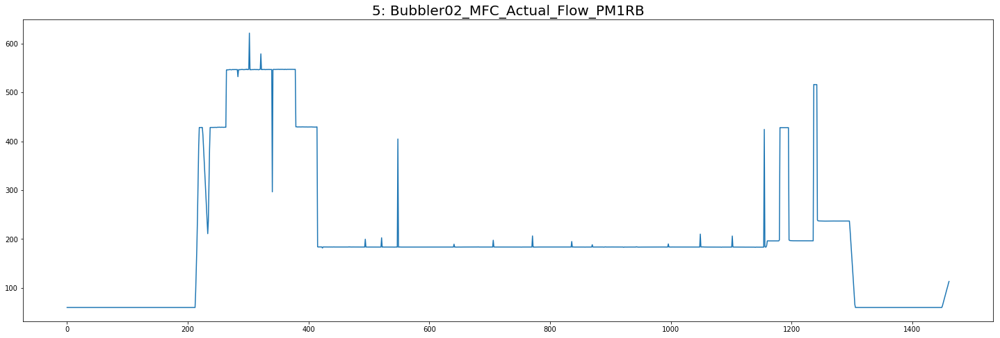

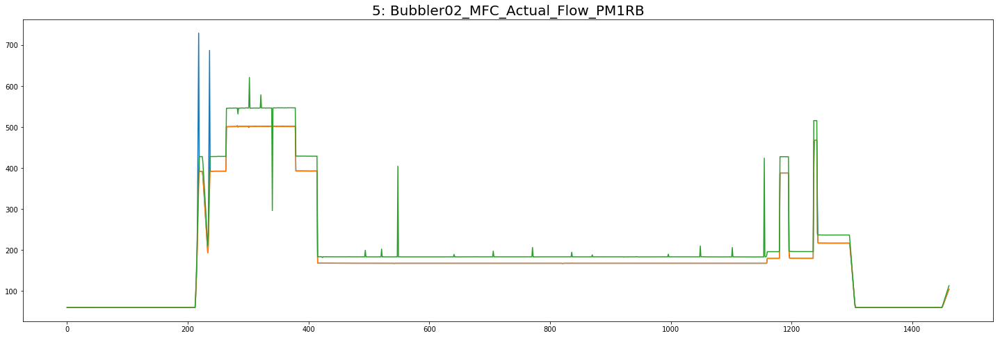

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


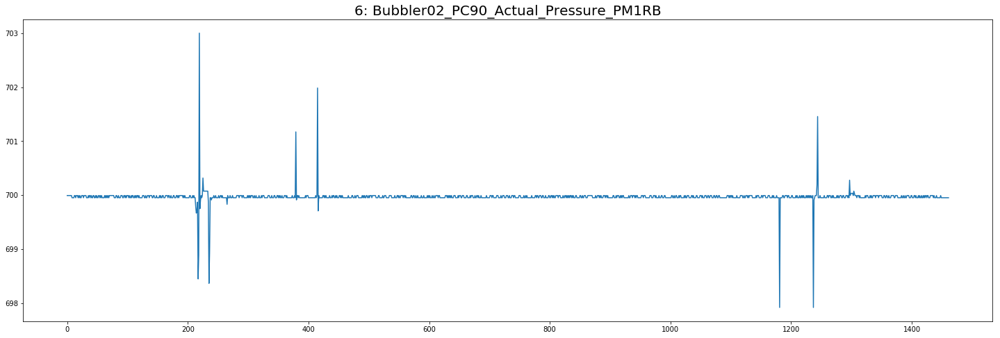

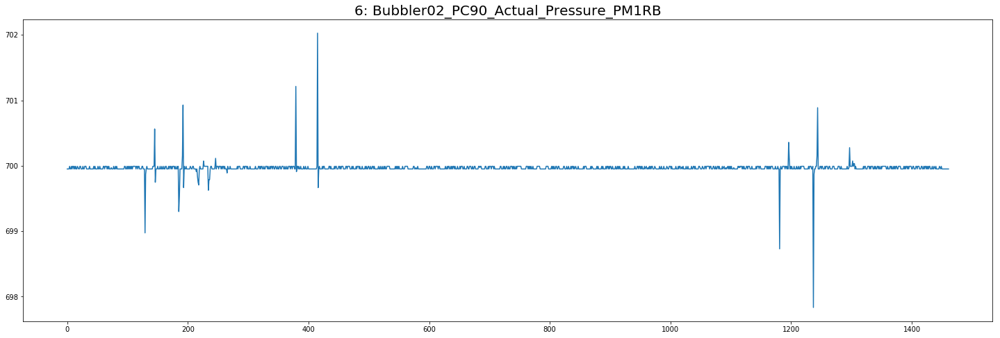

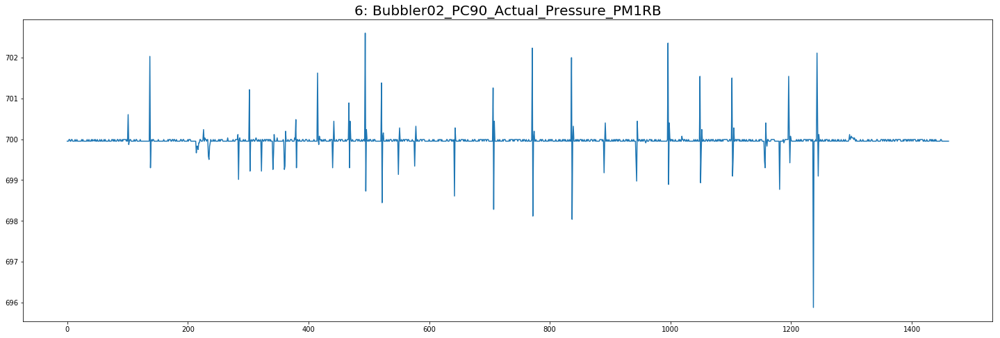

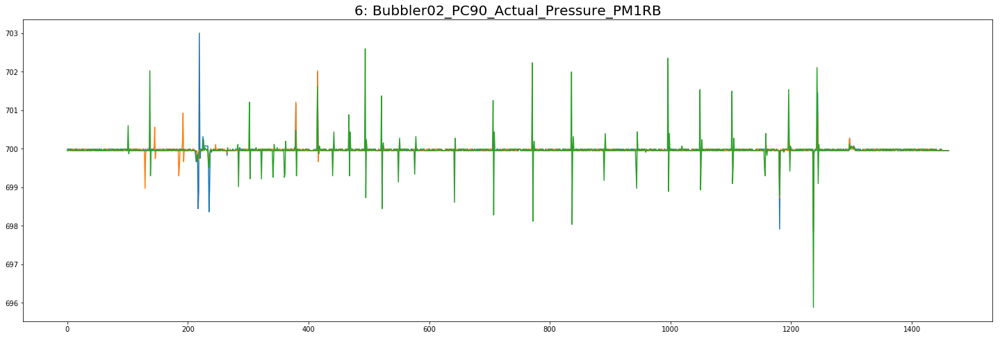

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


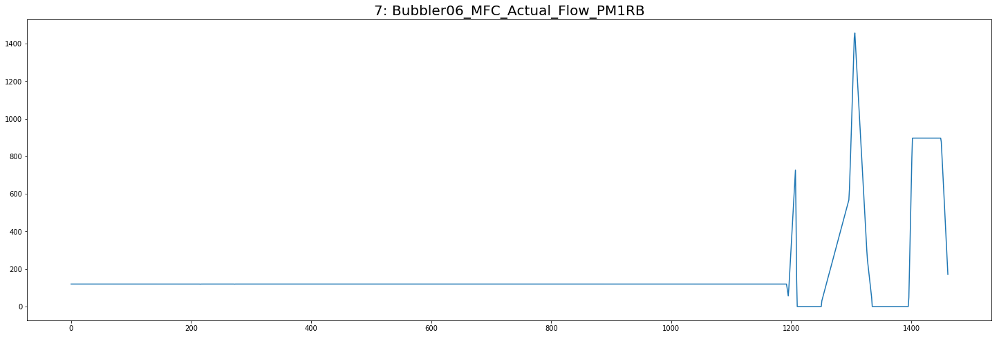

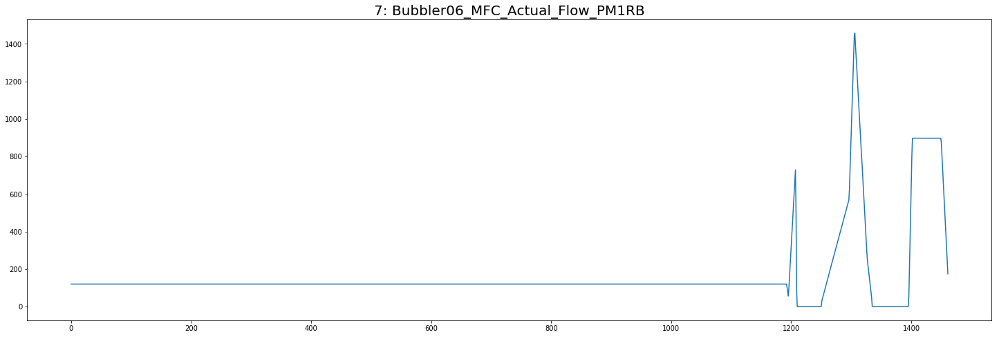

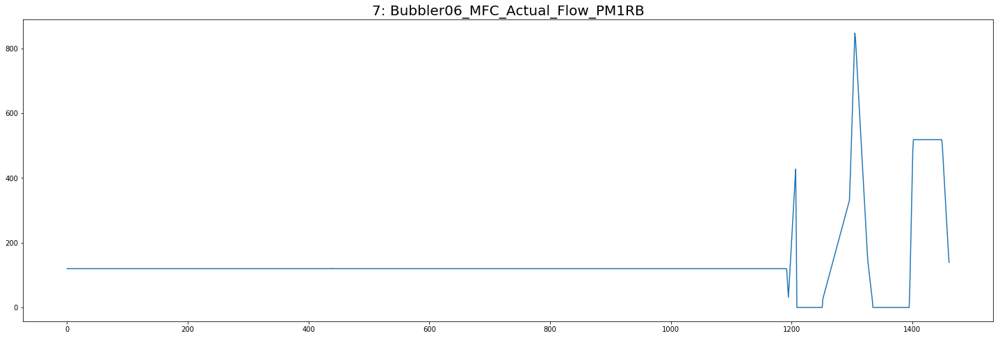

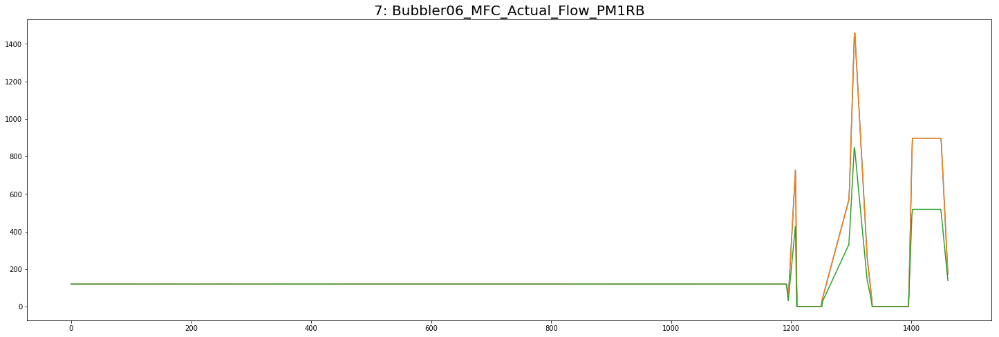

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


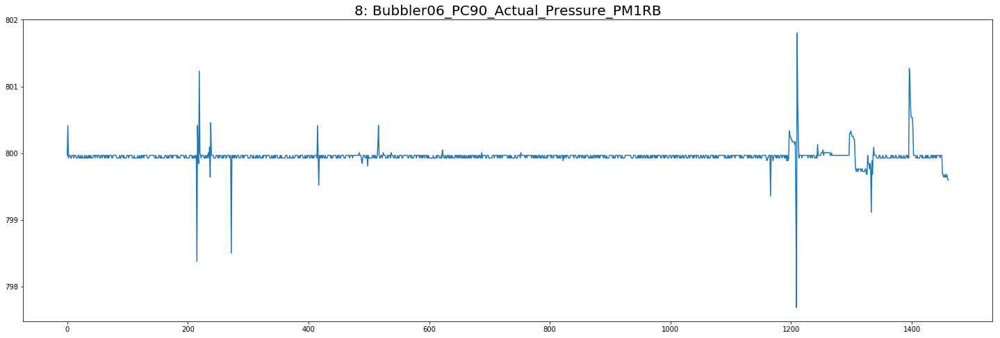

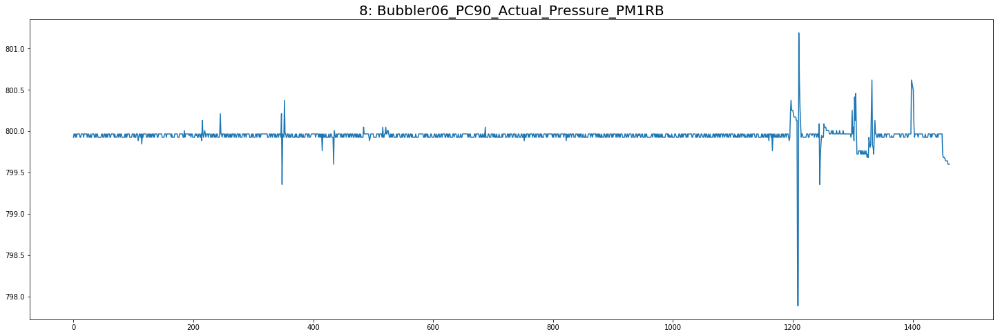

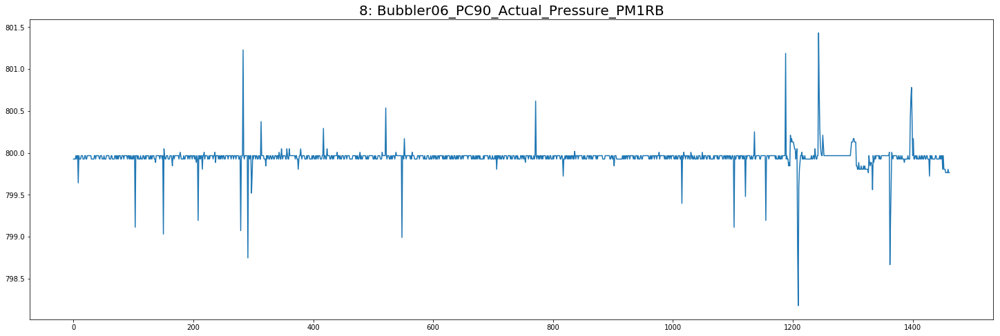

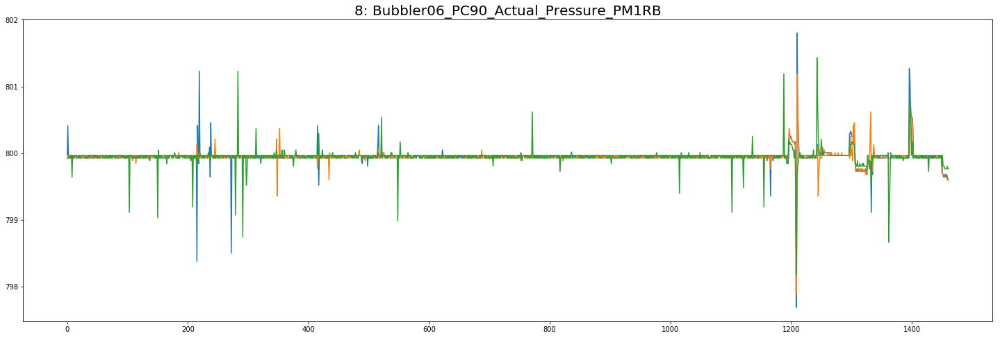

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


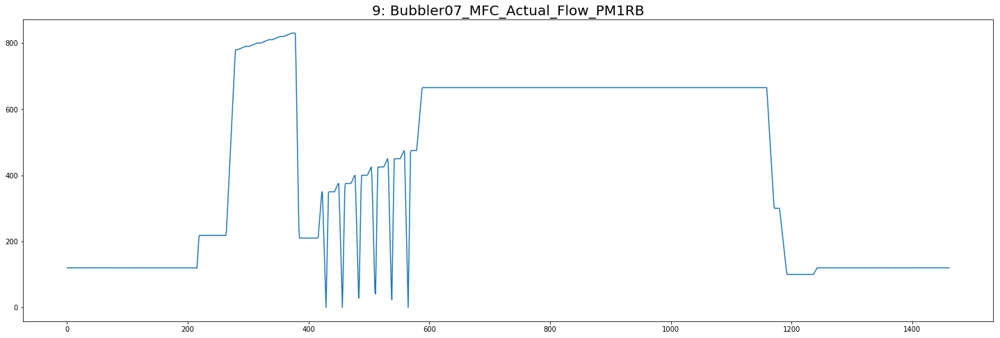

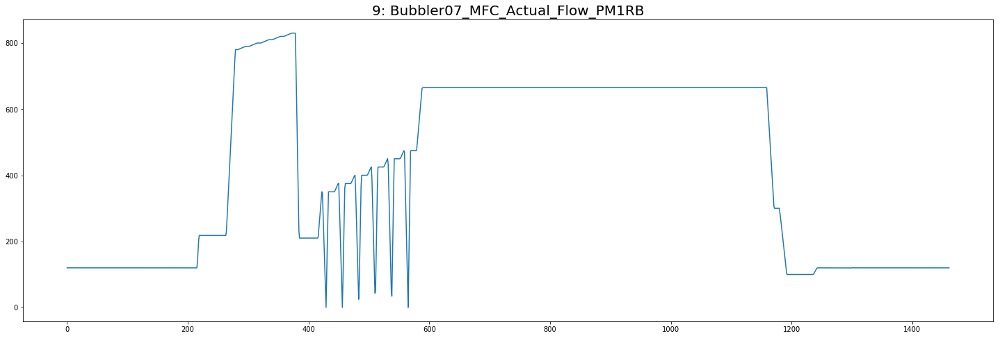

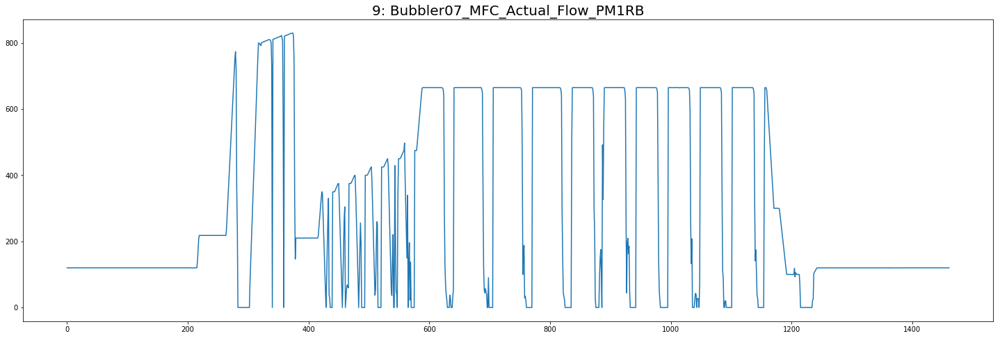

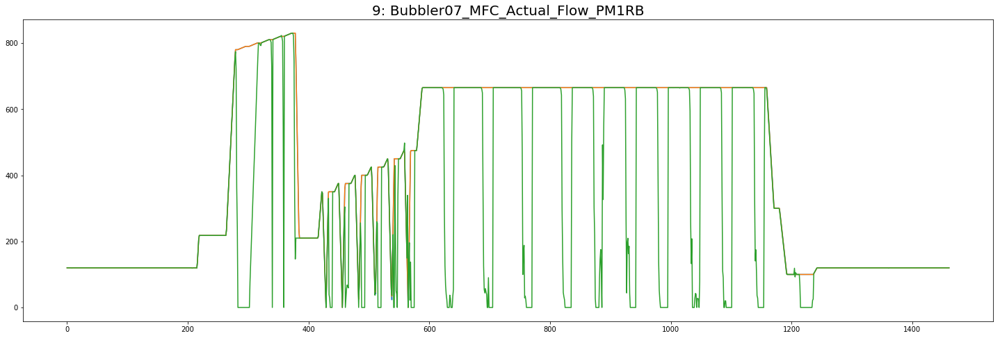

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


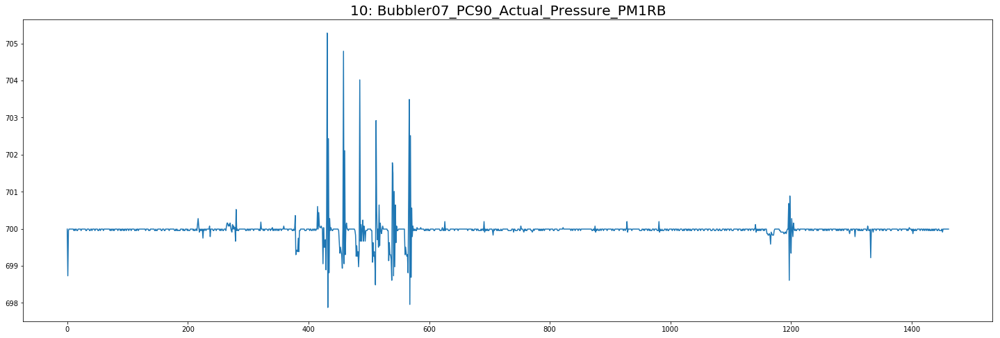

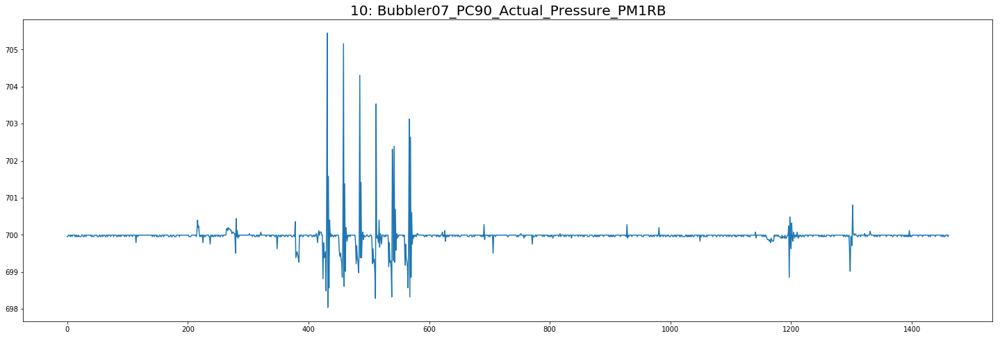

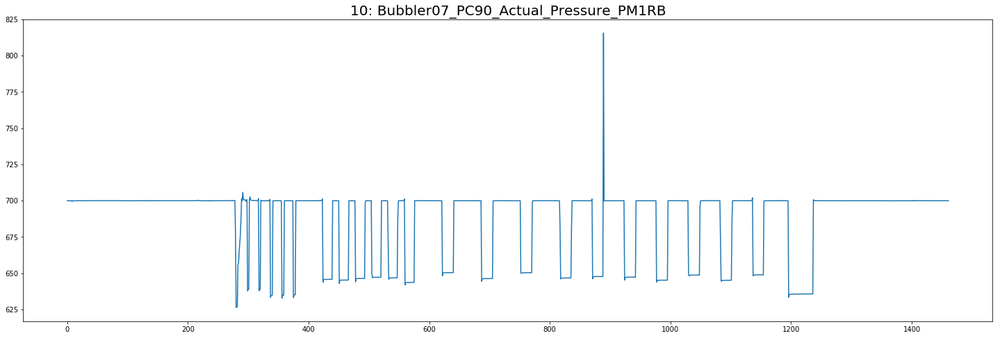

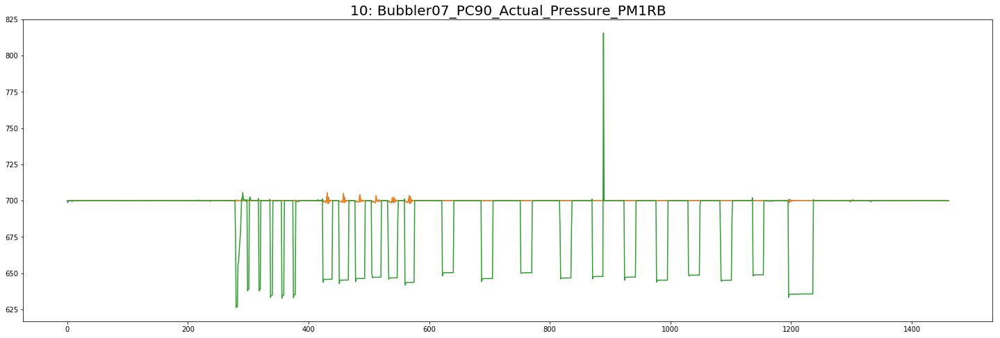

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


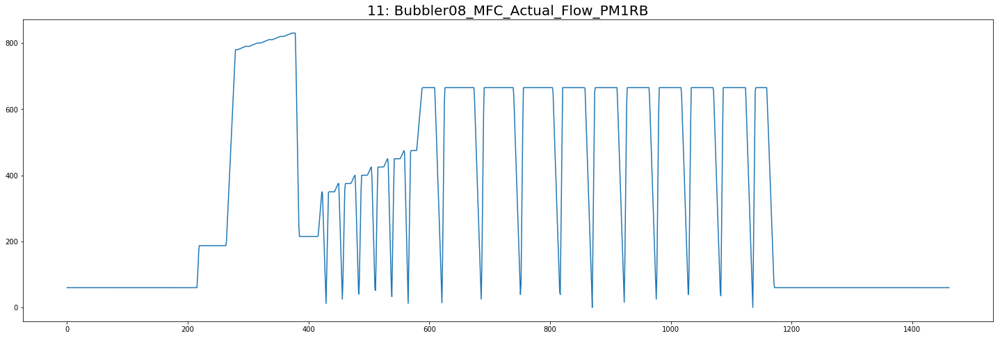

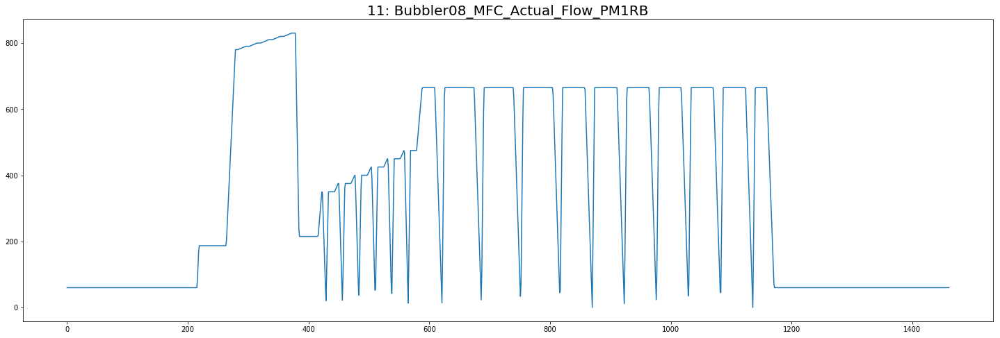

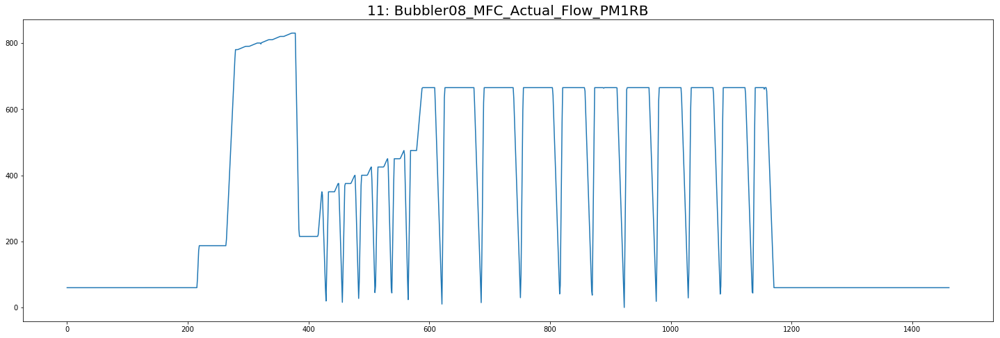

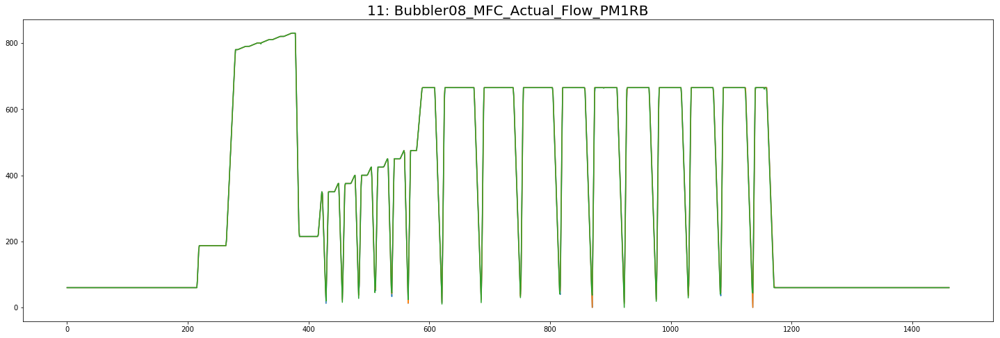

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


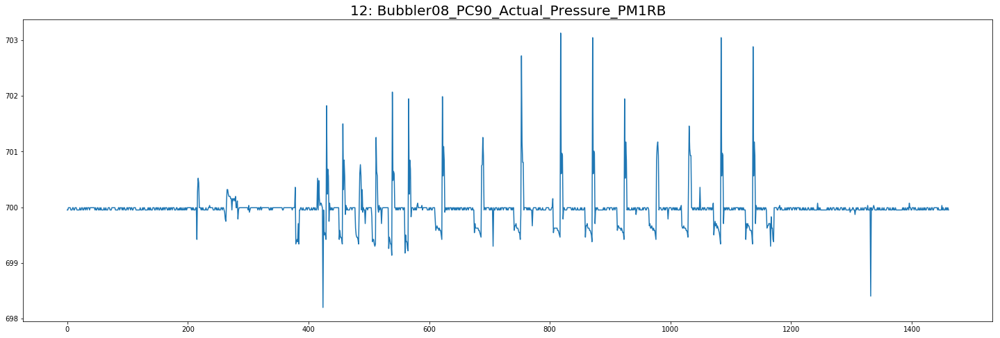

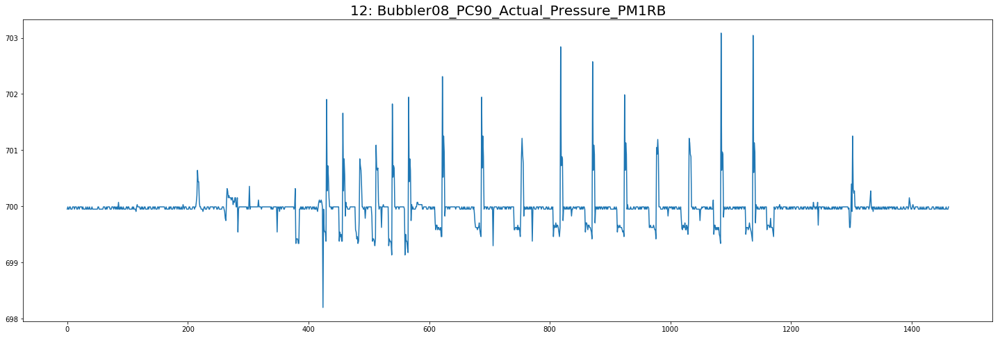

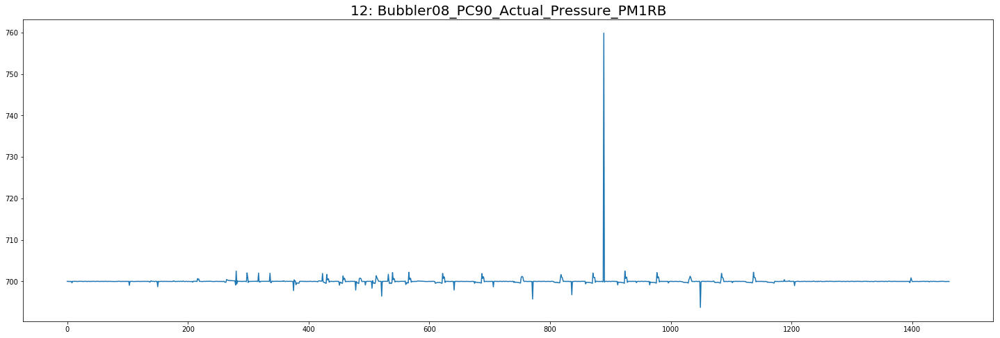

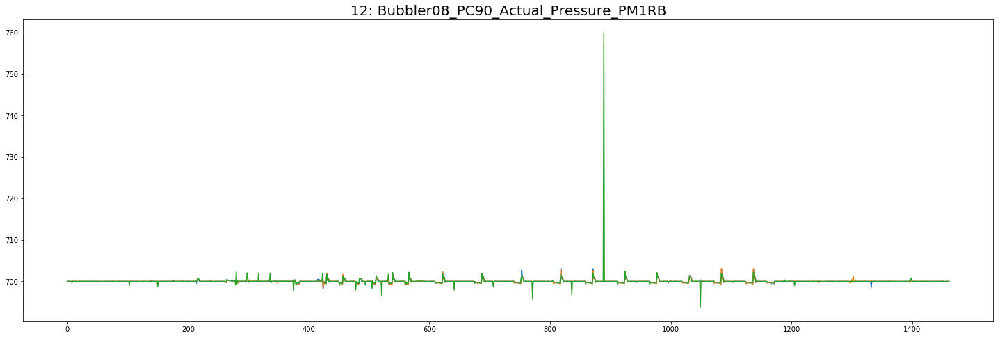

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


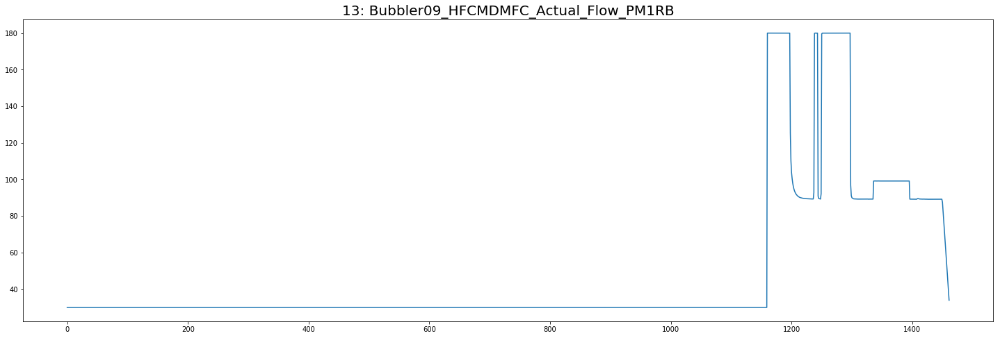

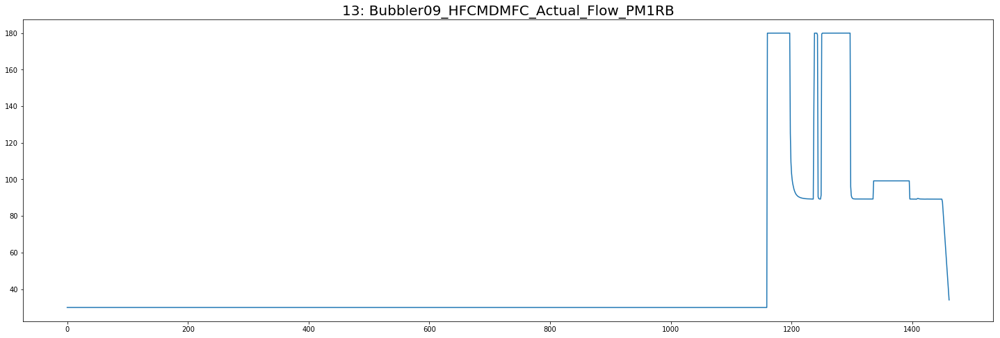

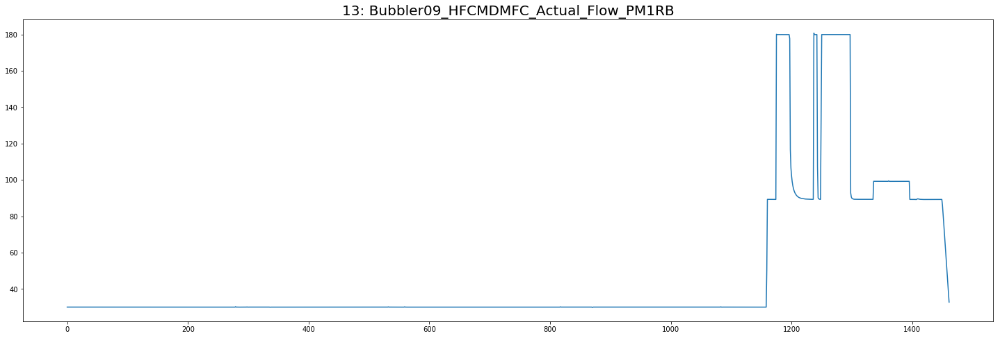

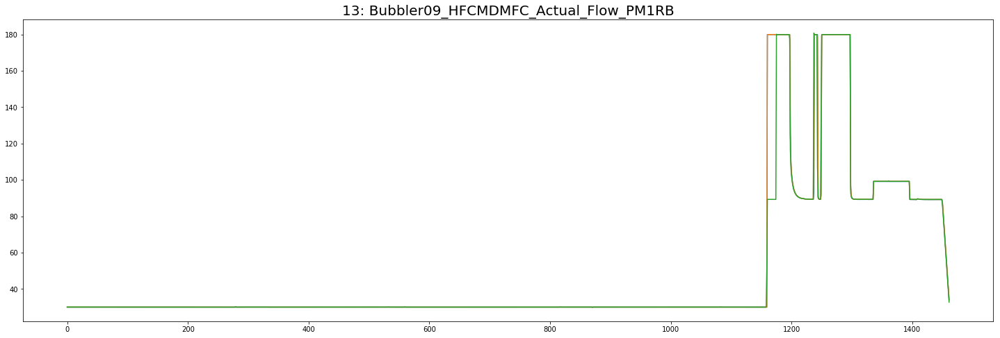

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


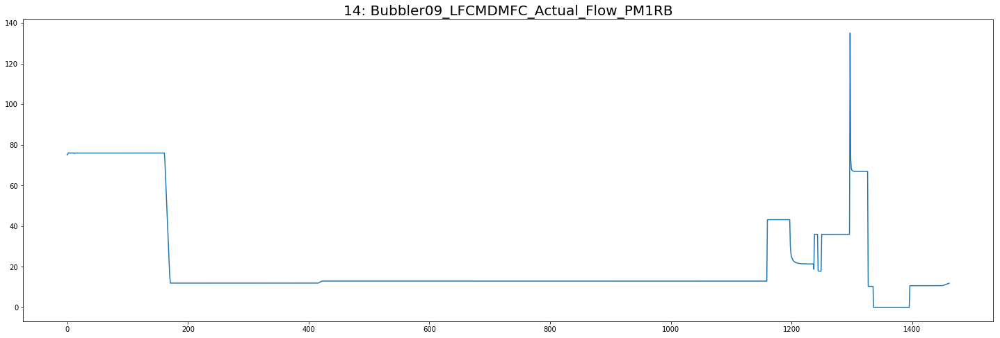

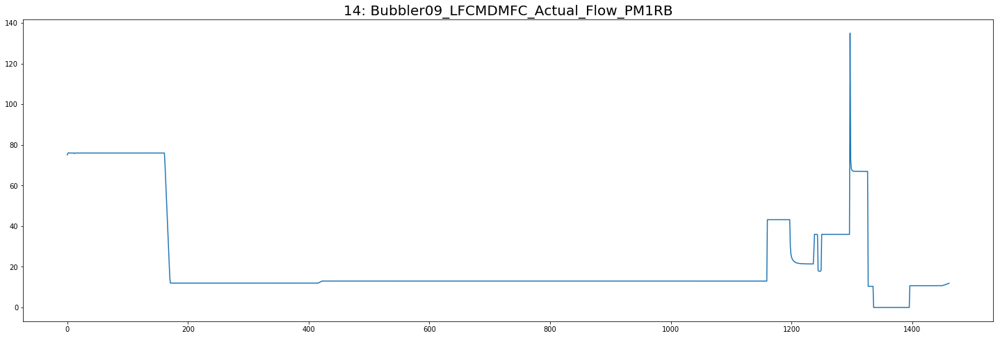

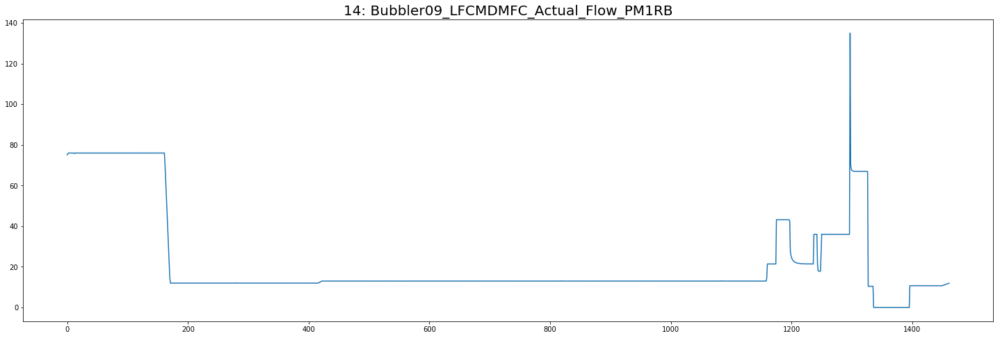

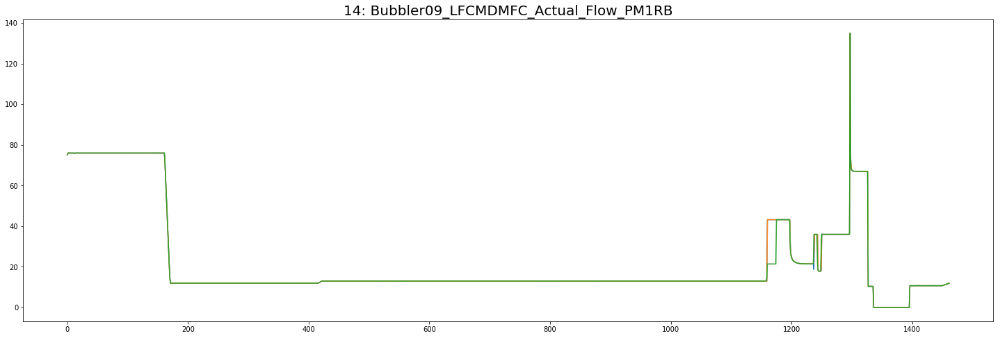

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


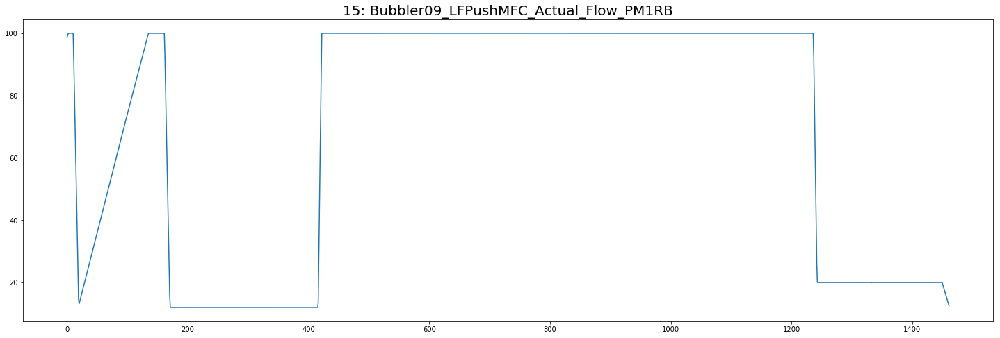

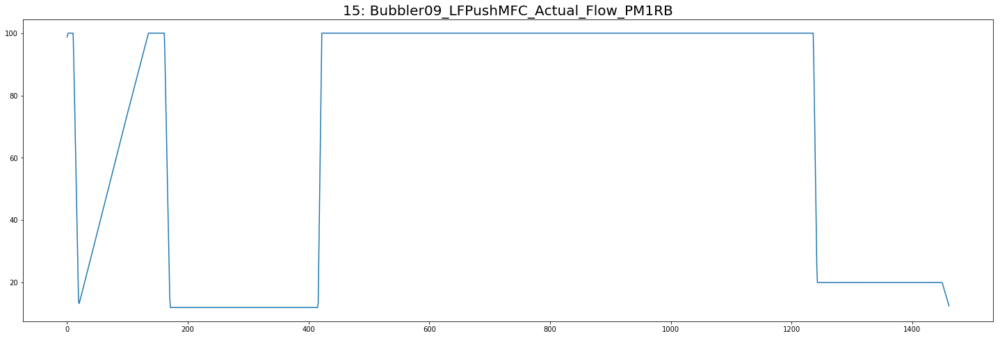

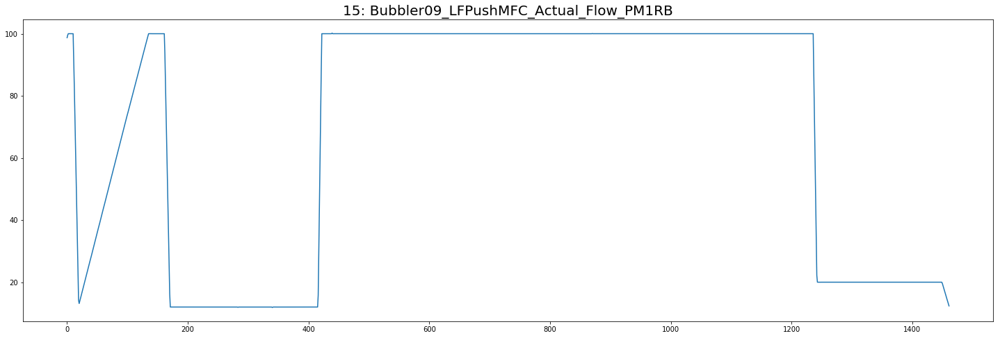

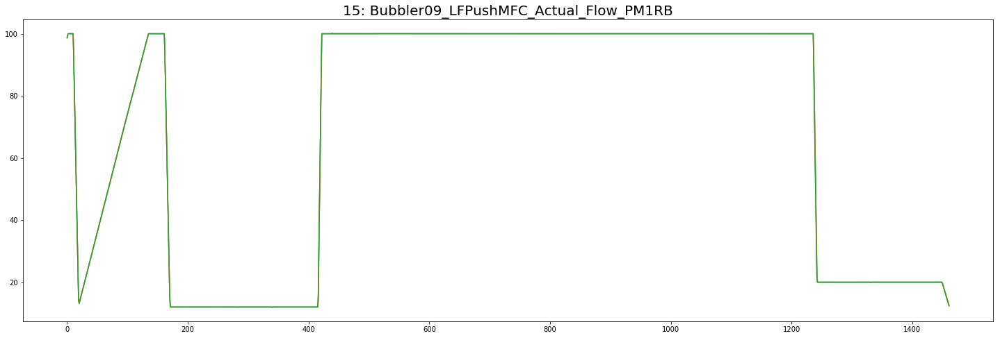

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


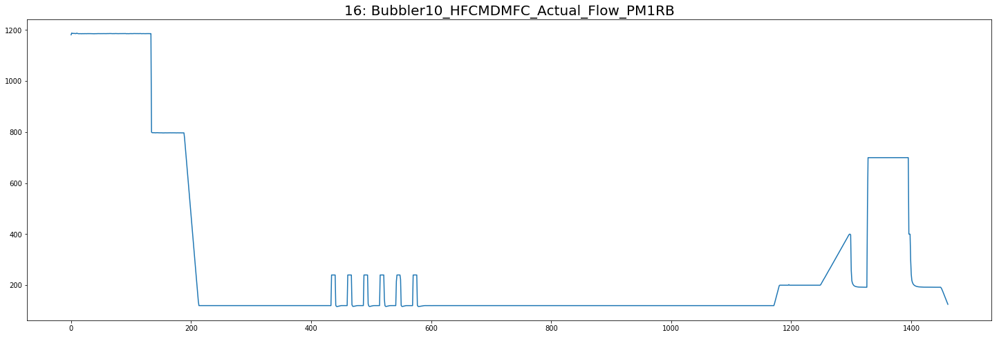

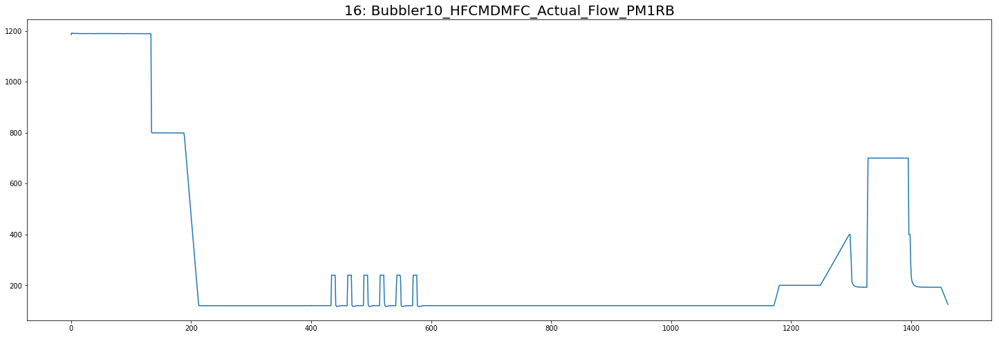

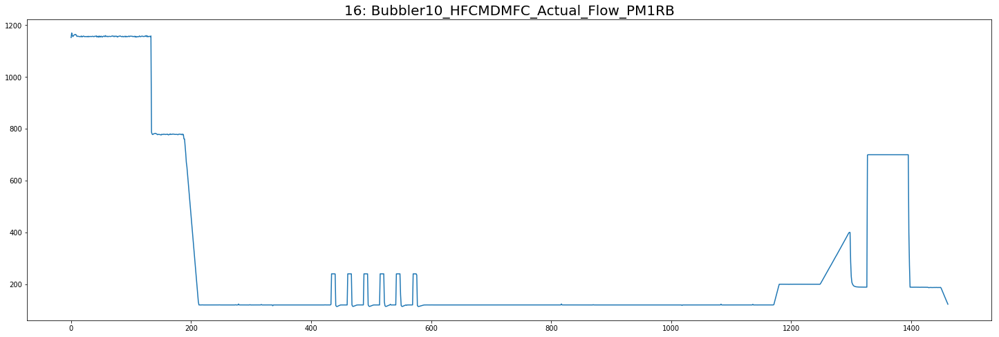

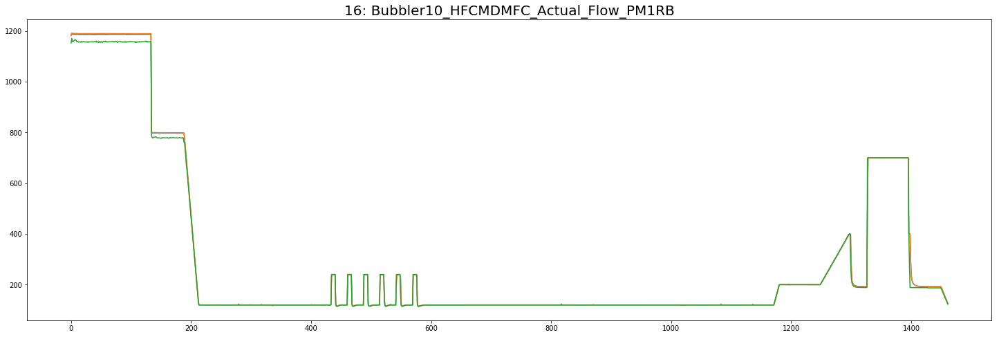

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


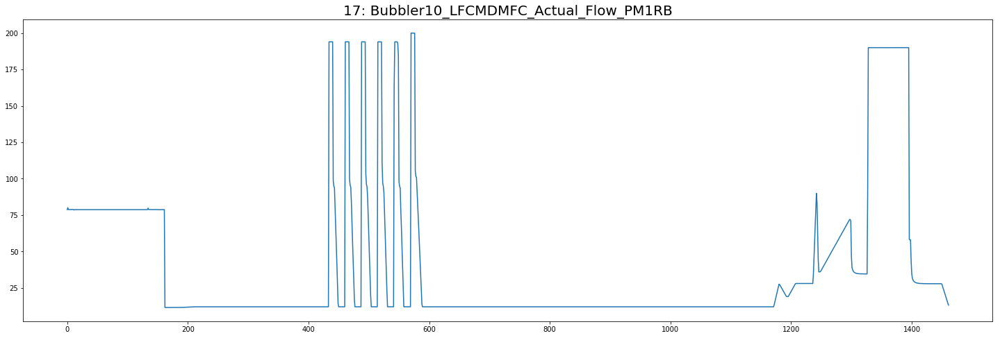

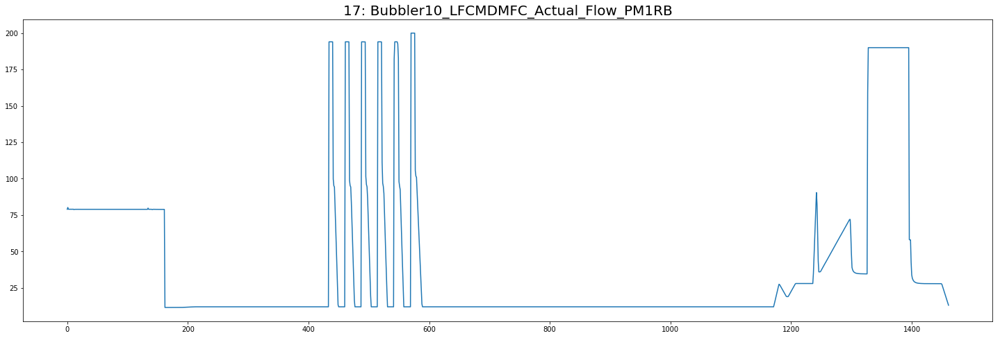

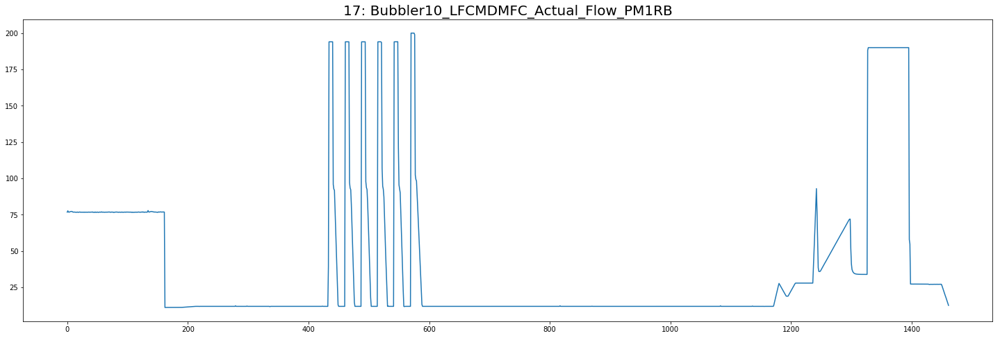

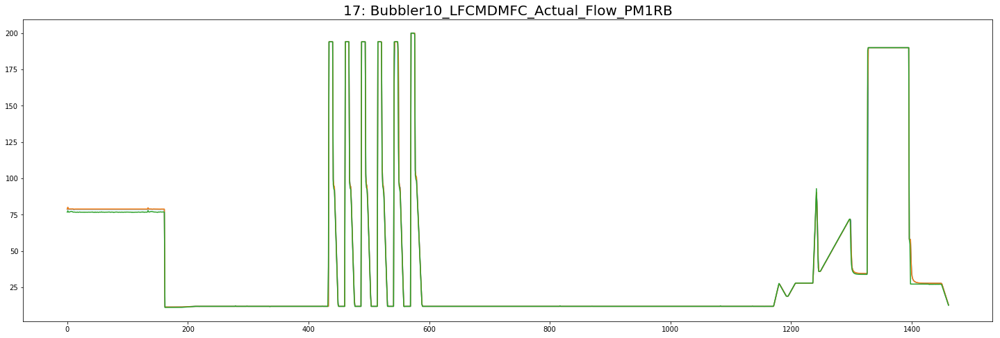

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


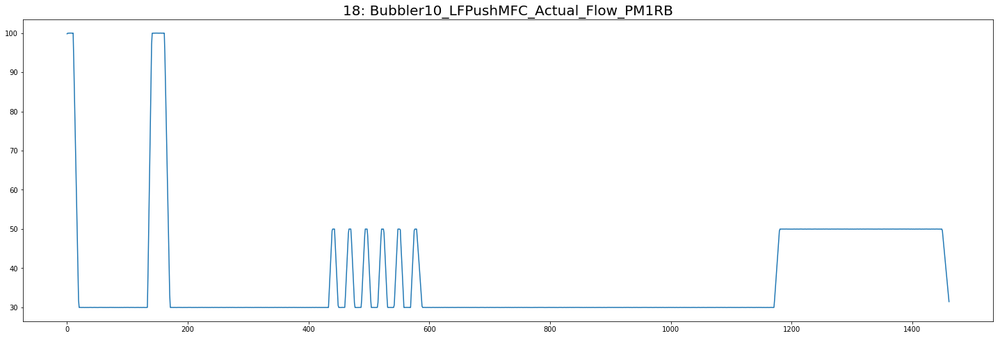

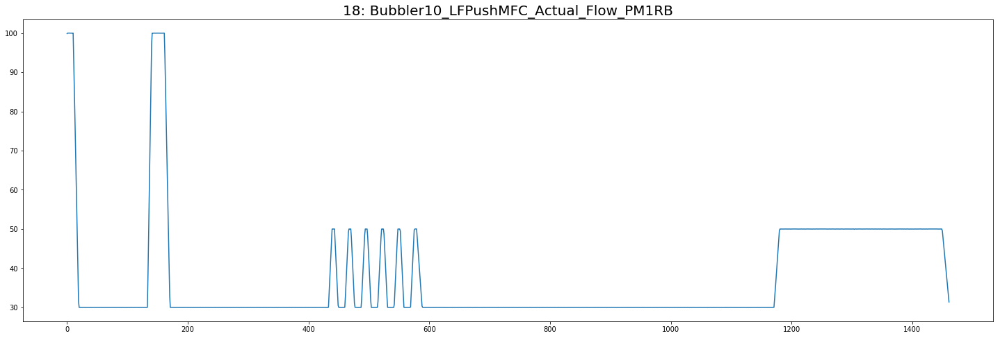

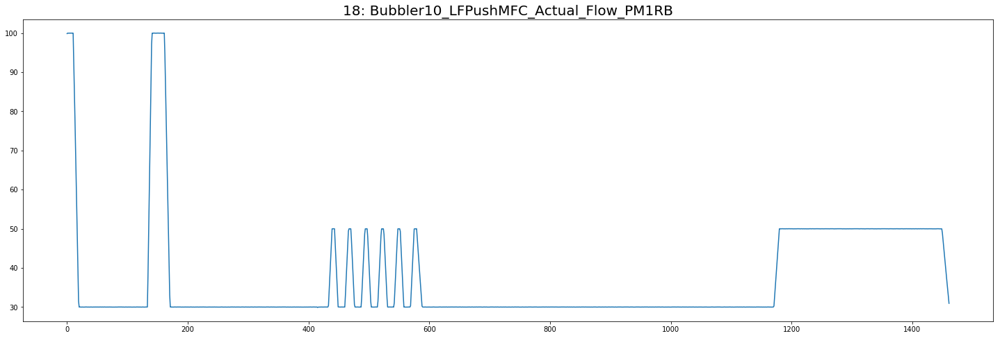

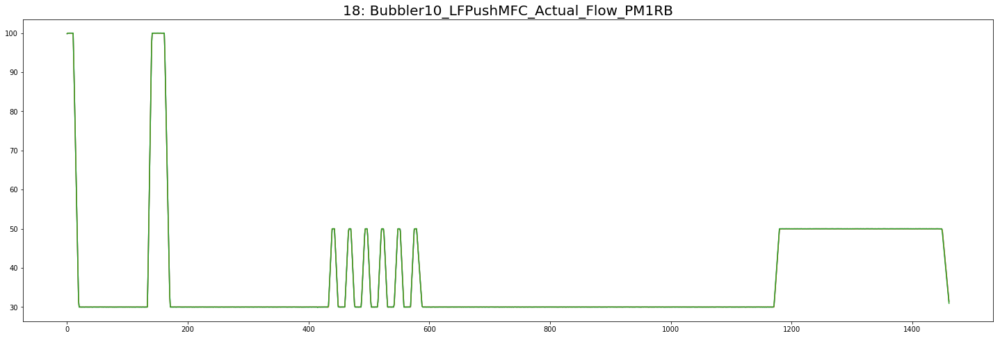

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


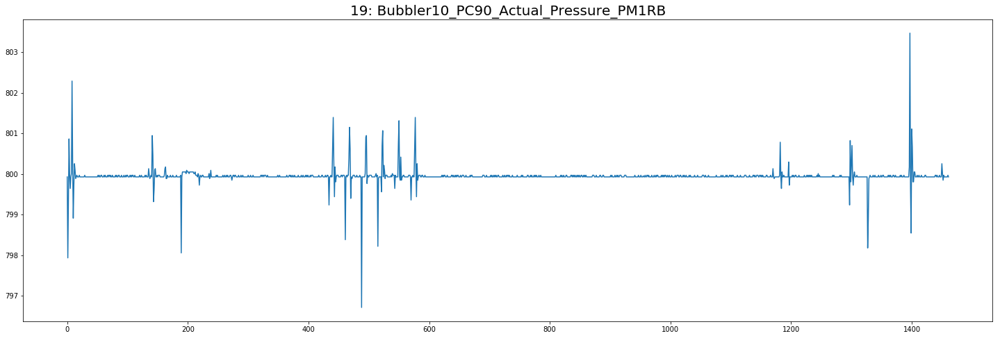

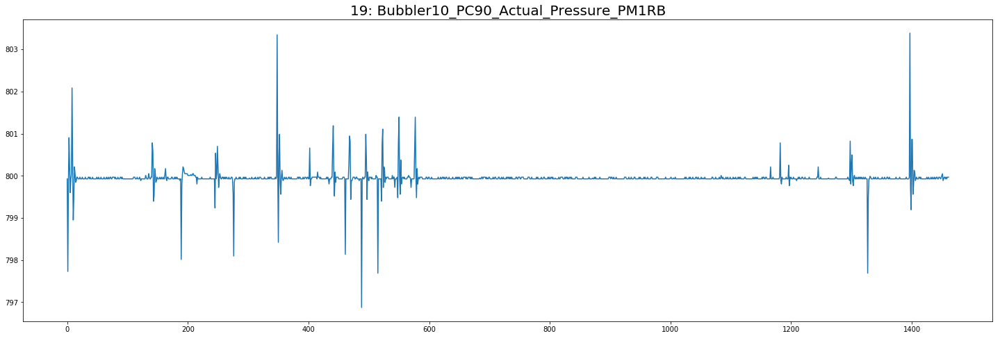

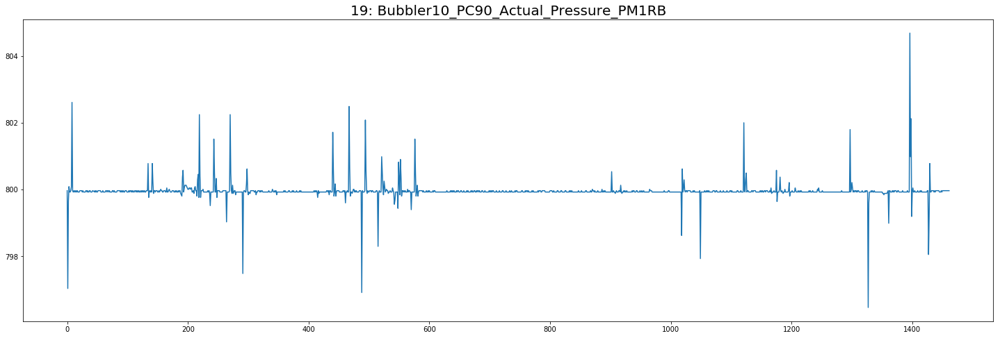

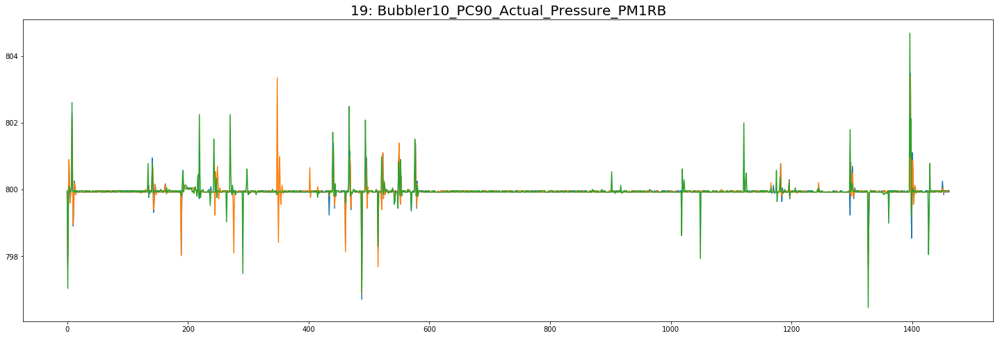

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


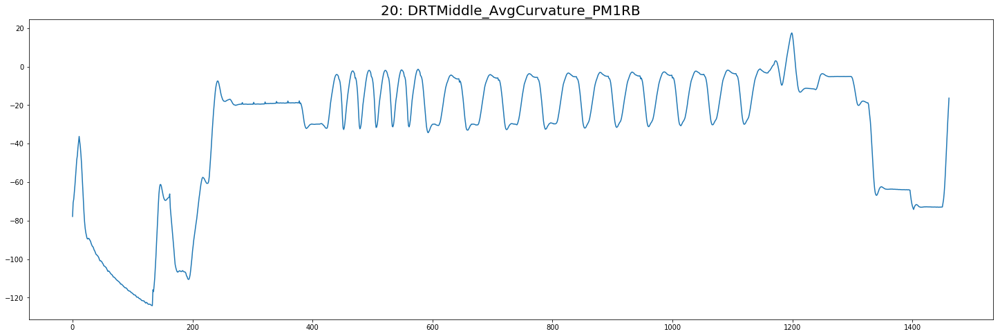

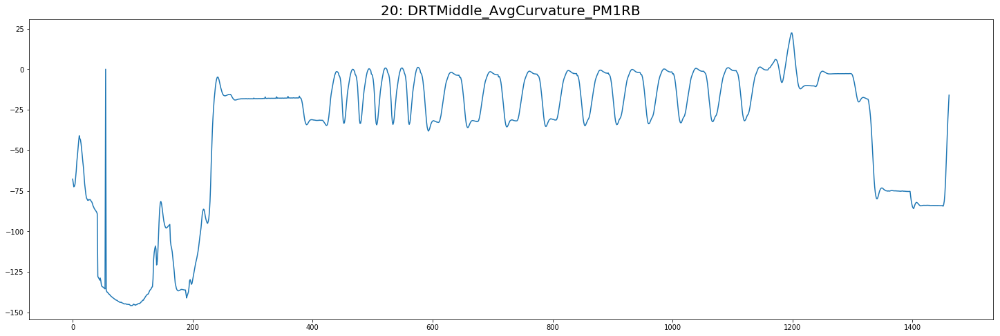

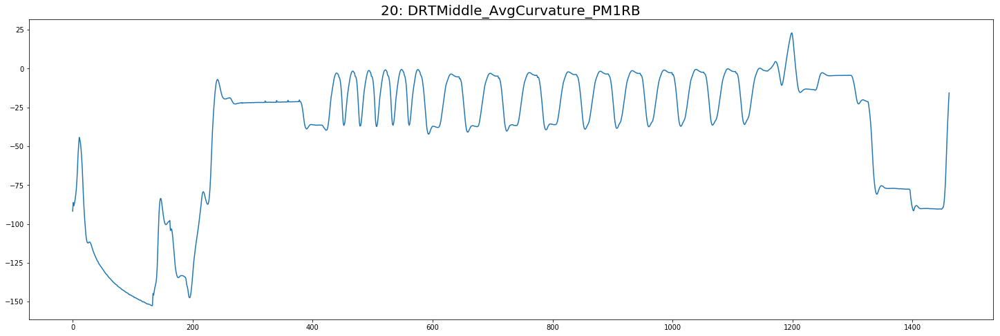

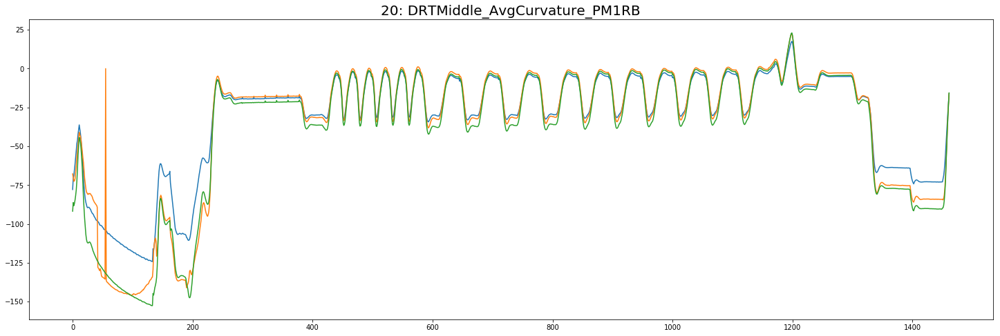

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


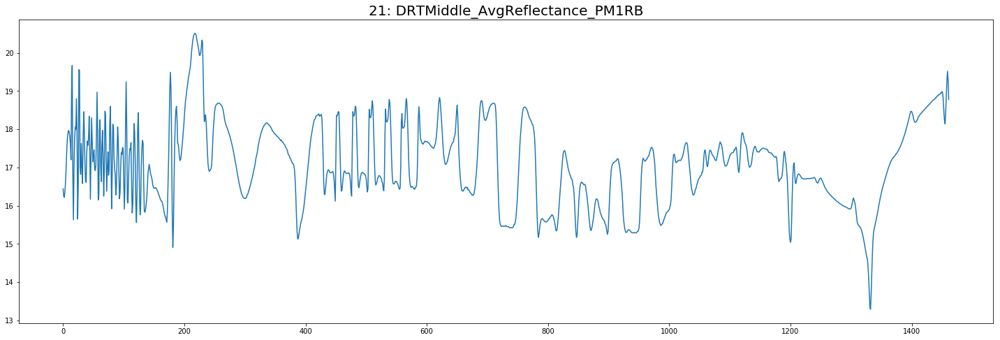

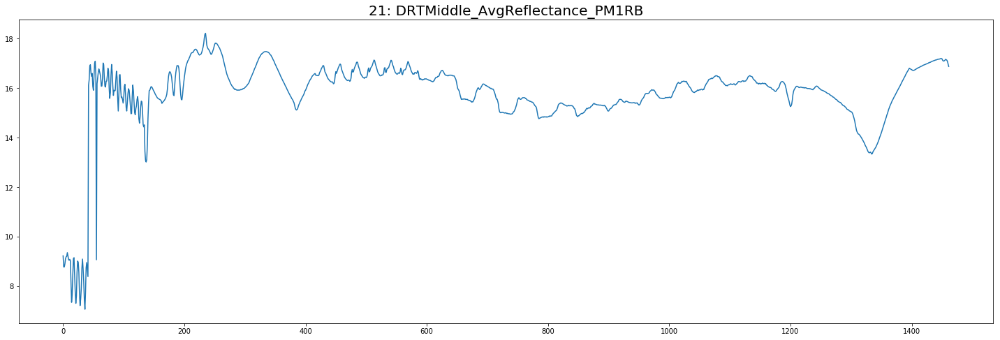

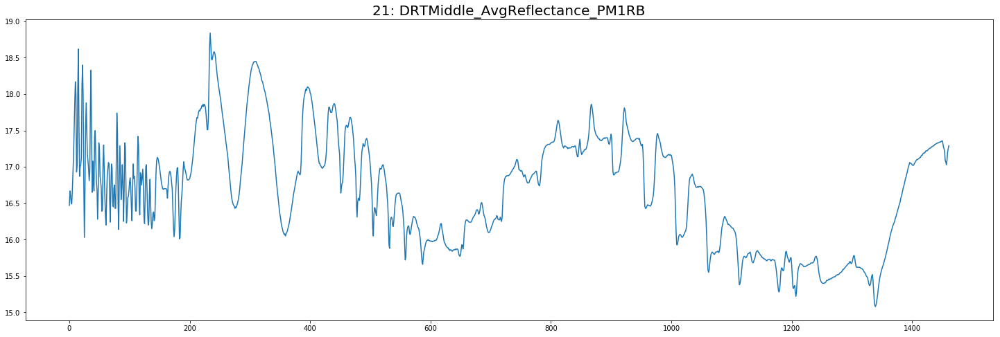

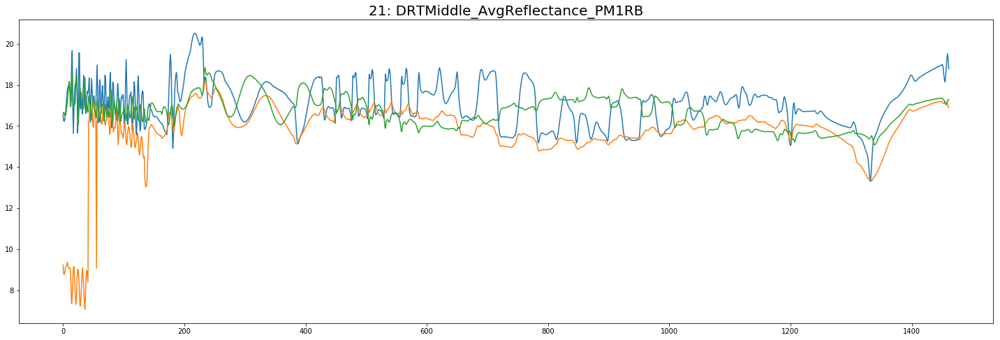

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


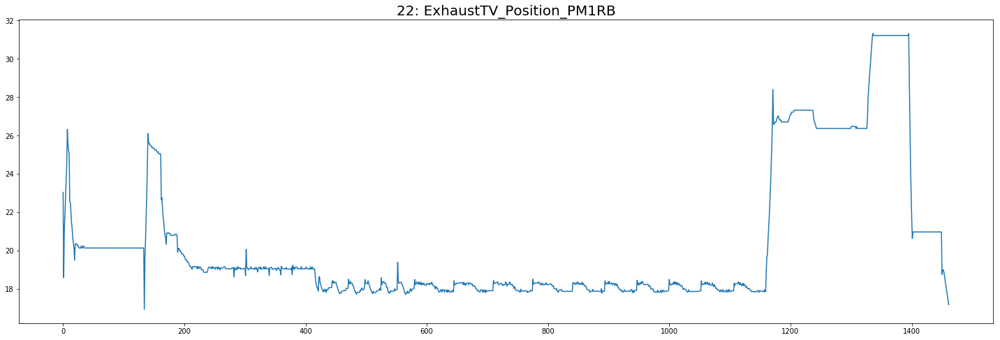

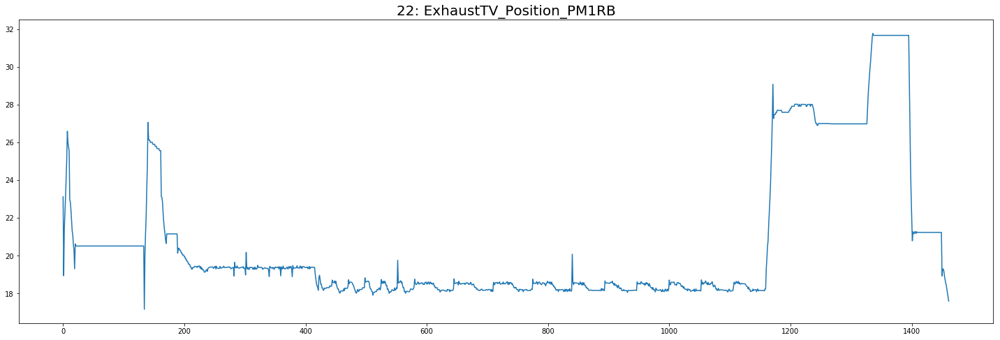

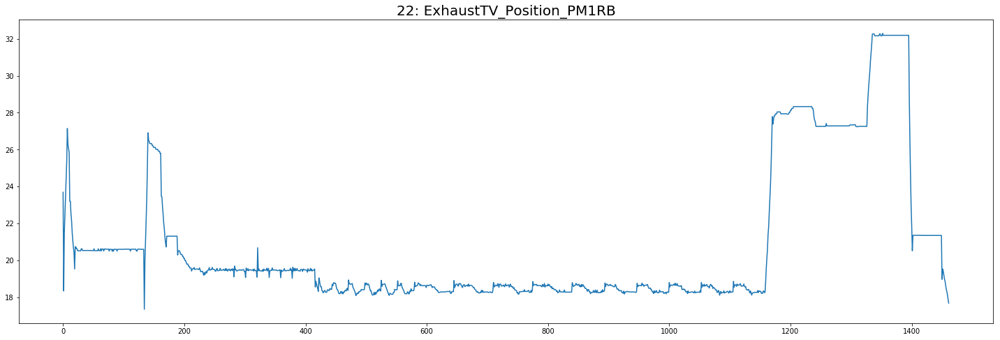

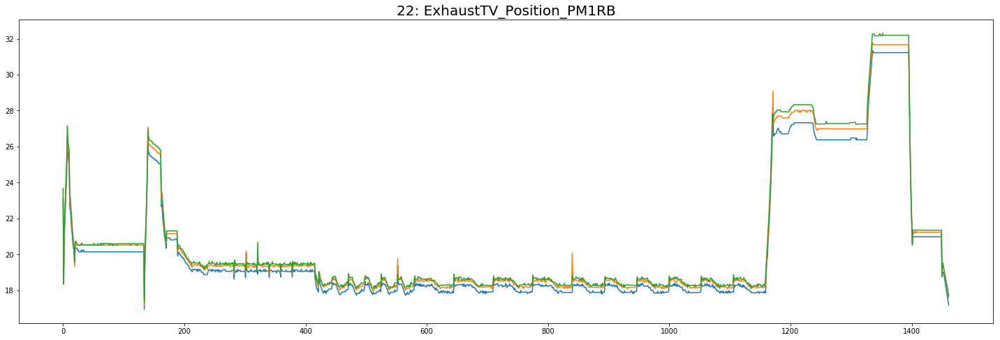

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


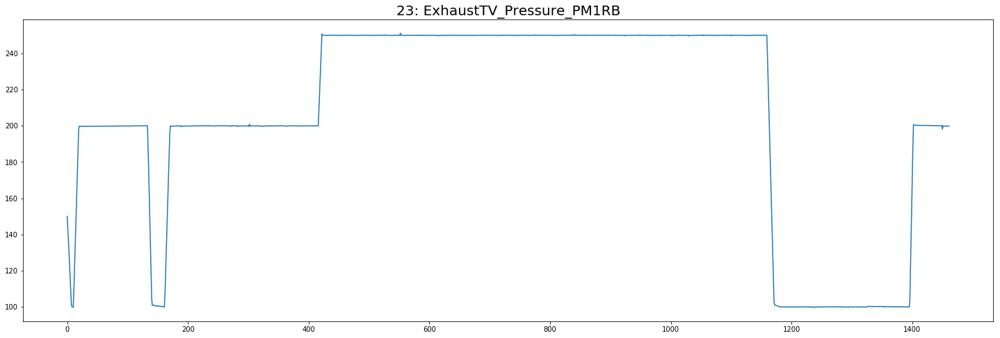

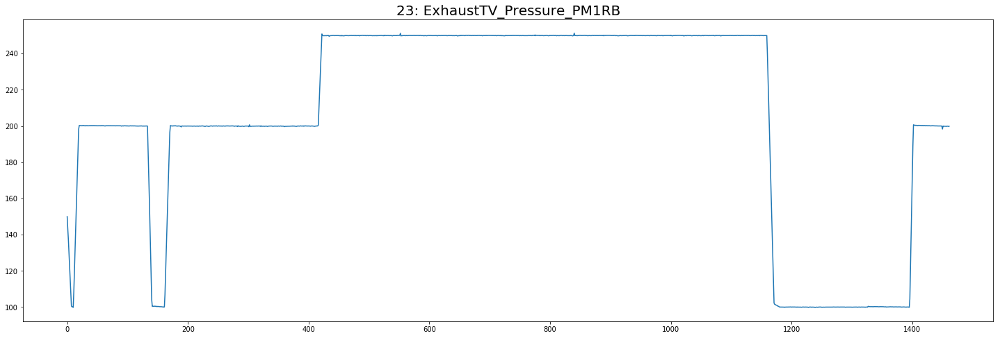

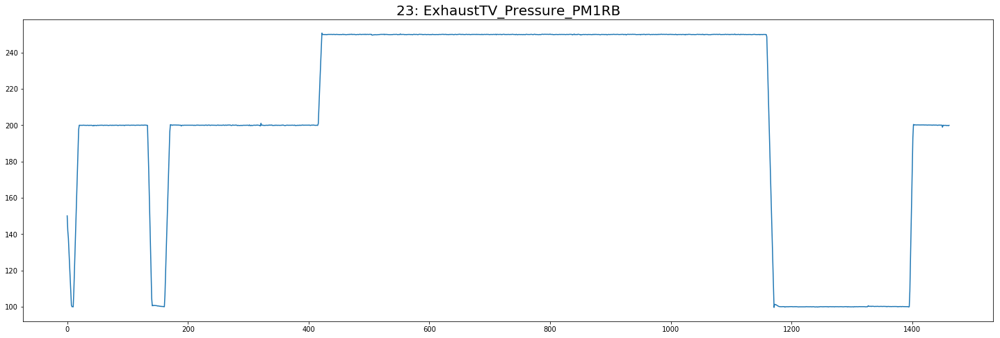

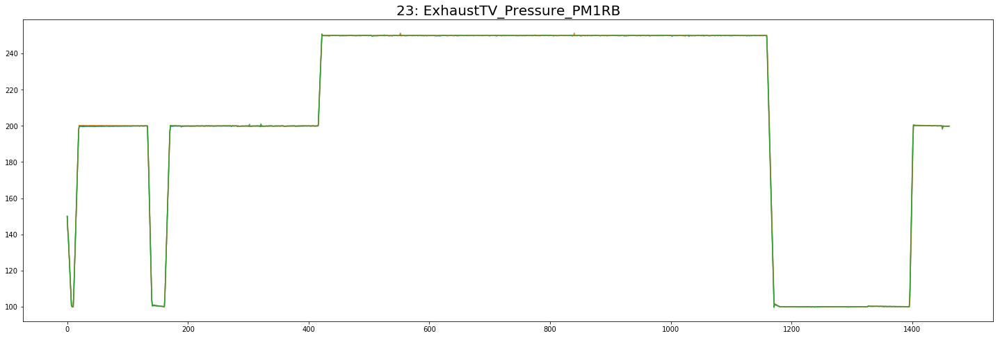

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


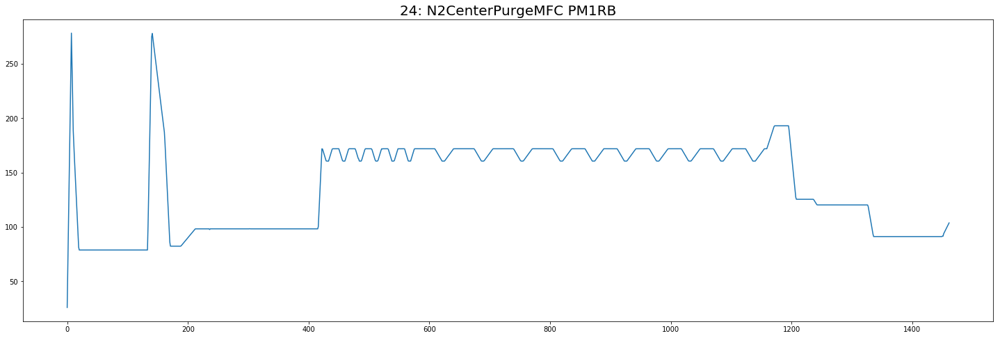

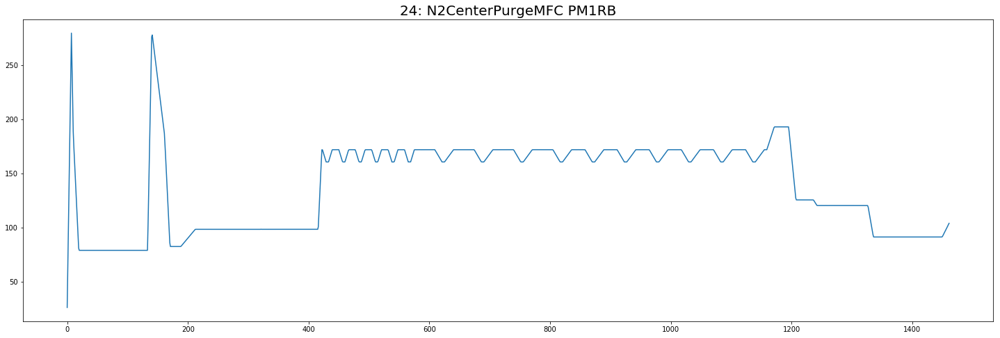

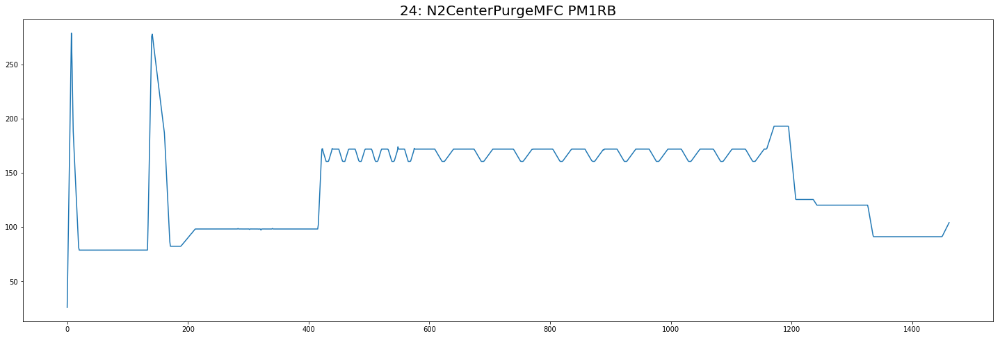

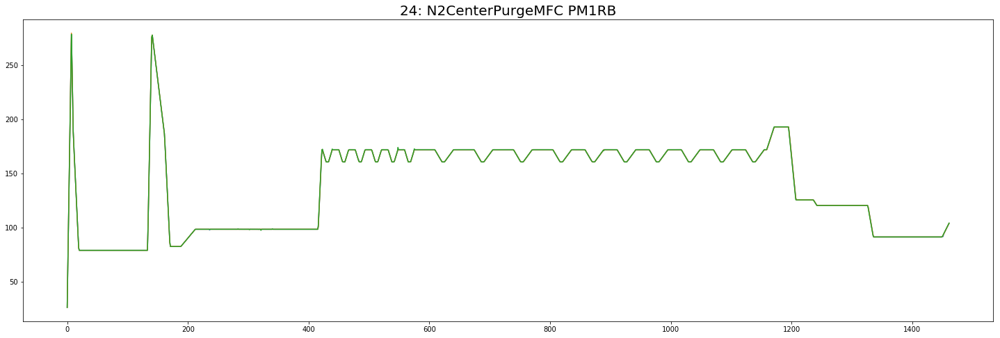

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


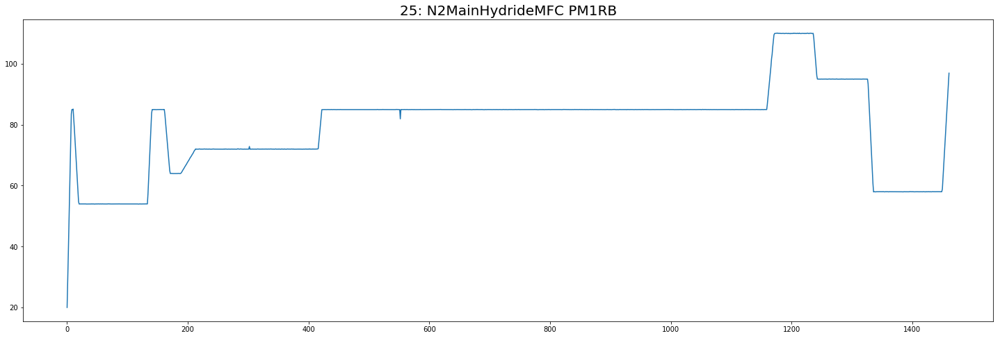

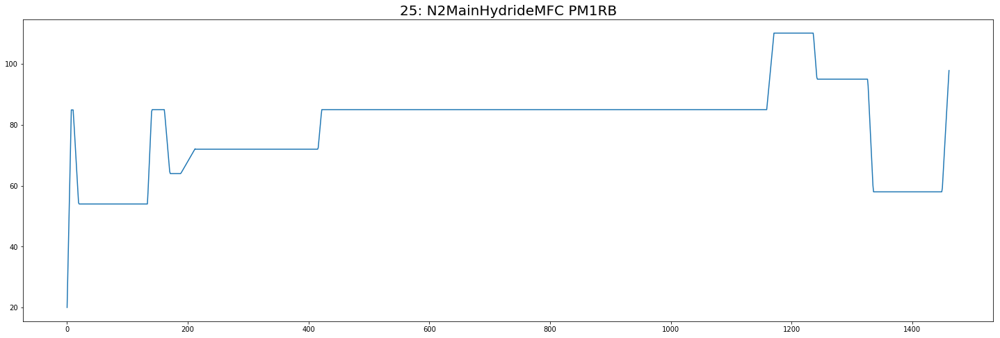

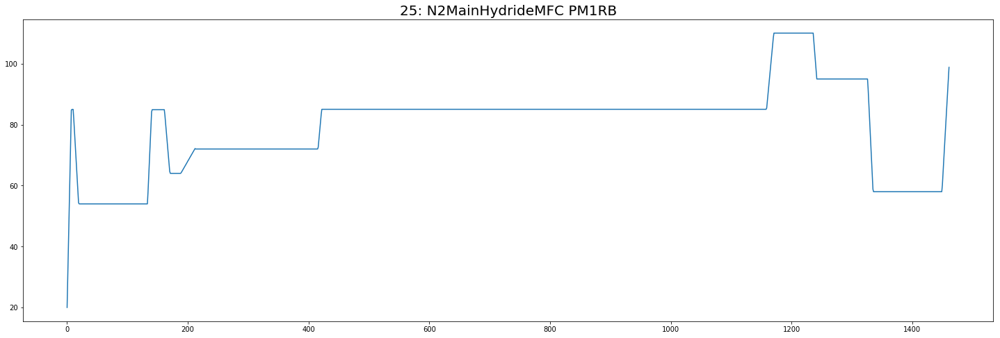

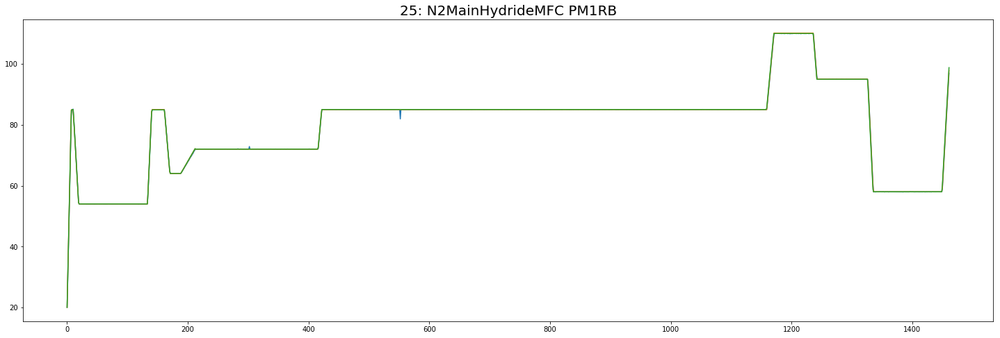

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


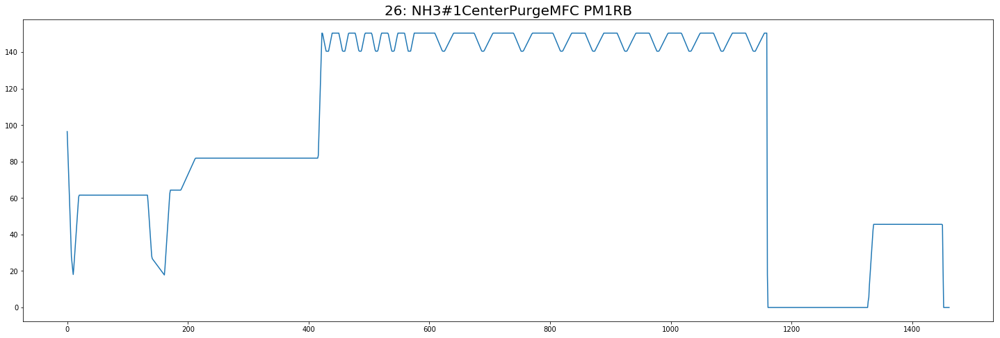

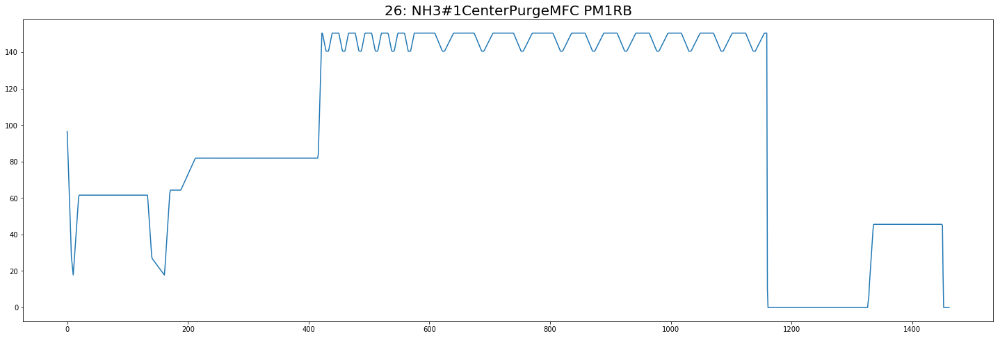

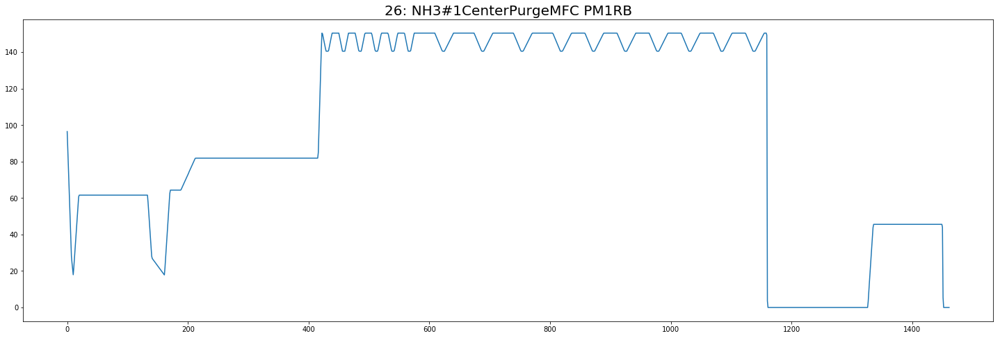

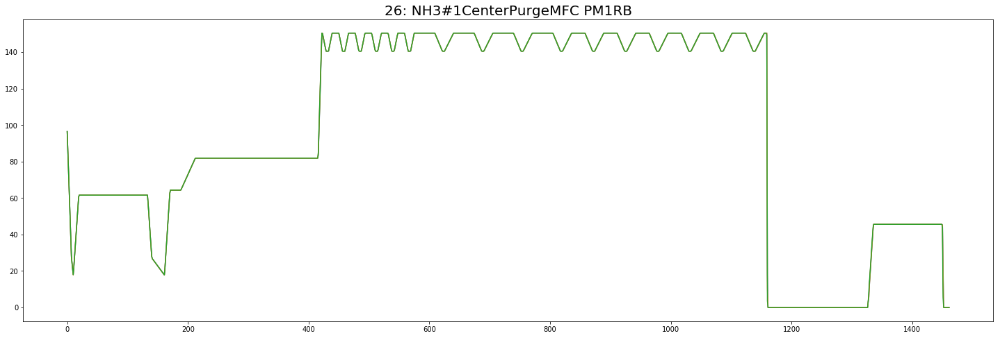

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


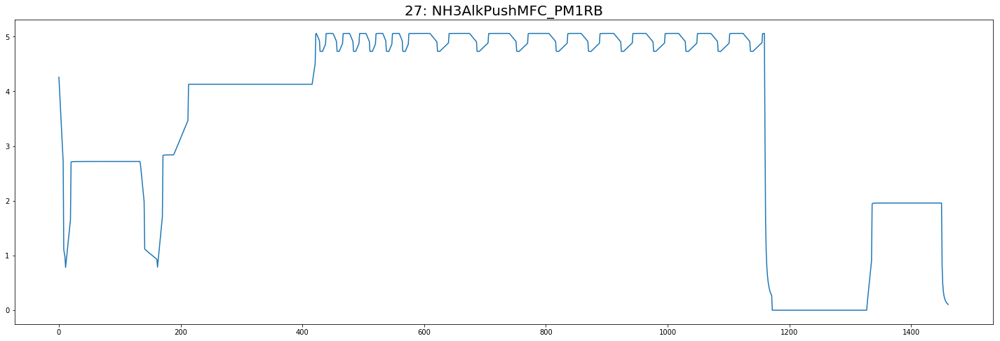

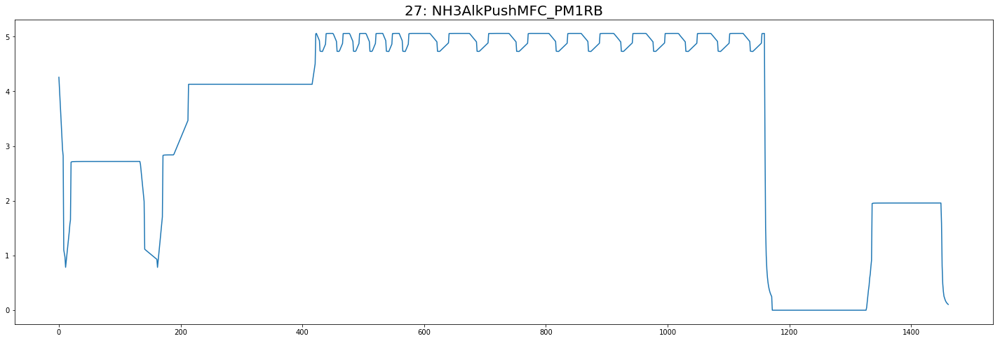

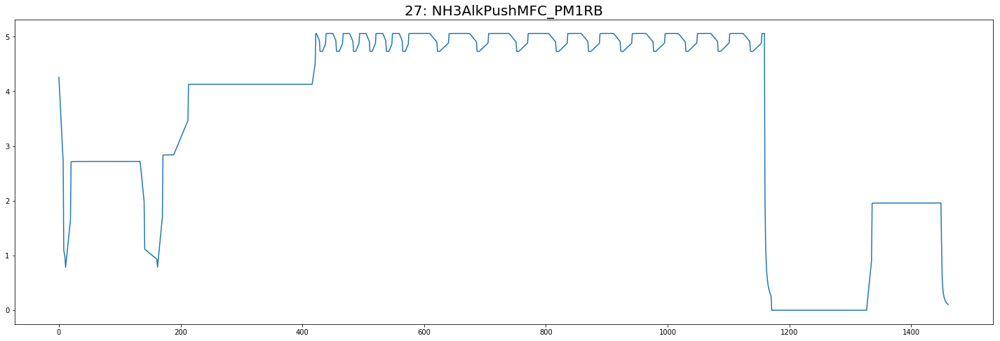

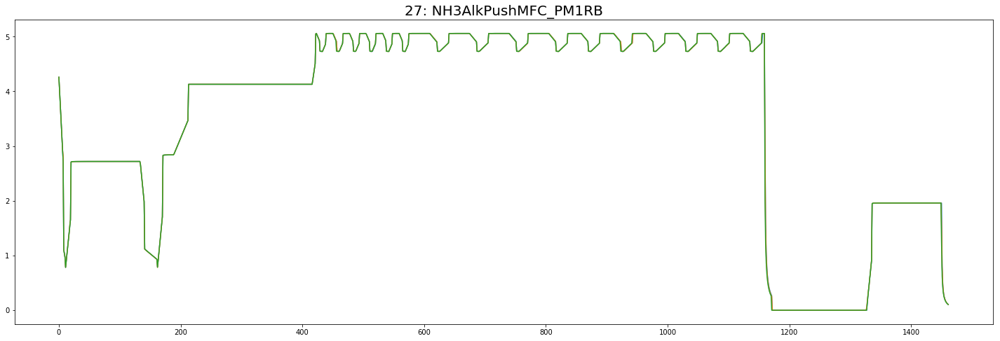

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


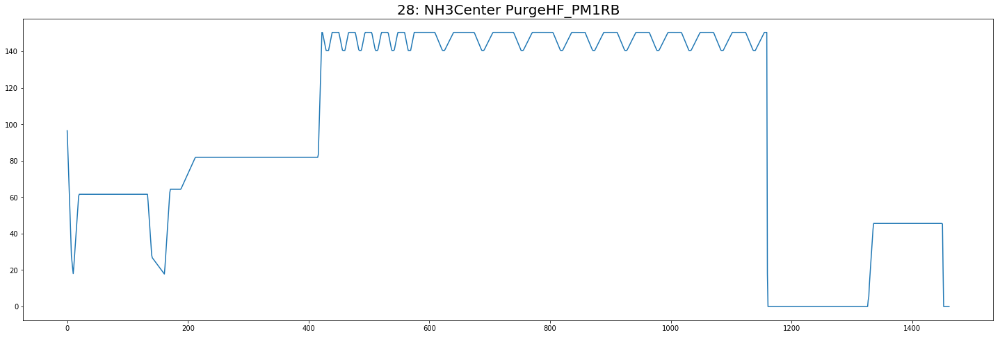

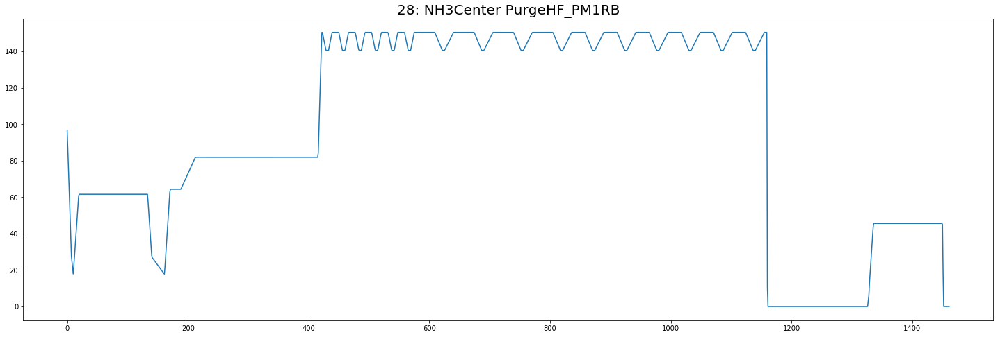

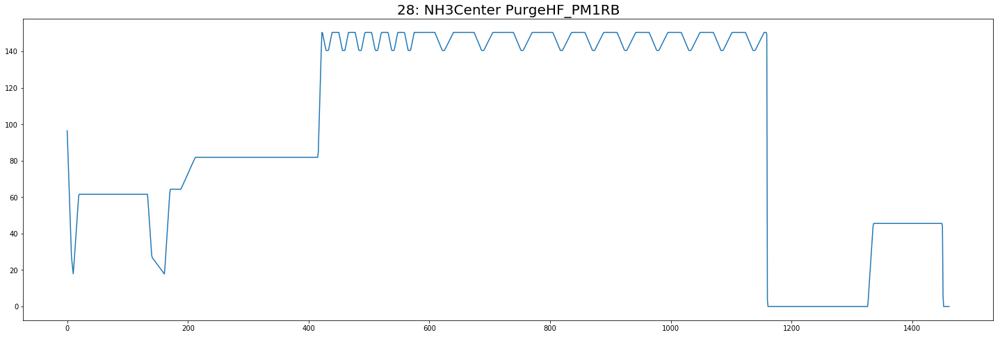

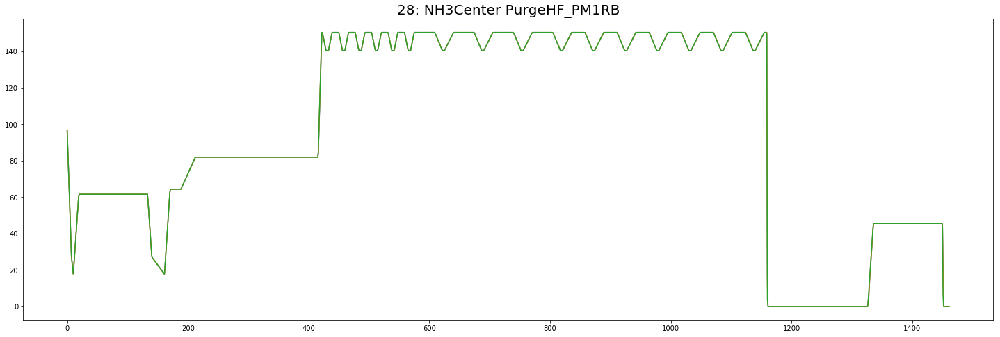

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


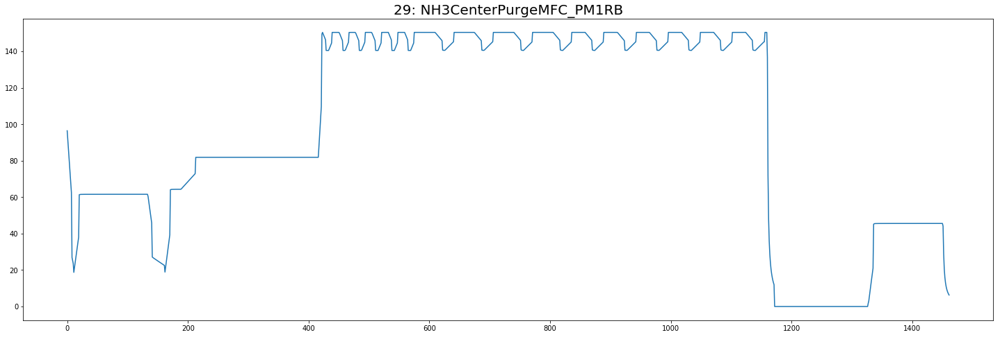

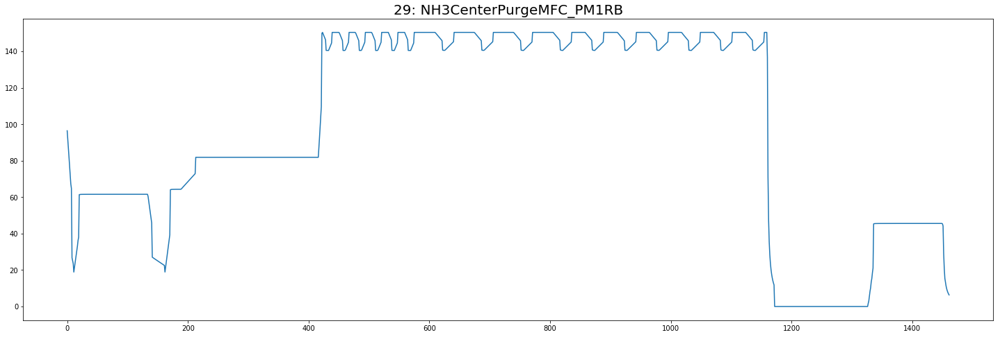

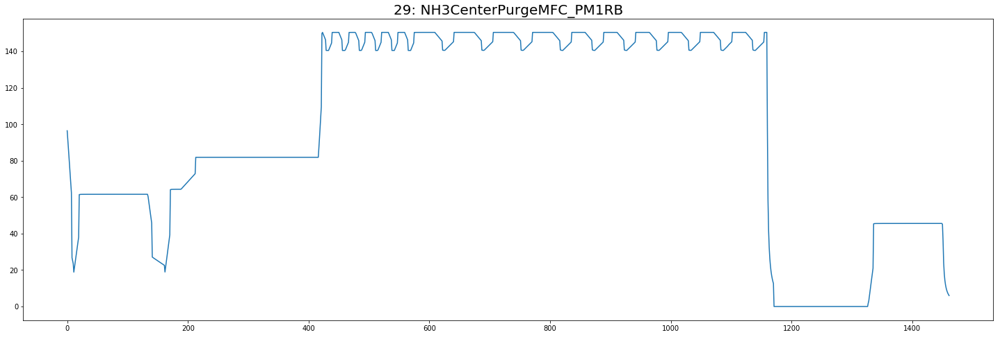

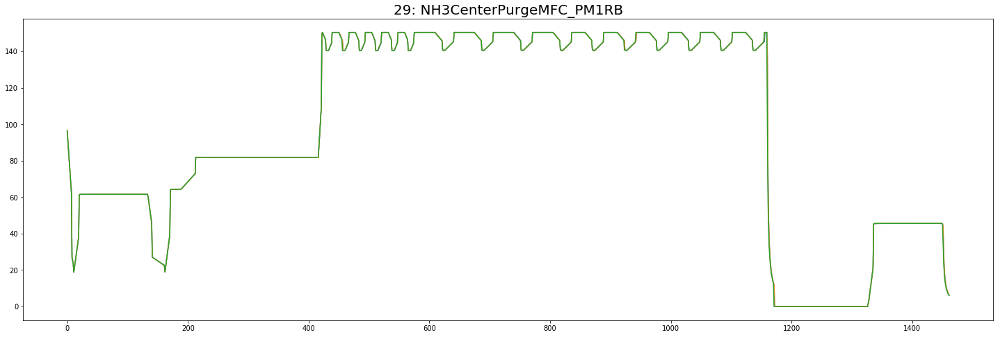

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


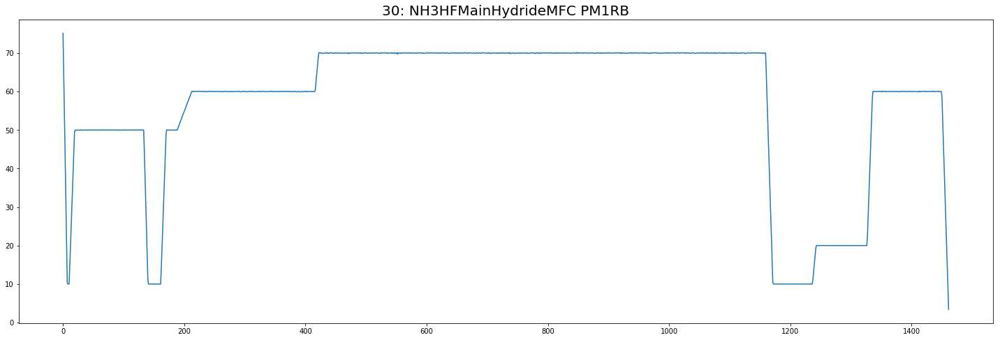

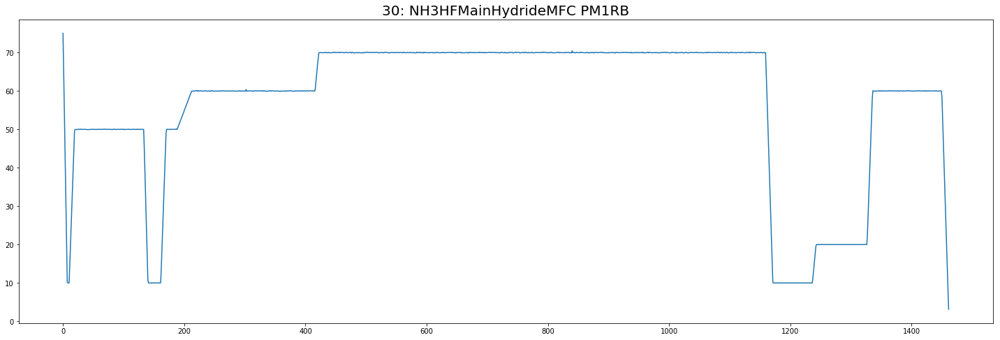

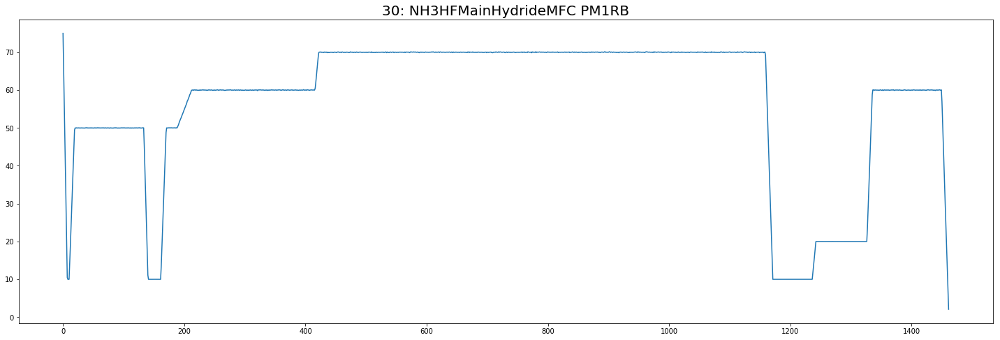

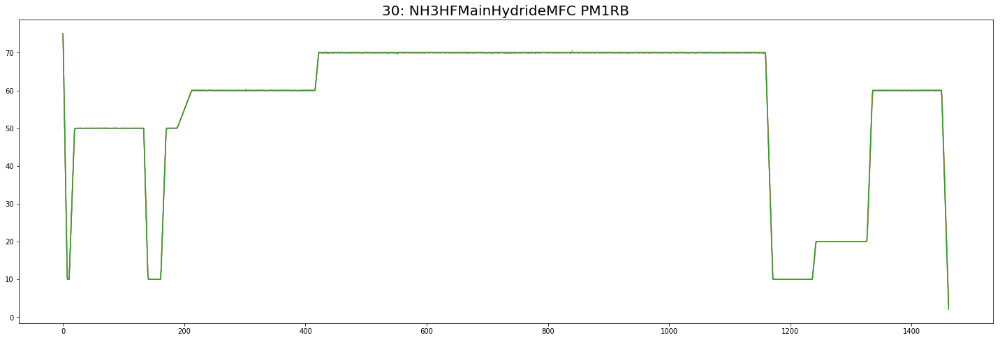

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


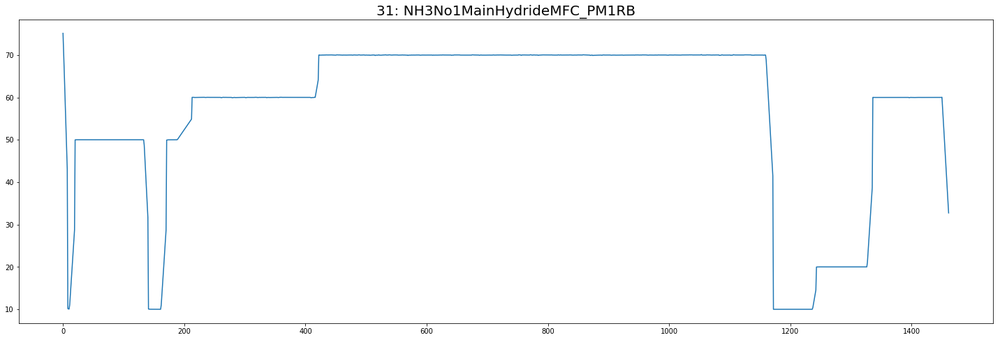

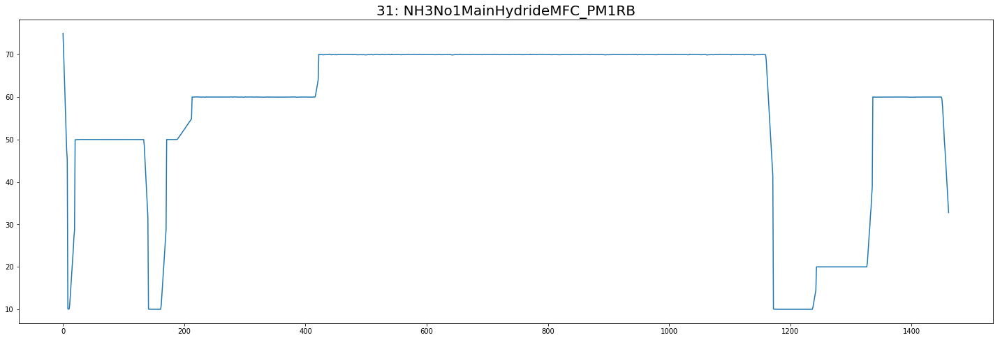

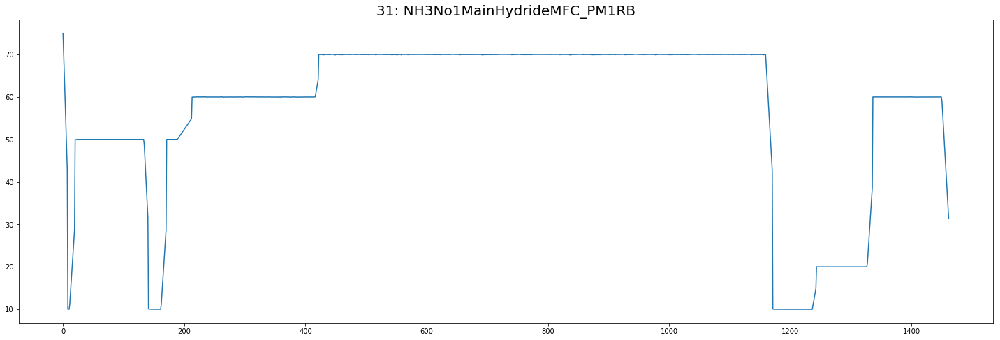

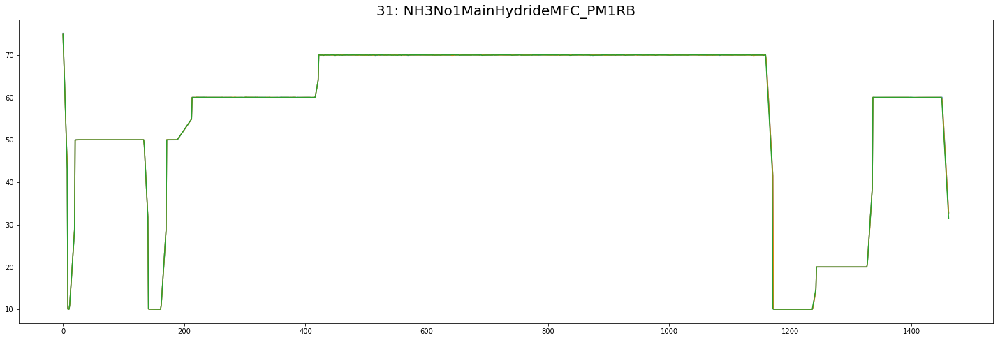

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


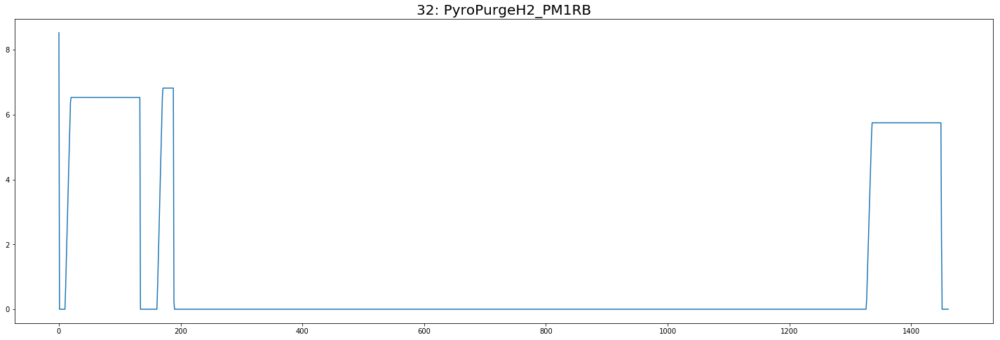

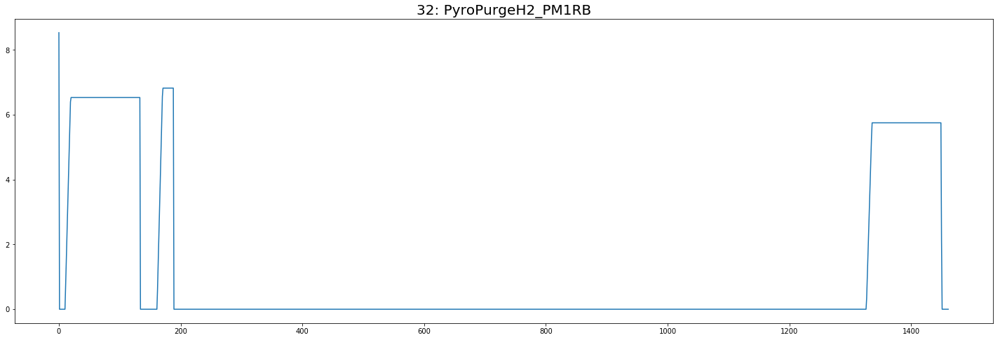

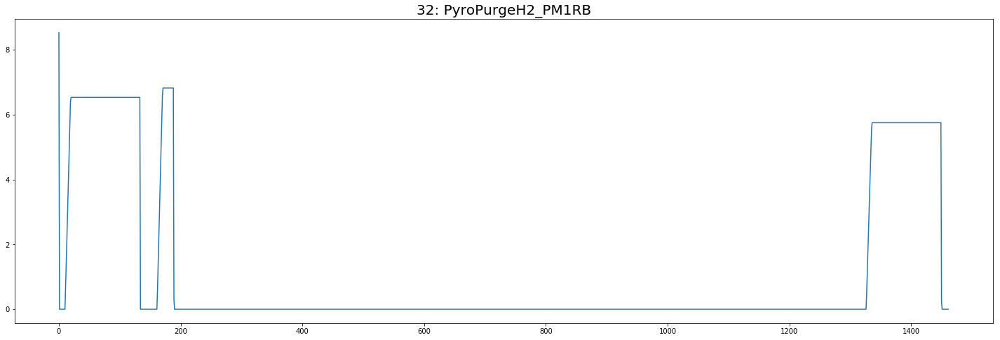

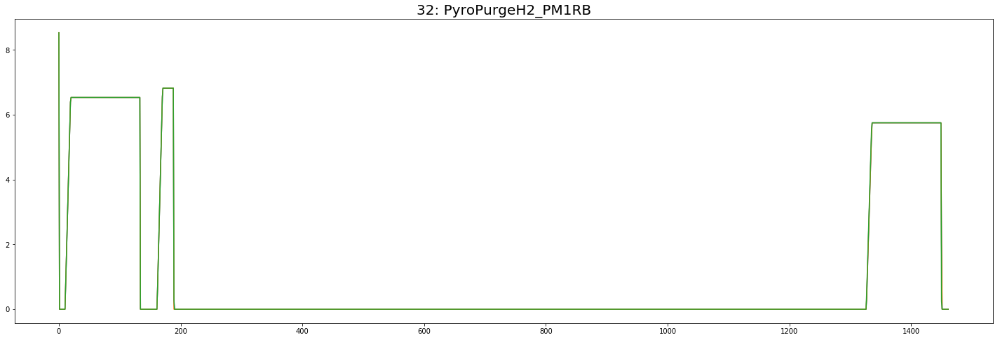

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


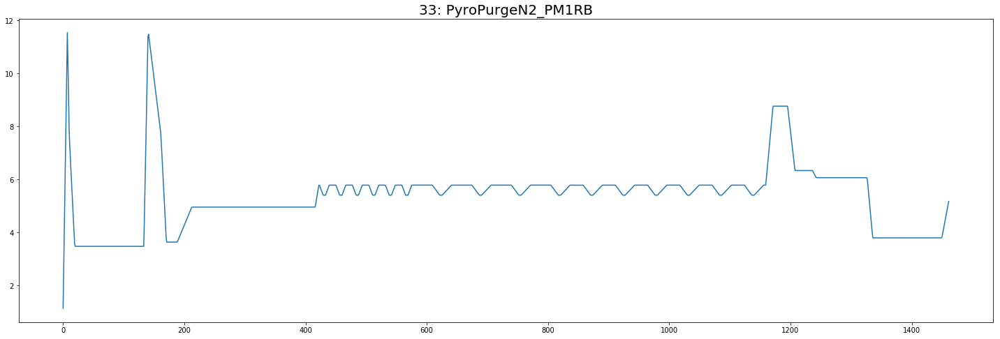

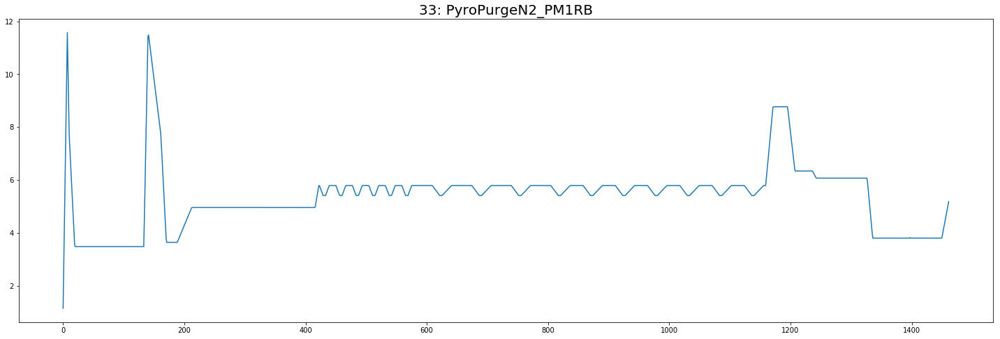

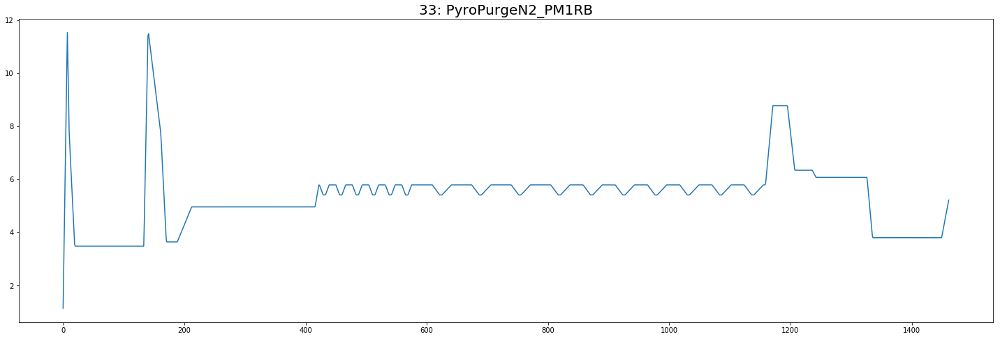

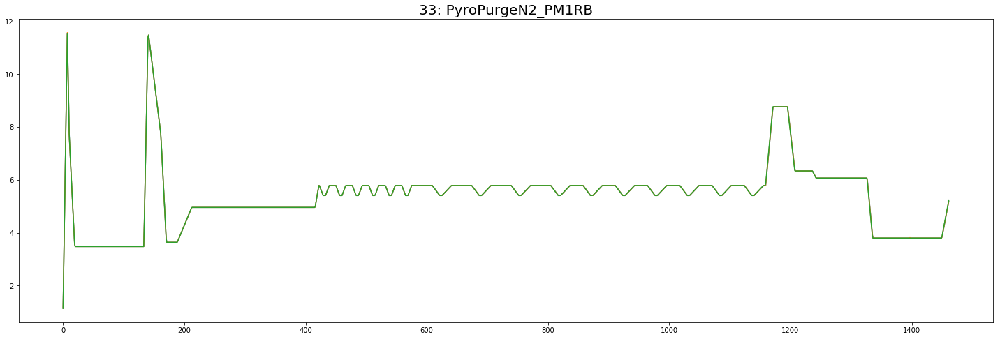

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


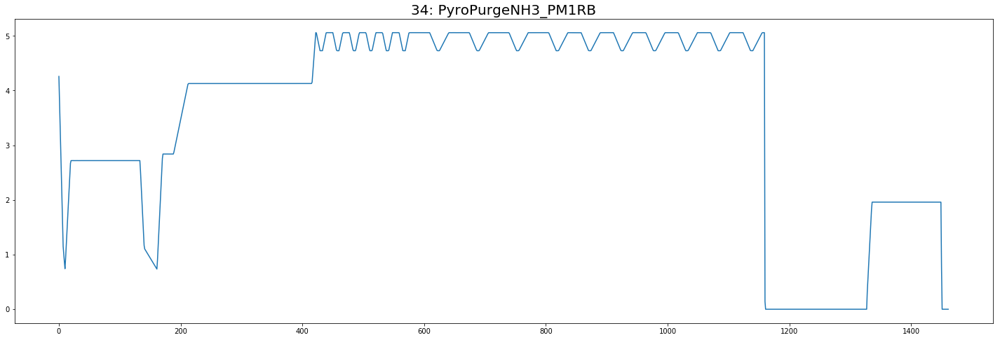

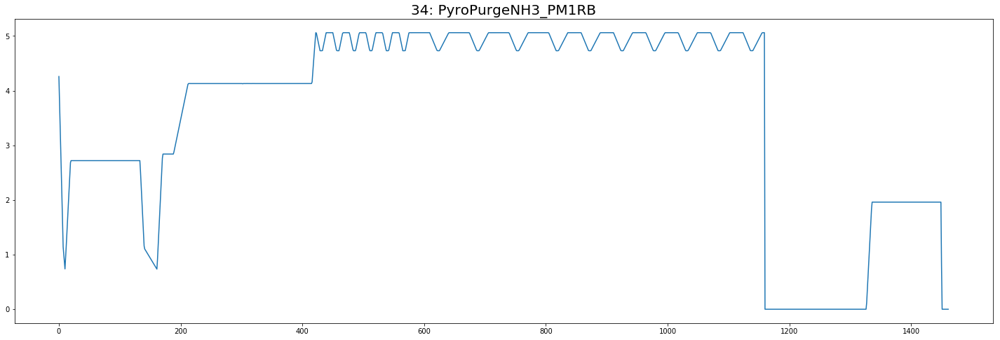

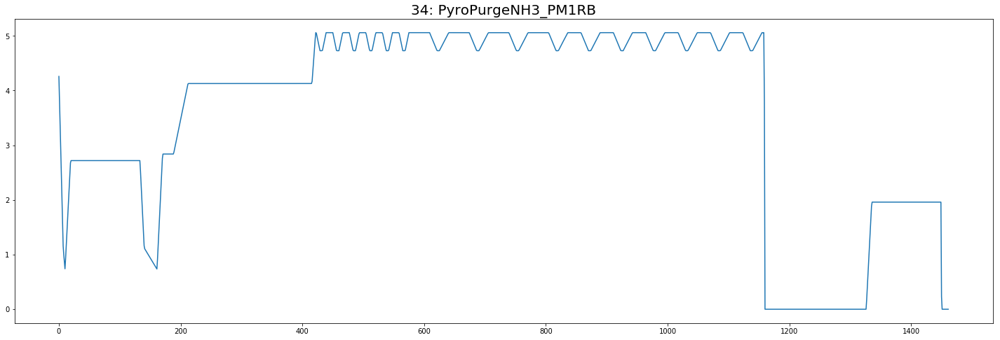

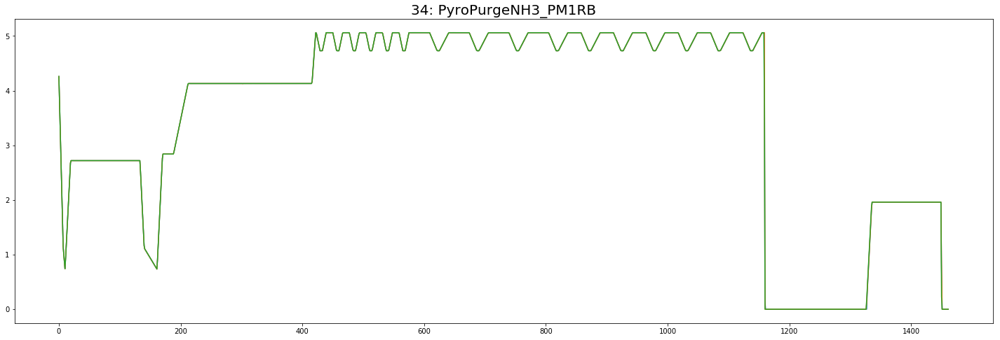

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


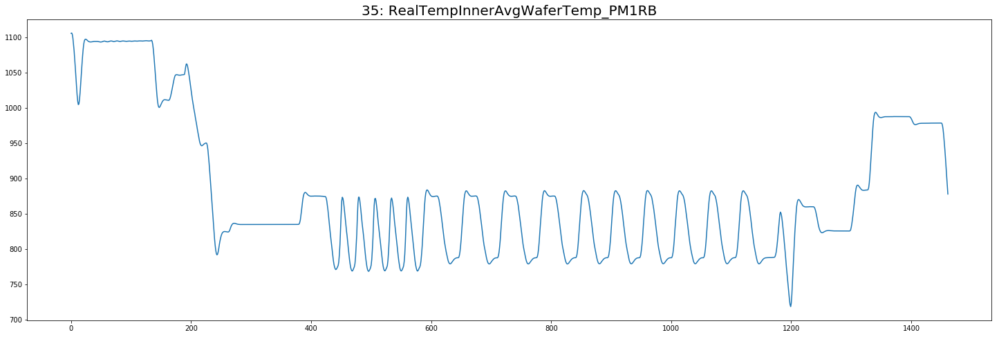

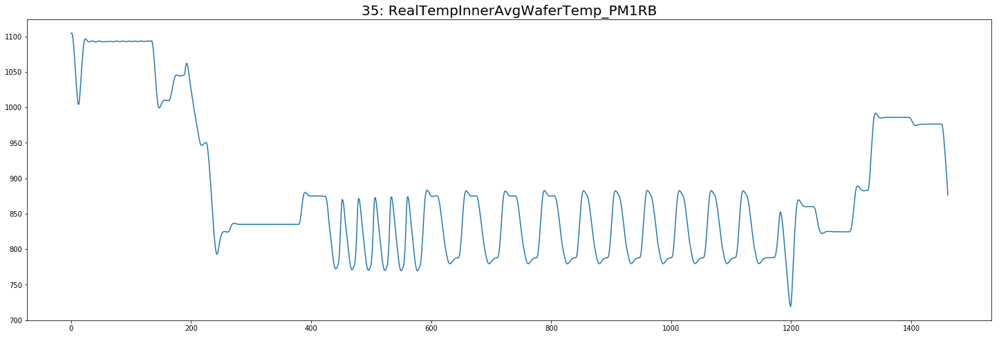

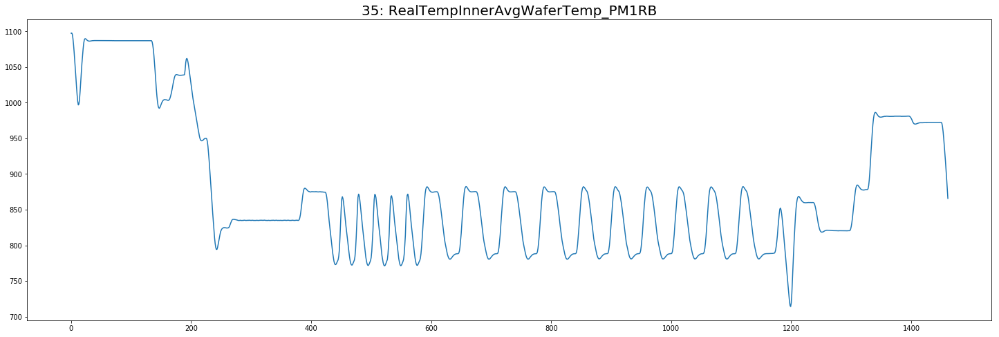

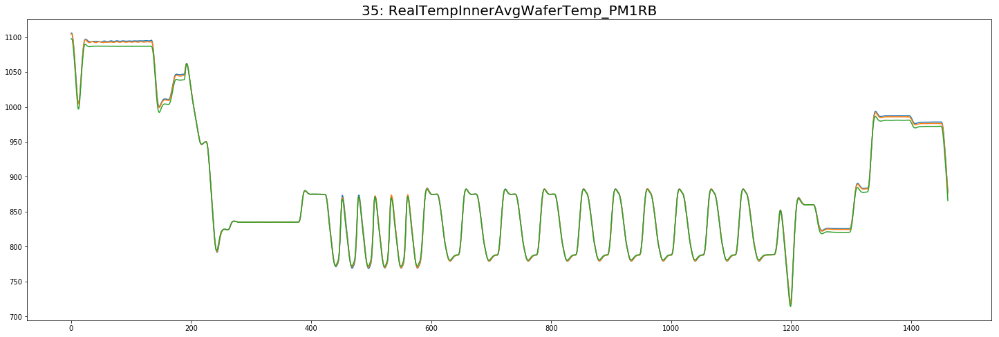

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


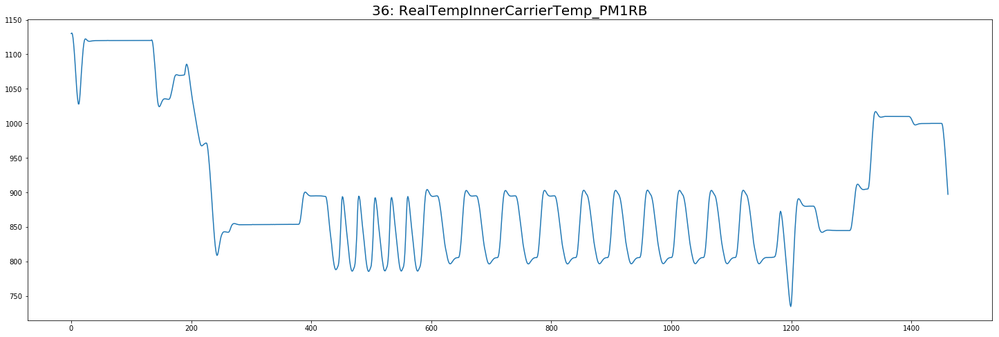

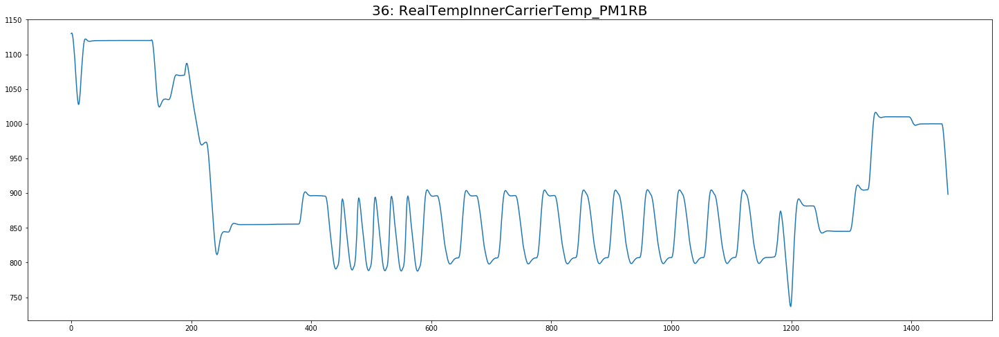

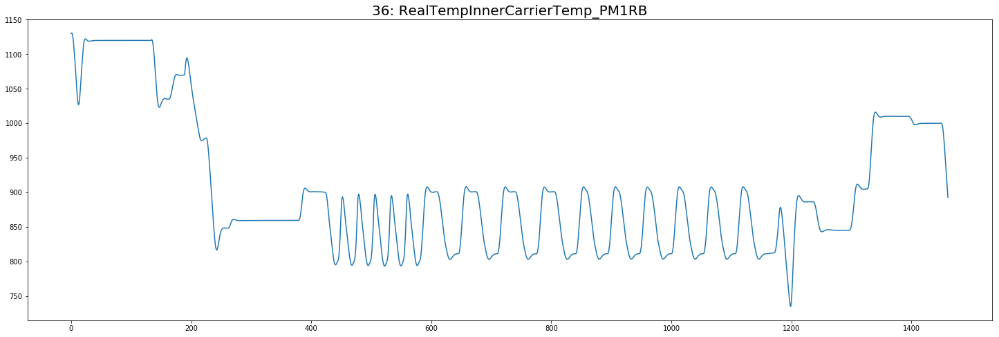

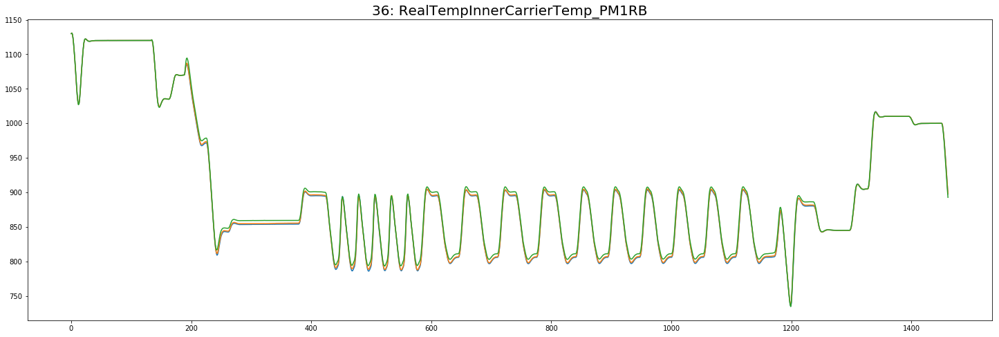

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


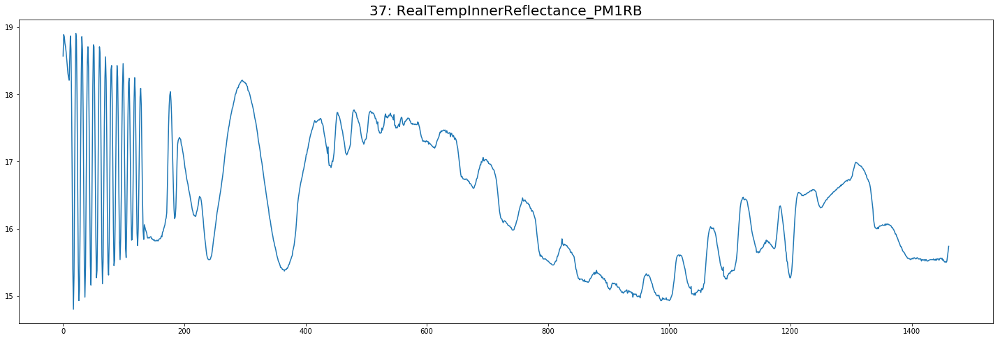

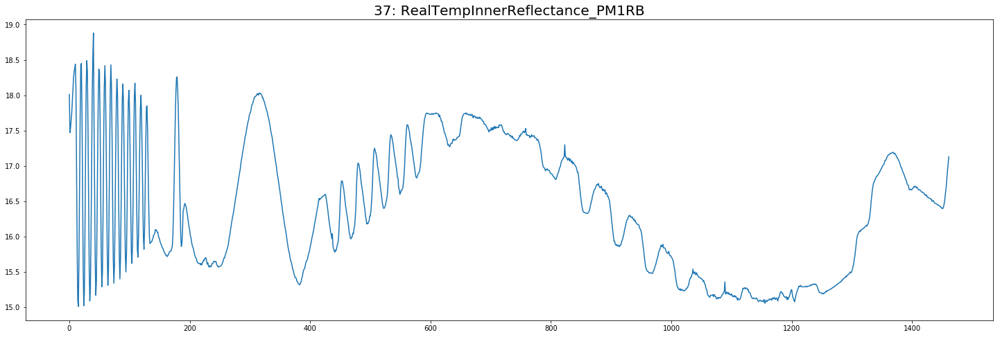

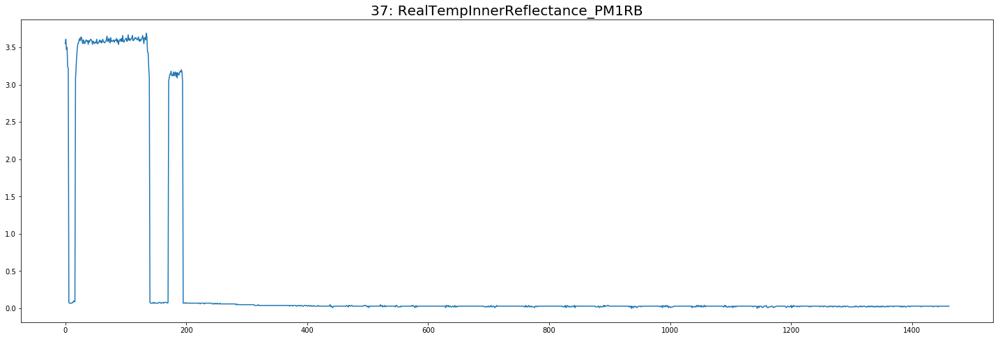

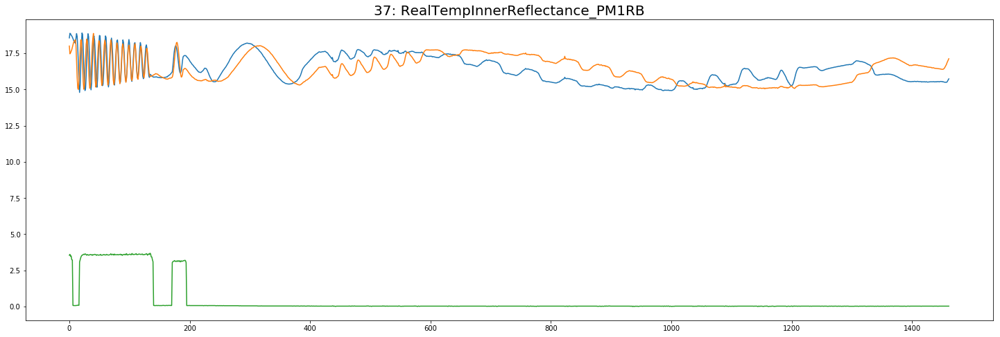

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


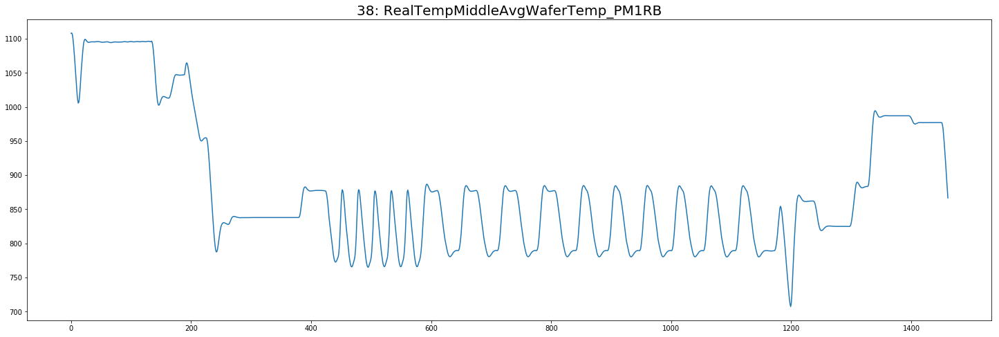

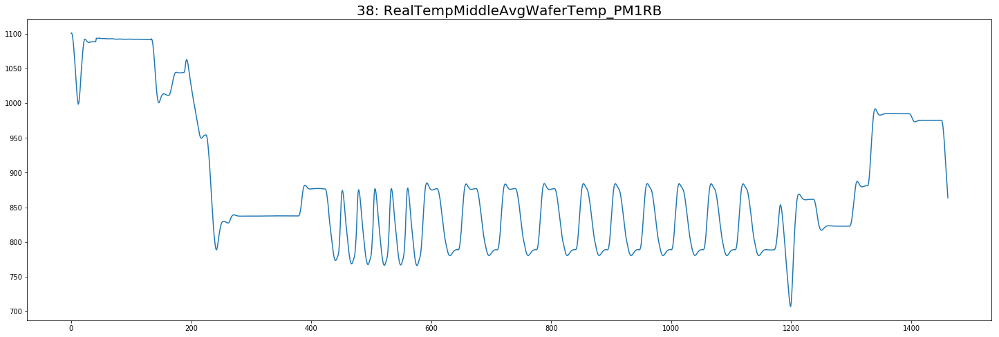

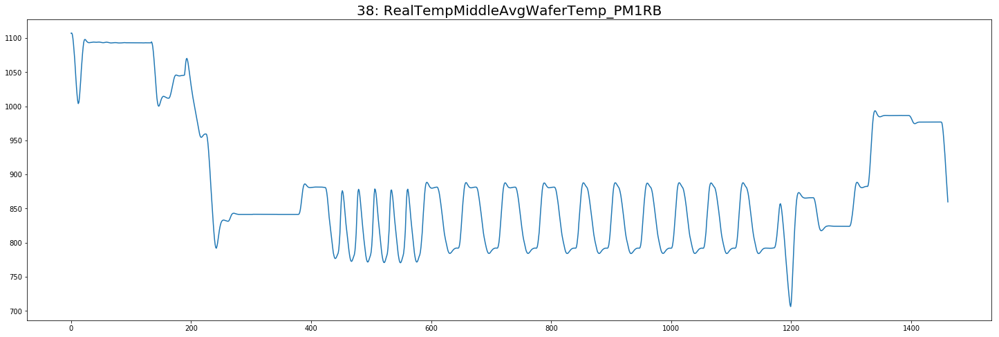

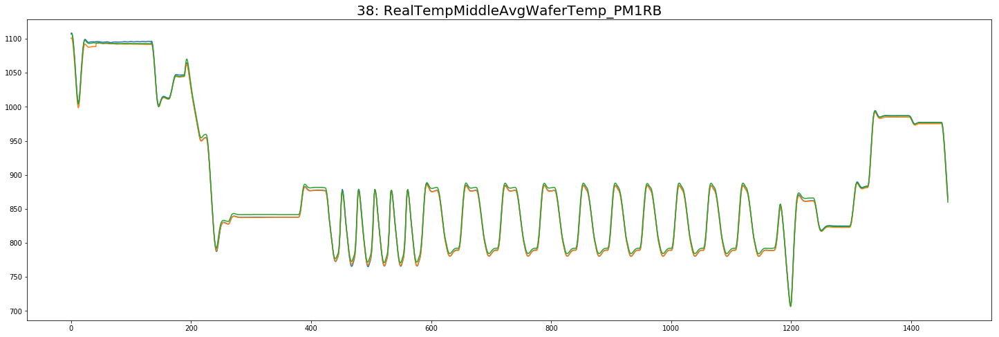

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


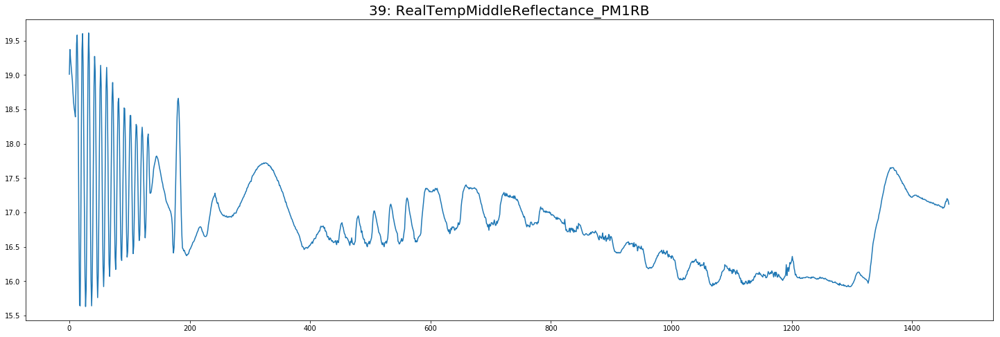

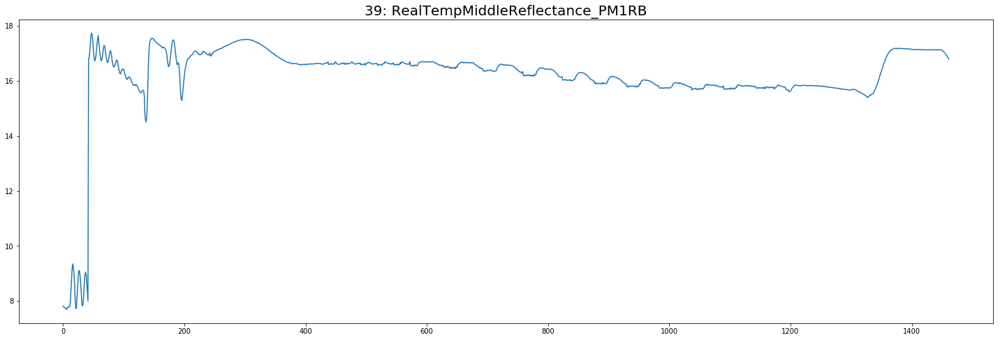

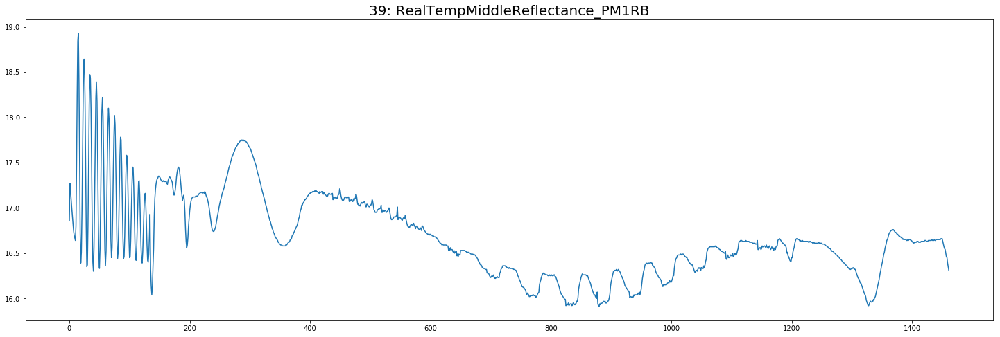

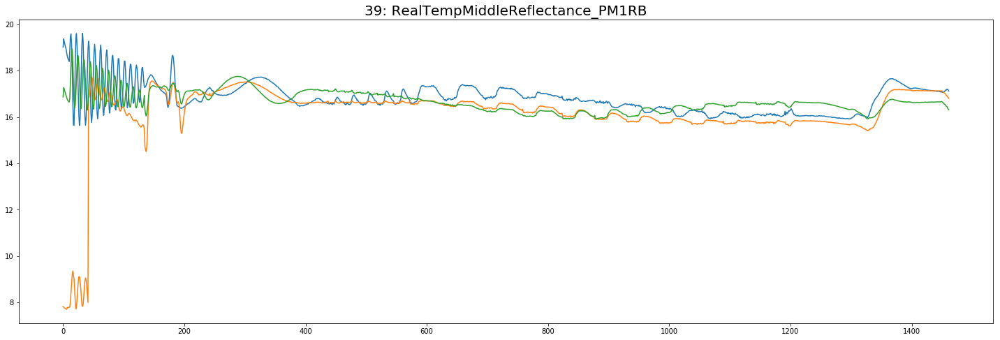

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


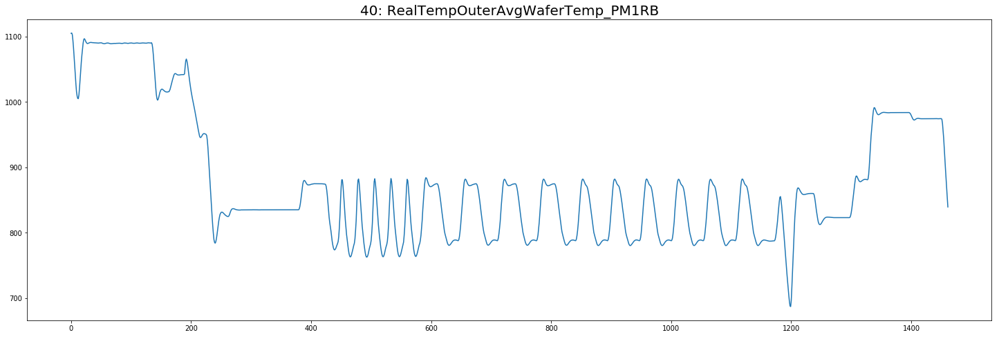

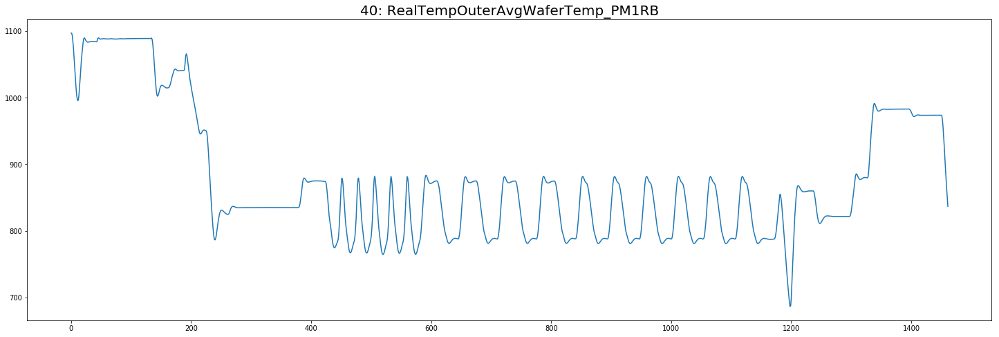

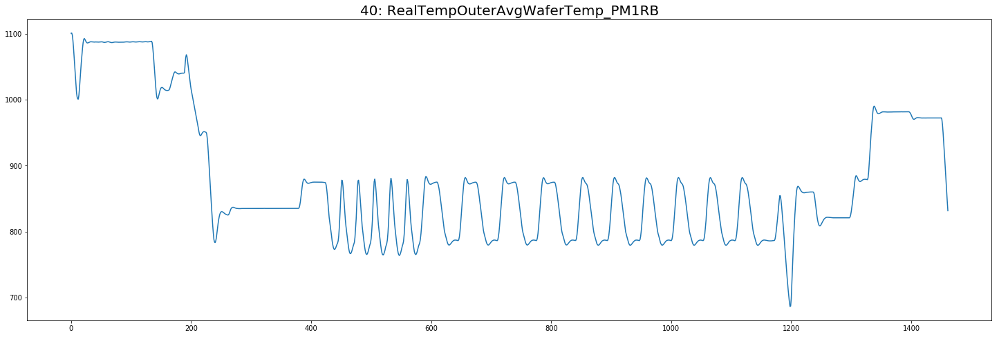

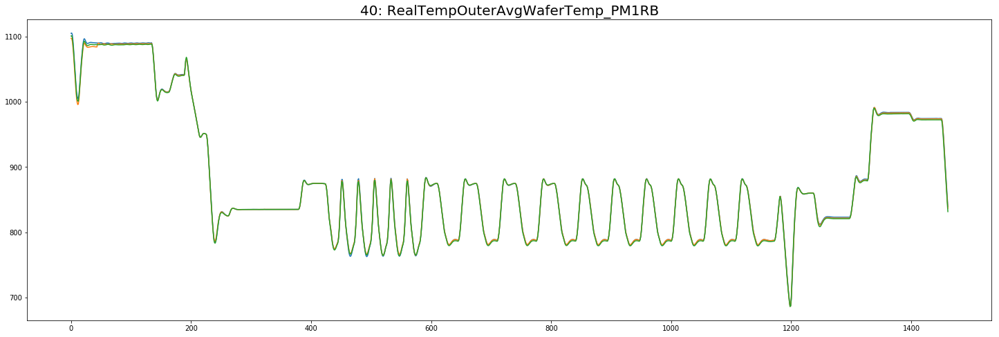

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


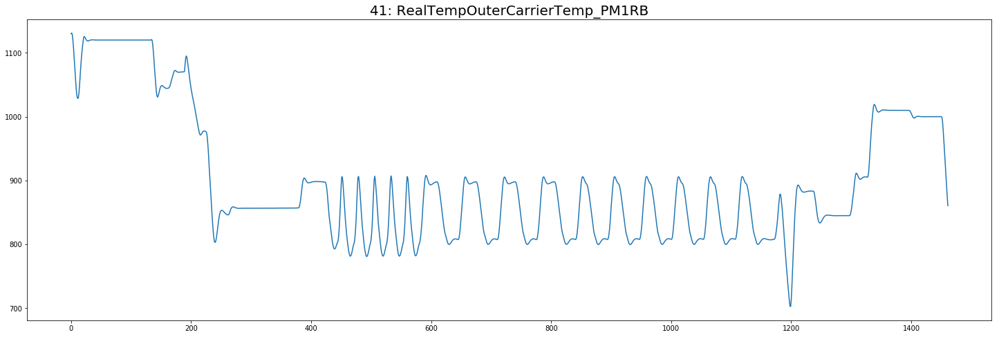

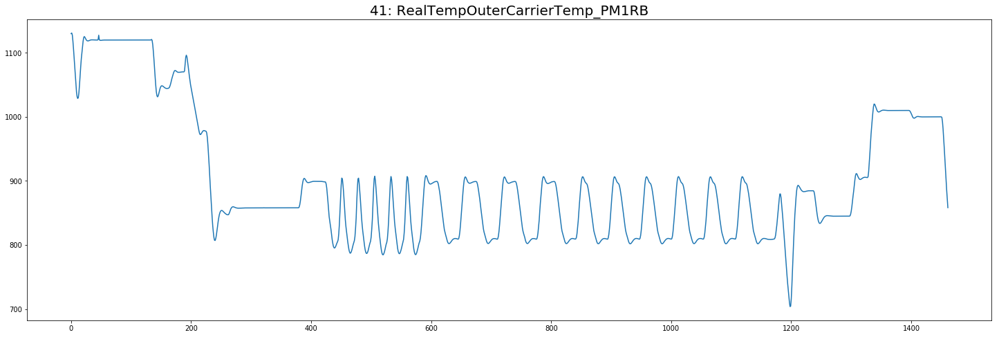

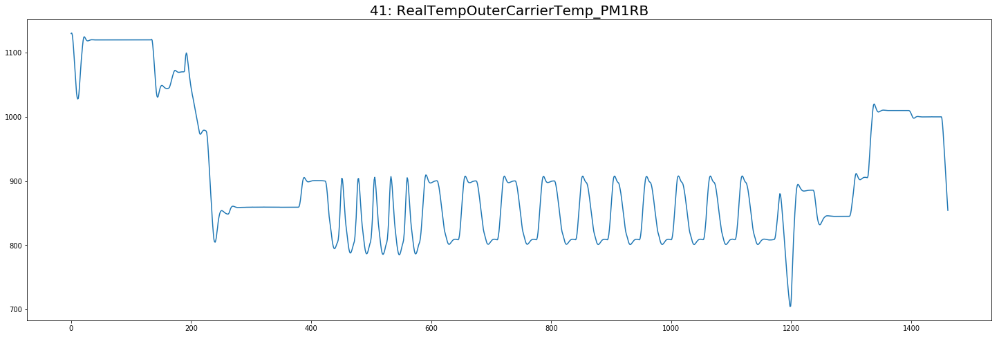

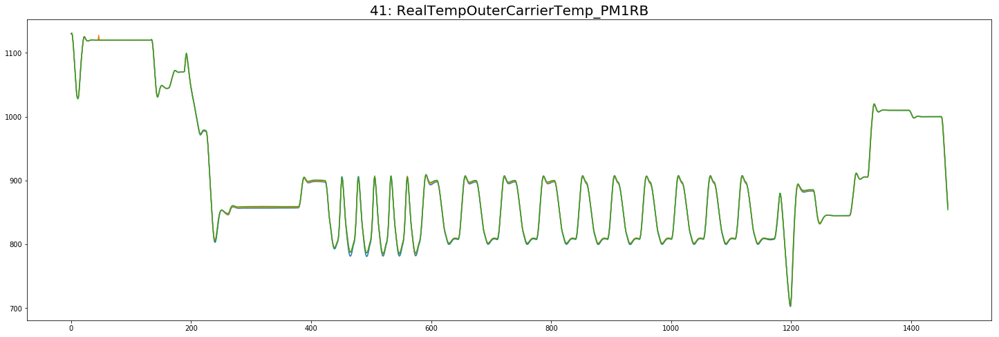

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


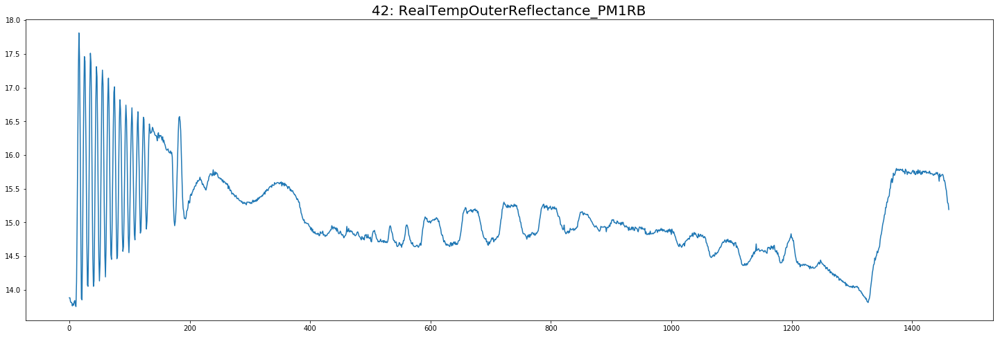

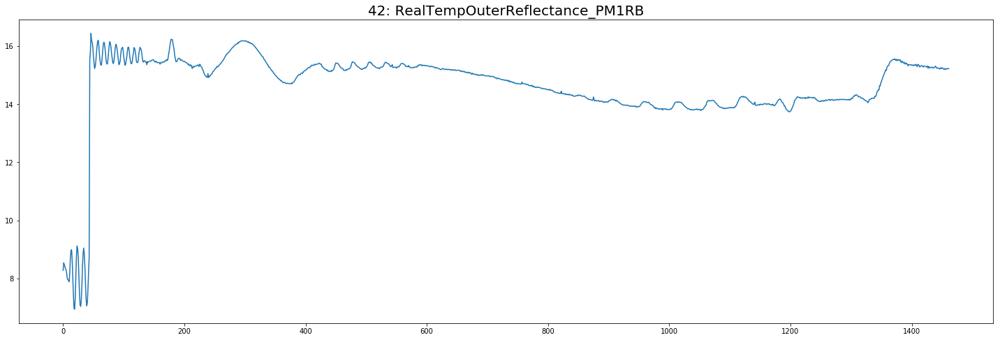

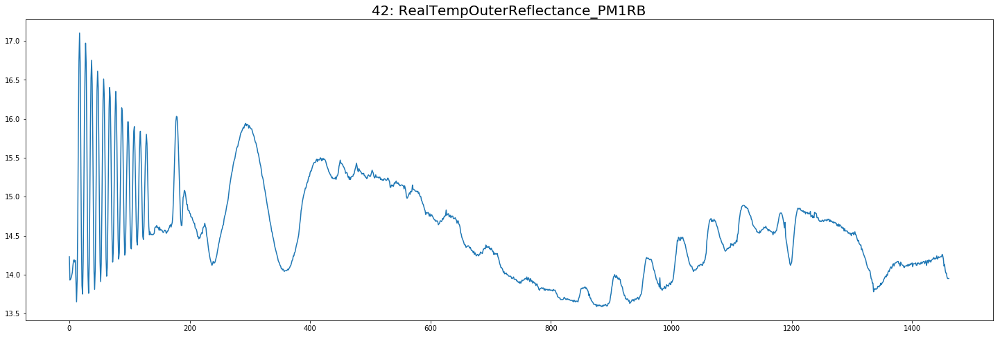

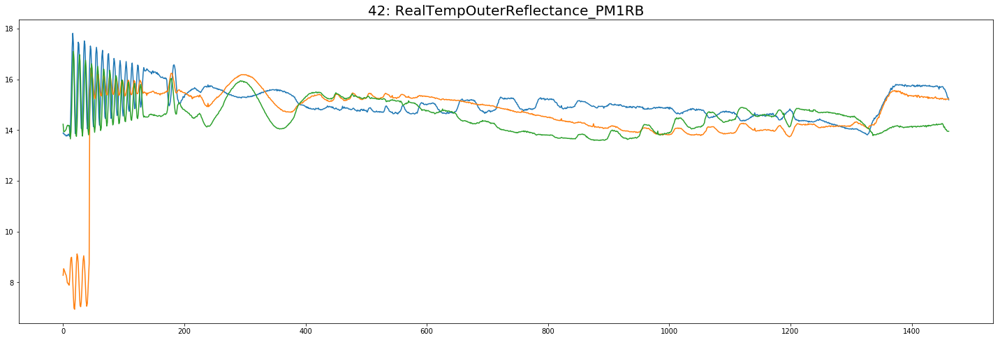

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


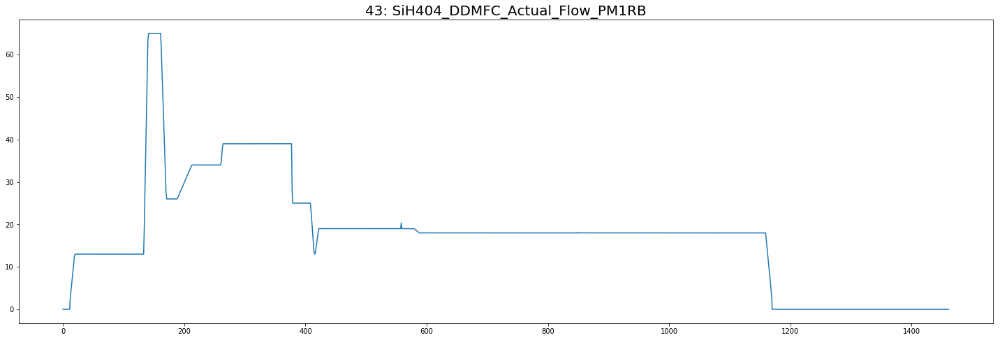

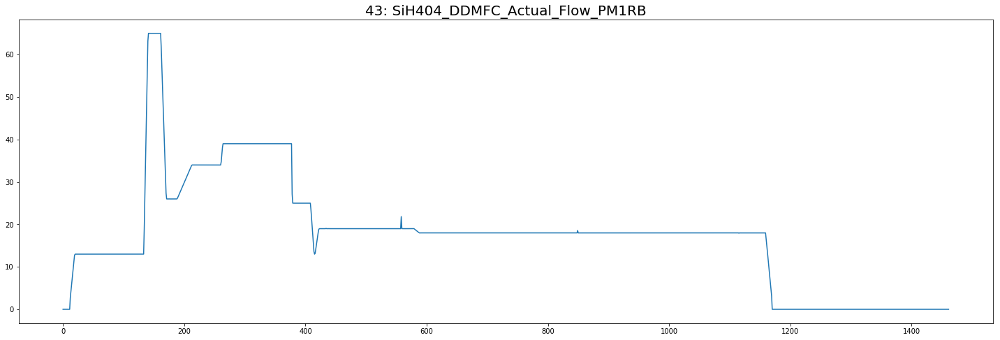

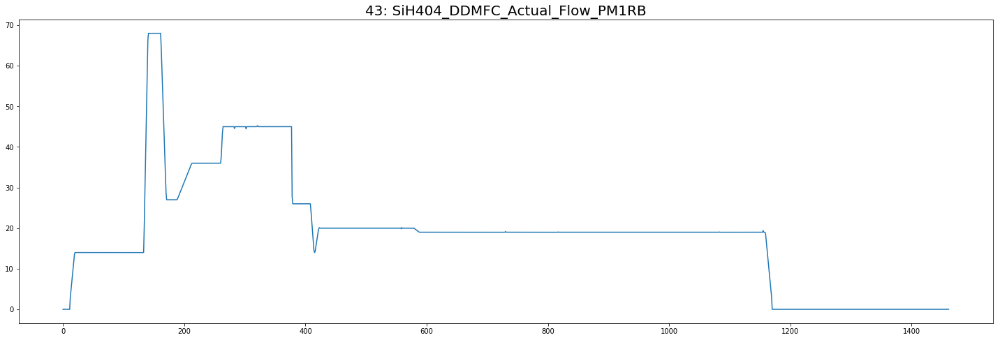

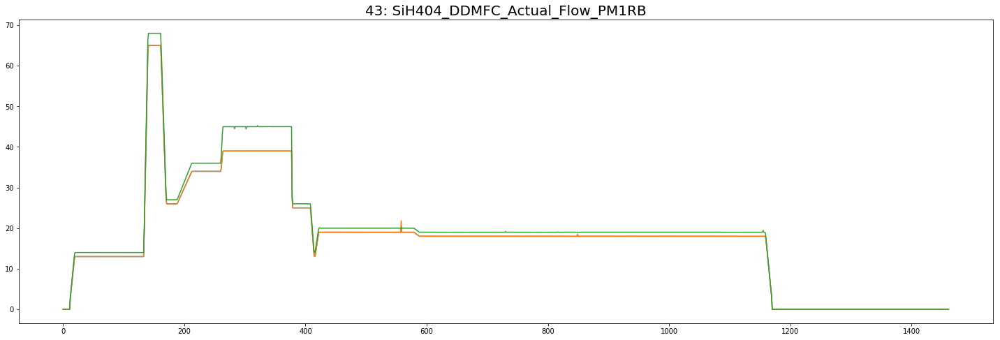

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


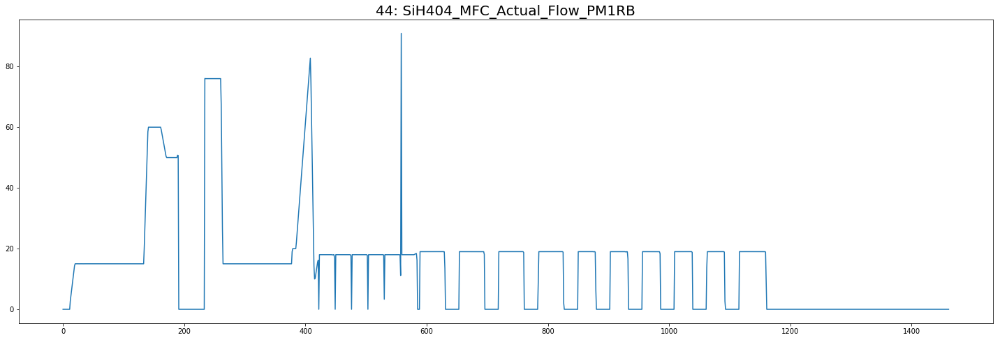

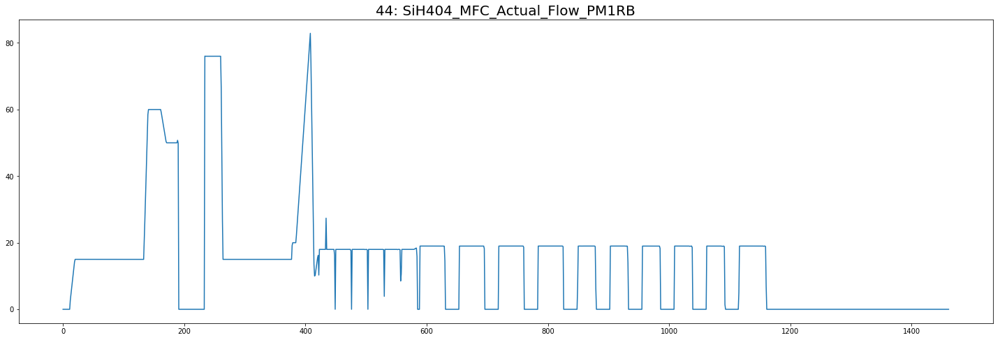

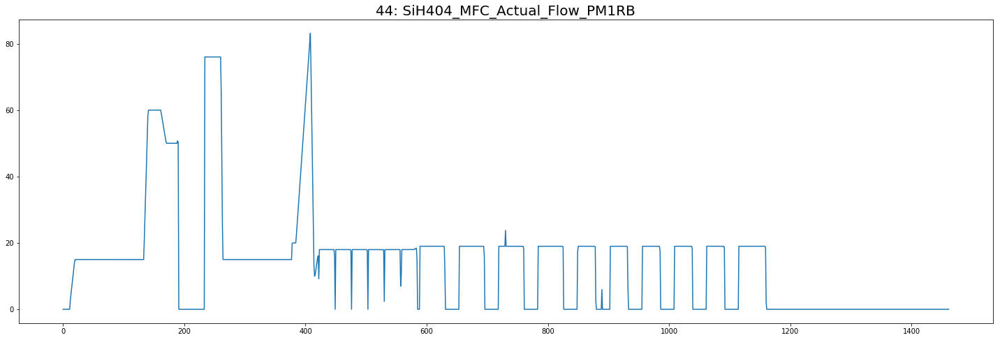

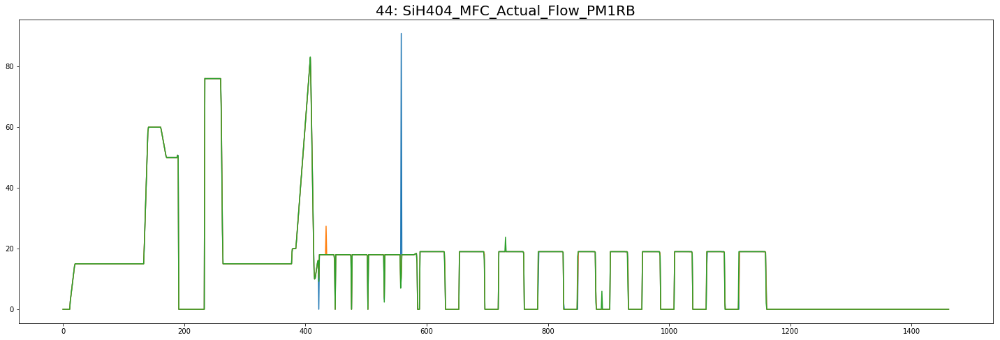

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


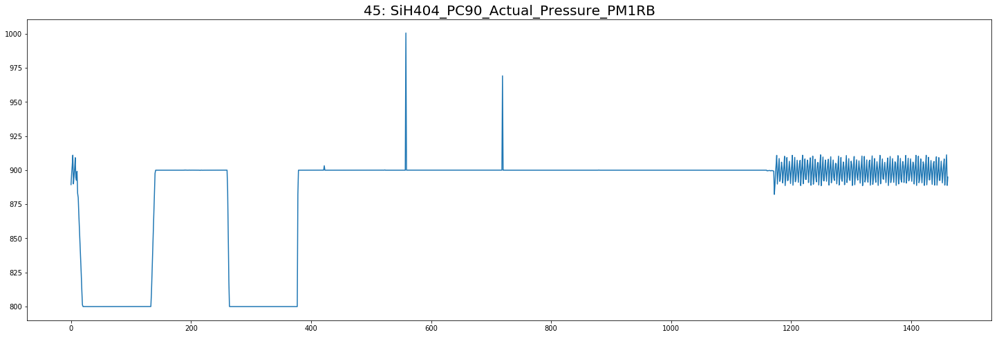

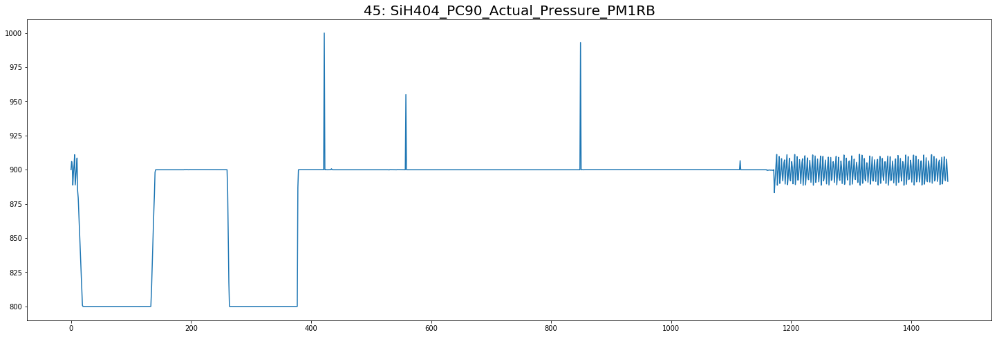

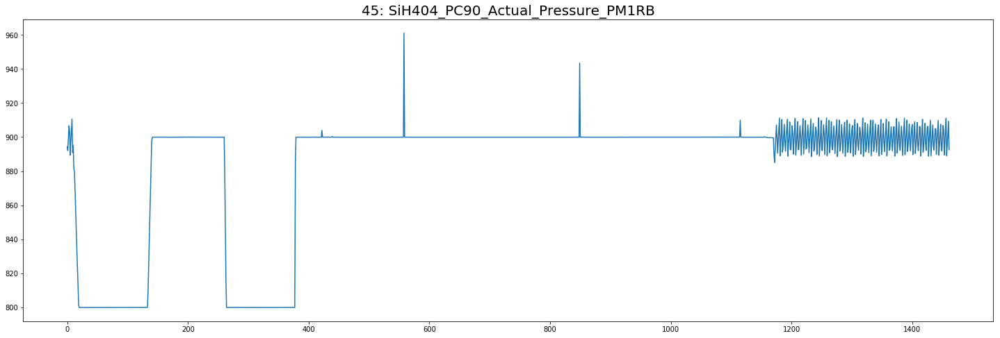

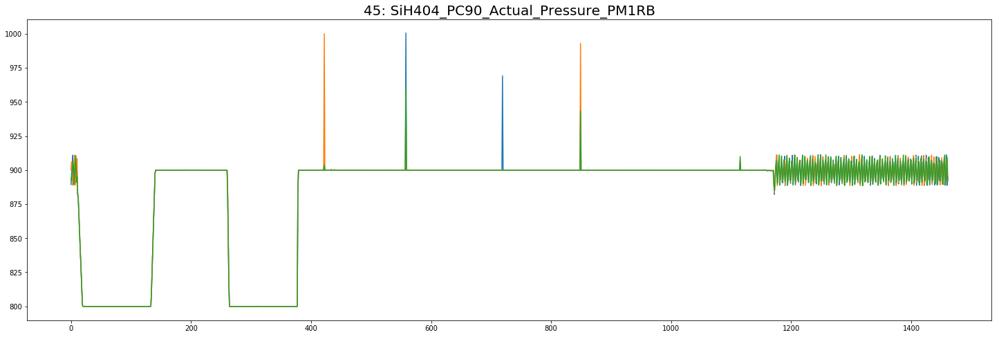

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


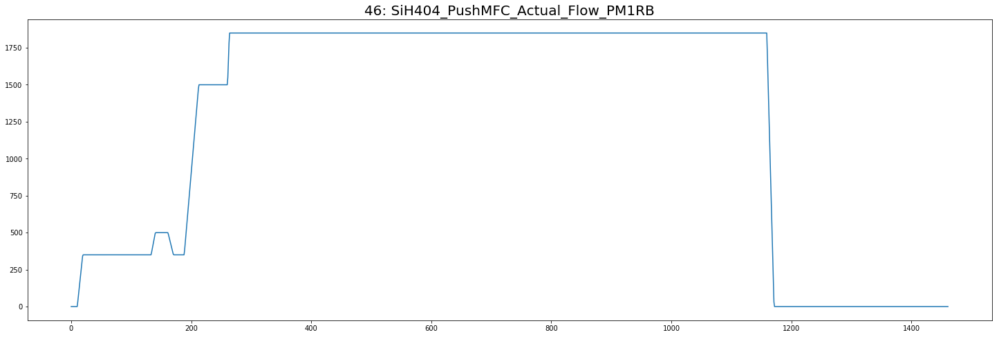

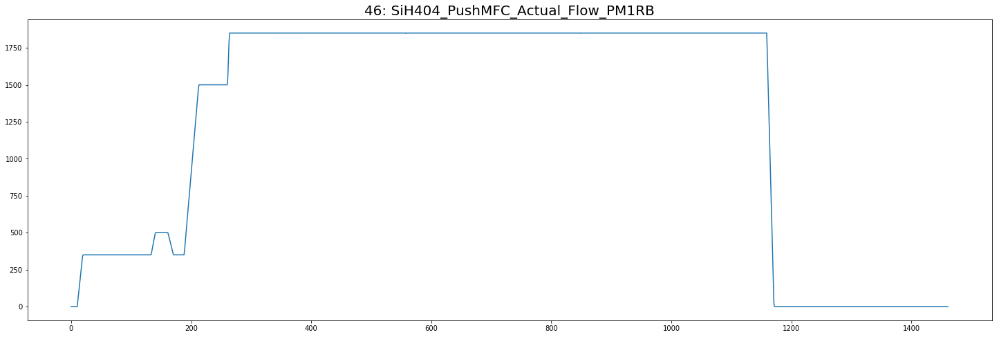

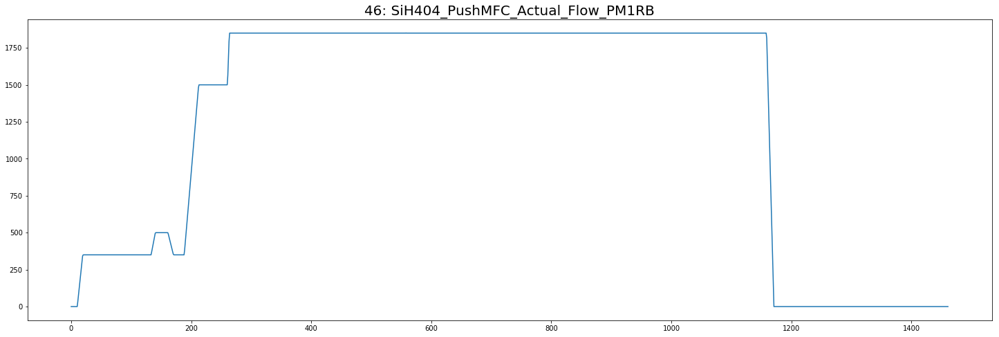

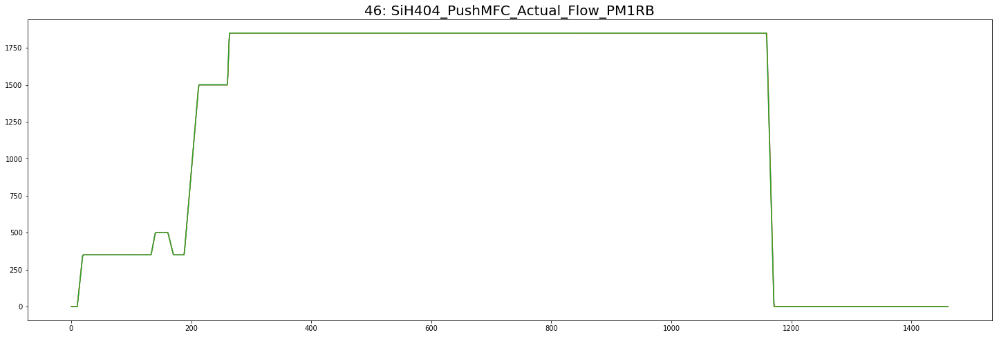

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################


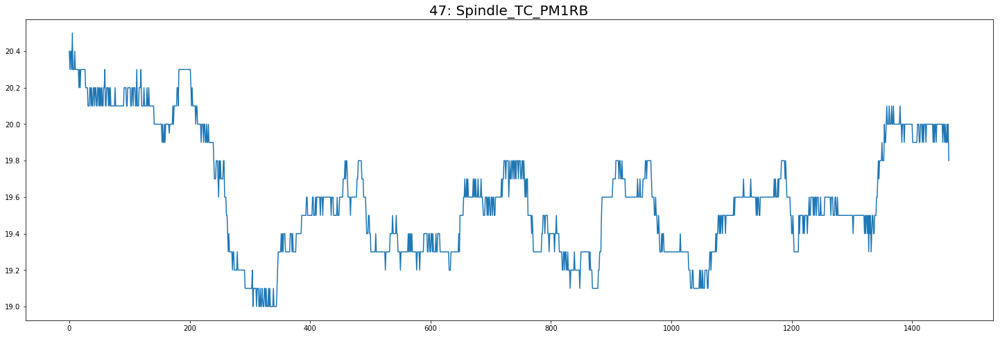

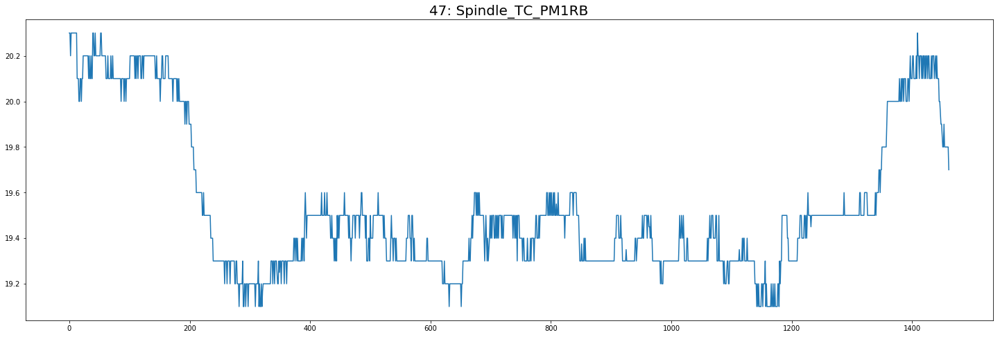

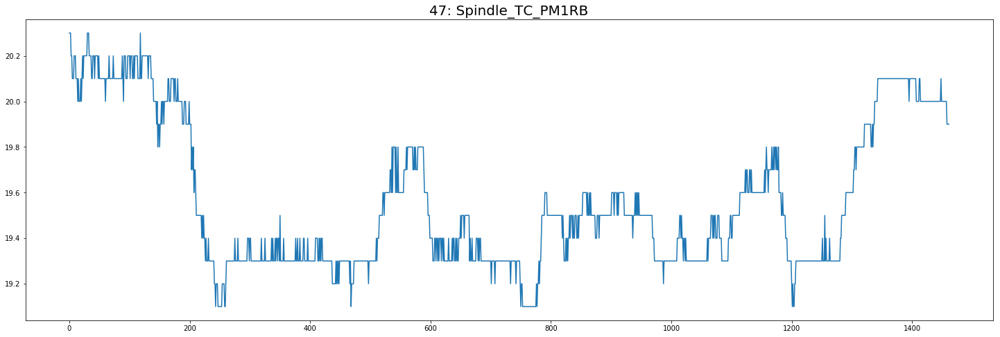

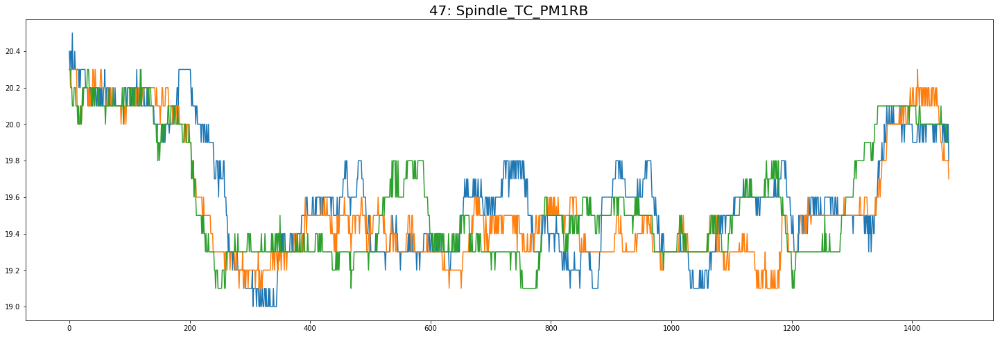

###########################################################################################################################
###########################################################################################################################
###########################################################################################################################
@@@@@@@@@@@@ load_data end! @@@@@@@@@@@@
####################################################
####################################################


In [2]:
class load_data:

    def __init__(self, \
                 data_folder_path, \
                 tool_id, \
                 normalize, \
                 sample, \
                 load_data_mode):
                 
        self.data_folder_path = data_folder_path
        self.tool_id = tool_id
        self.normalize = normalize
        if sample == 0 or sample == 1:
            self.sample = False
        else:
            self.sample = sample
        self.load_data_mode = load_data_mode
    
    
    
    def __call__(self):
    
        print("####################################################")
        print("####################################################")
        print("@@@@@@@@@@@@ load_data start! @@@@@@@@@@@@")
        
        
        ### check whether the data already exists
        
        if self.load_data_mode == 0:
        
            file_name = os.path.join(self.tool_id + "_normalize=" + ("T" if self.normalize else "F") + \
                                     "_sample=" + (str(self.sample) if self.sample else "F") + ".pickle")
            input_data_path = os.path.join(self.data_folder_path, "input", self.tool_id, file_name)
            if os.path.exists(input_data_path):
                print(file_name + " exists!")
                with open(input_data_path, 'rb') as pickle_file:
                    print("@@@@@@@@@@@@ load_data end! @@@@@@@@@@@@")
                    print("####################################################")
                    print("####################################################")
                    
                    return pickle.load(pickle_file)
            else:
                print(file_name + " doesn't exist!")
        
        
        ### load data
        
        data = pd.read_csv(filepath_or_buffer = open(os.path.join(self.data_folder_path, "input", self.tool_id, self.tool_id + "_original.csv")))
        
        #data = data.drop(["SiH404_MFC_Actual_Flow_PM1RB"], axis = 1, errors = "ignore")
        
        if self.tool_id == "Synthetic_Data":
            state_name = data["STATE"]
            data = data.drop(["STATE"], axis = 1, errors = "ignore")
        else:
            state_name = data["LAYER"]
            data = data.drop(["EQP_ID", "START_TIME", "END_TIME", "LOT_ID", "RECIPE", \
                                      "RUN_ID", "STEP_NUM", "LAYER", "TRACE_DATE", "TRACE_SEC"], axis = 1, errors = "ignore")
            attribute = list(data)
        
        data = {"time_series": data, "state_name": state_name}
        
        
        ### load data_index
        
        with open(os.path.join(self.data_folder_path, "input", self.tool_id, self.tool_id + "_original" + ".json"), "r") as input_file:
            data_index = json.load(input_file)
            data_index = data_index["data_index"]
        
        
        ### normalize the data
        
        data = self.normalize_data(data)
        
        
        ### align data_length
        
        data = self.align_data_length(data, data_index)
        
        
        ### sample the data
        
        data = self.sample_data(data)
        
        
        ### add attribute to data
        
        data["attribute"] = attribute
        
        
        if self.load_data_mode == 0:
        
            ### save the data to pickle
            
            self.save_data(data)
        
        elif self.load_data_mode == 1:
        
            ### plot the data
            
            self.plot_data(data, data_index)
        
        
        print("@@@@@@@@@@@@ load_data end! @@@@@@@@@@@@")
        print("####################################################")
        print("####################################################")
        
        
        ### the format of data is data[r][t][n]
        
        return data



    def normalize_data(self, data):

        data["time_series"] = data["time_series"].values
        
        if self.normalize == False:
            normalize_time_series = data["time_series"]
        else:
            scaler = StandardScaler()
            normalize_time_series = scaler.fit_transform(data["time_series"])
        
        normalize_time_series = normalize_time_series.tolist()

        return {"time_series": normalize_time_series, "state_name": data["state_name"]}



    def align_data_length(self, data, data_index):

        ### calculate the minima length of all data
        
        min_length = min(data_index, key = itemgetter("length"))["length"]
        
        
        ### change all data_length to min_length
        
        align_data = {"time_series": [], "state_name": []}
        for lot in data_index:
            align_data["time_series"].append(data["time_series"][ lot["start_index"] : lot["start_index"] + min_length ])
            align_data["state_name"].append(data["state_name"][ lot["start_index"] : lot["start_index"] + min_length ])
        
        return align_data



    def sample_data(self, data):
        
        if self.sample == False:
            sample_data = data
        else:
            sample_data = {"time_series": [], "state_name": []}
            
            for run_idx, run in enumerate(data["time_series"]):
                sample_data["time_series"].append([])
                for element_idx, element in enumerate(run):
                    if element_idx % self.sample == 0:
                        sample_data["time_series"][run_idx].append(element)
            
            for run_idx, run in enumerate(data["state_name"]):
                sample_data["state_name"].append([])
                for element_idx, element in enumerate(run):
                    if element_idx % self.sample == 0:
                        sample_data["state_name"][run_idx].append(element)

        return sample_data



    def plot_data(self, data, data_index):
        
        ### prepare output directory
        
        save_plot_path = os.path.join( self.data_folder_path, "input", self.tool_id, \
                                       self.tool_id + "_normalize=" + ("T" if self.normalize else "F") + \
                                       "_sample=" + (str(self.sample) if self.sample else "F") )
        
        if not os.path.exists(save_plot_path):
            try:
                os.makedirs(save_plot_path)
            except OSError as exc:  # Guard against race condition of path already existing
                if exc.errno != errno.EEXIST:
                    raise
        
        
        ### plot_data
        for i in range(len(data["attribute"])):
            plot_run = []
            for run_idx, run in enumerate(data["time_series"]):
                plot_run.append(np.asarray(run)[:,i])
                plt.figure(figsize=(25, 8))
                plt.plot(np.asarray(run)[:,i])
                plt.title(str(i) + ": " + data["attribute"][i], fontsize = 20)
                plt.show()
                plt.close("all")
                #plt.savefig( os.path.join(save_plot_path, data_index[run_idx]["LOT_ID"] + ".jpg") )
            plot_run = np.asarray(plot_run)
            #print(plot_run)
            plt.figure(figsize=(25, 8))
            plt.plot(plot_run.T)
            plt.title(str(i) + ": " + data["attribute"][i], fontsize = 20)
            plt.show()
            plt.close("all")
            print("###########################################################################################################################")
            print("###########################################################################################################################")
            print("###########################################################################################################################")
    
    
    
    def save_data(self, data):

        with open(os.path.join(self.data_folder_path, "input", self.tool_id, self.tool_id + "_normalize=" + ("T" if self.normalize else "F") + \
                               "_sample=" + (str(self.sample) if self.sample else "F") + ".pickle"), 'wb') as pickle_file:
            pickle.dump(data, pickle_file)



if __name__ == "__main__":
    
    ### get parameters form parameters.ini
    
    config = configparser.ConfigParser()
    config.read("parameters.ini")
    
    
    ### load data
    
    data_folder_path = eval(config.get("load_data", "data_folder_path"))
    tool_id = config.get("load_data", "tool_id")
    normalize = False
    sample = config.getint("load_data", "sample")
    load_data_mode = 1
    
    load_data_instance = load_data(data_folder_path = data_folder_path, \
                                   tool_id = tool_id, \
                                   normalize = normalize, \
                                   sample = sample, \
                                   load_data_mode = load_data_mode)
    data = load_data_instance()